In [1]:
import numpy as np
import random as rd
import tensorflow as tf

from keras.layers import Dense, Embedding, Flatten, Input, concatenate, average, minimum, maximum, add
from keras.models import Model
from keras.optimizers import Adagrad

#Import another jupyter notebook
import import_ipynb
from Productive_CrossValidation_inclTest import *
from Productive_Data_GetTrainTest import samEval_lowercase

C:\Users\twitter\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


importing Jupyter notebook from Productive_CrossValidation_inclTest.ipynb
importing Jupyter notebook from Productive_TimeHistory.ipynb
importing Jupyter notebook from AttentionLayer.ipynb
importing Jupyter notebook from Productive_Data_GetTrainTest.ipynb


In [2]:
#for reproducability of the results
seed = 7
np.random.seed(seed)
tf.set_random_seed(seed)
rd.seed(seed)

In [3]:
path = 'data/'
outputpath ='outputs/03_aditionalFeatures_samEval2018/'

In [4]:
#Load necessary data
train_data, train_labels, test_data, test_labels, word_index, MAX_SEQUENCE_LENGTH = samEval_lowercase()

In [5]:
#Load pretrained embeddings
import gensim
from gensim.models import KeyedVectors

#Pretrained Google News Embeddings, Dimension 300
GOOGLEEMB = path + 'GoogleNews-vectors-negative300.bin'

embedding= KeyedVectors.load_word2vec_format(GOOGLEEMB, binary=True)

word_vectors = embedding.wv

C:\Users\twitter\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  # Remove the CWD from sys.path while we load stuff.


In [6]:
#Create embedding-matrix, serves the Keras Embedding Layer as weigths
EMBEDDING_DIM=300

embedding_matrix = np.zeros((len(word_index)+1, EMBEDDING_DIM))

for word, i in word_index.items():
    try:
        embedding_vector = word_vectors[word]
        embedding_matrix[i] = embedding_vector   
    except:
        # words not found in embeddings will be zero
        pass

In [7]:
#Load POS data
def get_pos(file):
    pos =[]
    with open(file, 'r') as f:
        for line in f:
            pos.append([int(i) for i in line.split(',')])
    pos= np.asarray(pos)
    return pos

train_pos =get_pos('output_trainTestData/SamEval_train_pos.csv')
test_pos = get_pos('output_trainTestData/SamEval_test_pos.csv')

In [8]:
#Load Sentiment data
def get_sentiment(file):
    senti =[]
    with open(file, 'r') as f:
        for line in f:
            senti.append([float(i) for i in line.split(',')])
    senti= np.asarray(senti)
    return senti

train_senti_blob =get_sentiment('output_trainTestData/SamEval_train_data_sentiment_blob.csv')
test_senti_blob = get_sentiment('output_trainTestData/SamEval_test_data_sentiment_blob.csv')
train_senti_vadar =get_sentiment('output_trainTestData/SamEval_train_data_sentiment_vadar.csv')
test_senti_vadar = get_sentiment('output_trainTestData/SamEval_test_data_sentiment_vadar.csv')

### Hyperparameter for all models

In [9]:
BATCH_SIZE = 64
NUM_EPOCHS = 30
softmax = True
lossfunction ='binary_crossentropy'
optimizer = Adagrad(lr=0.001)

Instructions for updating:
Colocations handled automatically by placer.


# Part of speech

## Combine Inputs

In [10]:
#Input Words
wv_layer = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences = wv_layer(comment_input)
embedded_sequences = Flatten()(embedded_sequences)

#Input POS
pos_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')

#Concat Inputs
concat = concatenate([embedded_sequences, pos_input], axis=1)

x = Dense(600, activation='relu')(concat)
preds = Dense(2, activation='softmax')(x)

# build the model
model = Model(inputs=[comment_input, pos_input], outputs=preds)
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 40, 300)      3492600     input_1[0][0]                    
__________________________________________________________________________________________________
flatten_1 (Flatten)             (None, 12000)        0           embedding_1[0][0]                
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
concatenat

Instructions for updating:
Use tf.cast instead.

-----Fold 1--------


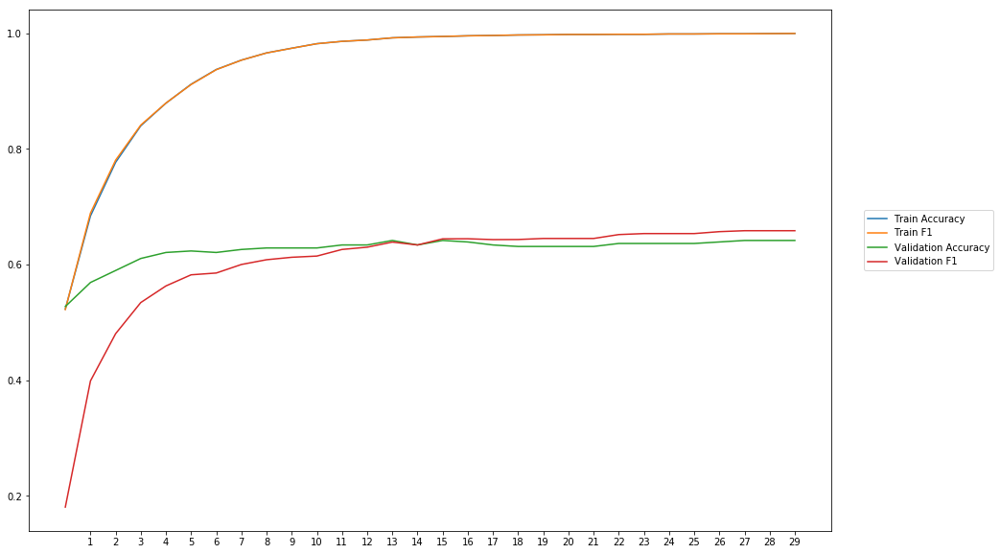

Average Accuracy: 62.55%
Average Precision: 63.59%
Average Recall: 59.24%
Average F1: 60.14%

-----Fold 2--------


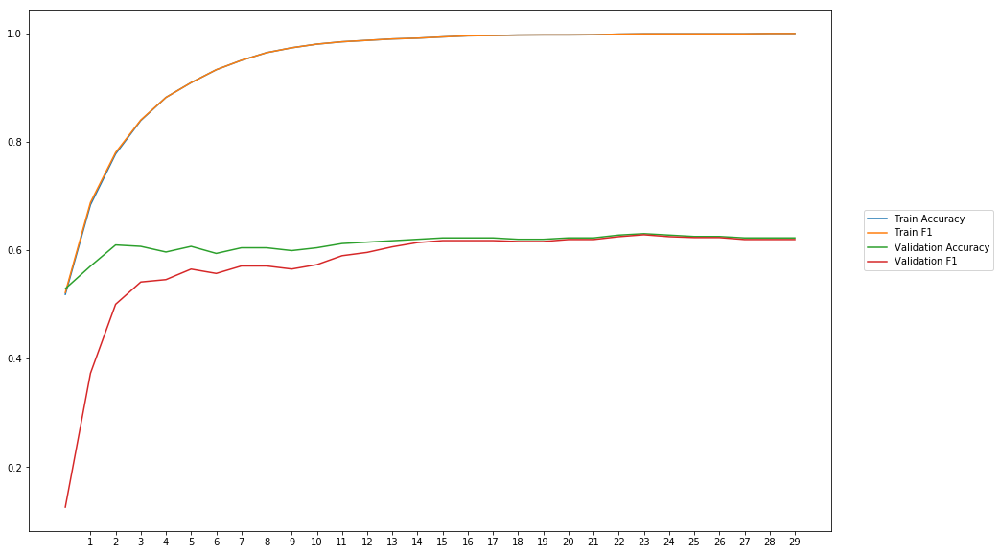

Average Accuracy: 61.14%
Average Precision: 63.26%
Average Recall: 54.71%
Average F1: 57.32%

-----Fold 3--------


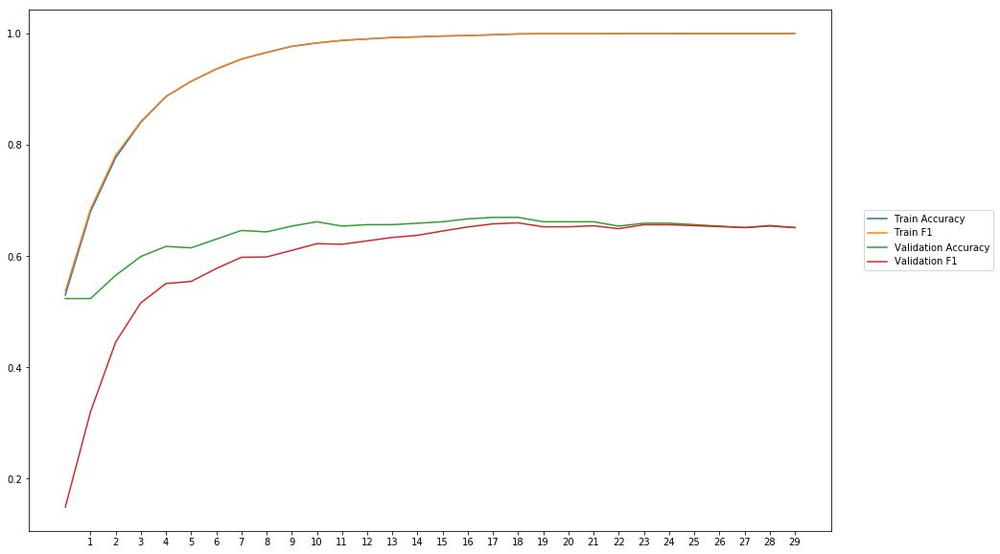

Average Accuracy: 63.97%
Average Precision: 66.18%
Average Recall: 55.83%
Average F1: 59.52%

-----Fold 4--------


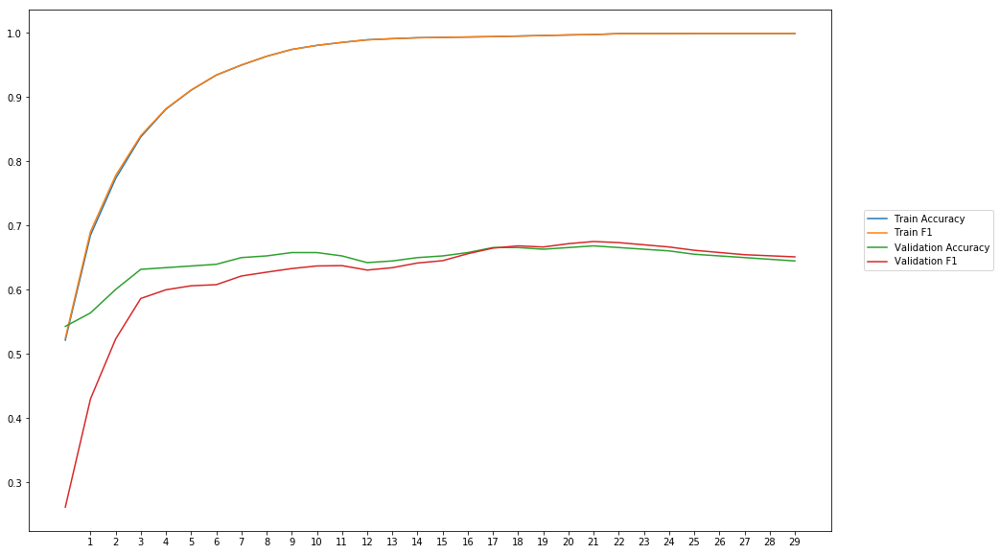

Average Accuracy: 64.46%
Average Precision: 65.74%
Average Recall: 60.10%
Average F1: 62.05%

-----Fold 5--------


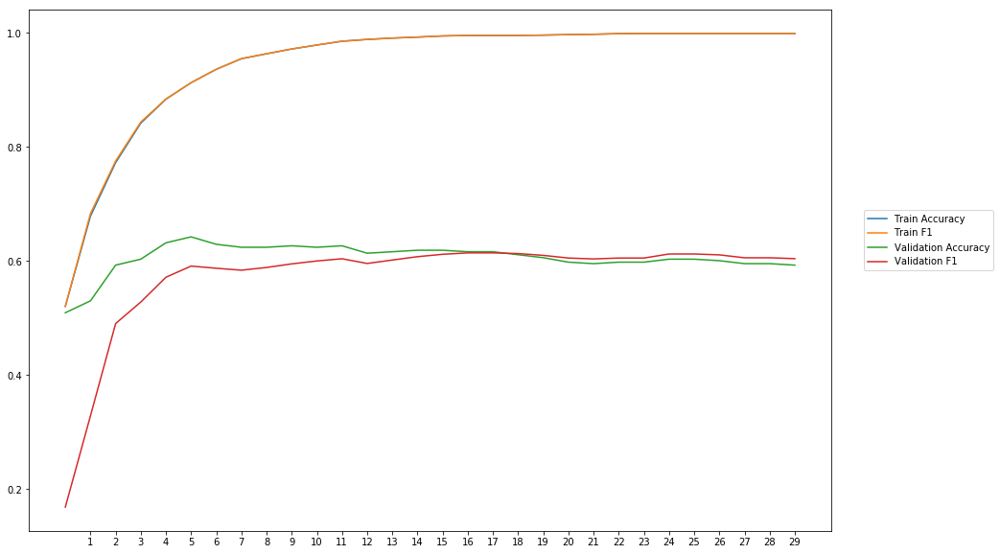

Average Accuracy: 60.53%
Average Precision: 61.76%
Average Recall: 54.97%
Average F1: 57.24%

-----Fold 6--------


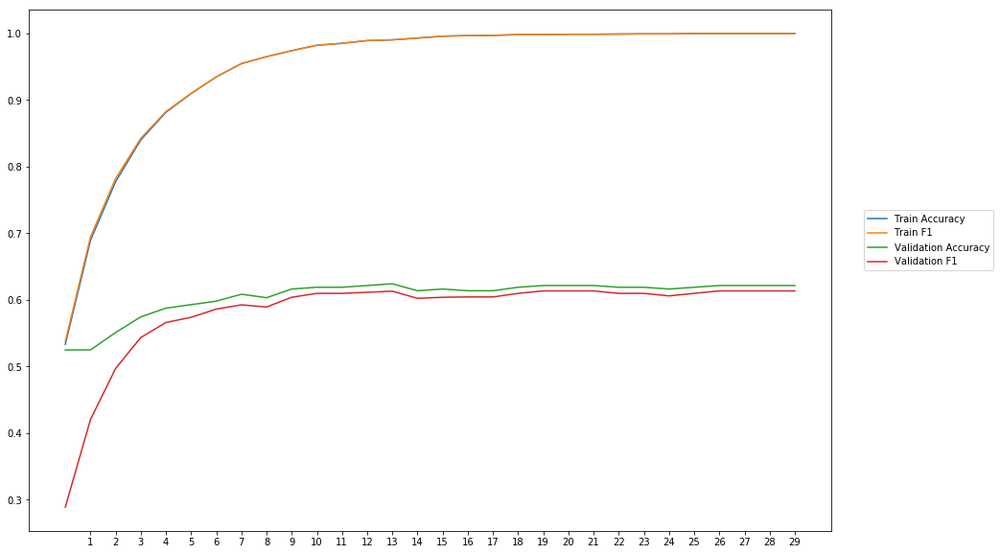

Average Accuracy: 60.54%
Average Precision: 61.21%
Average Recall: 56.06%
Average F1: 58.19%

-----Fold 7--------


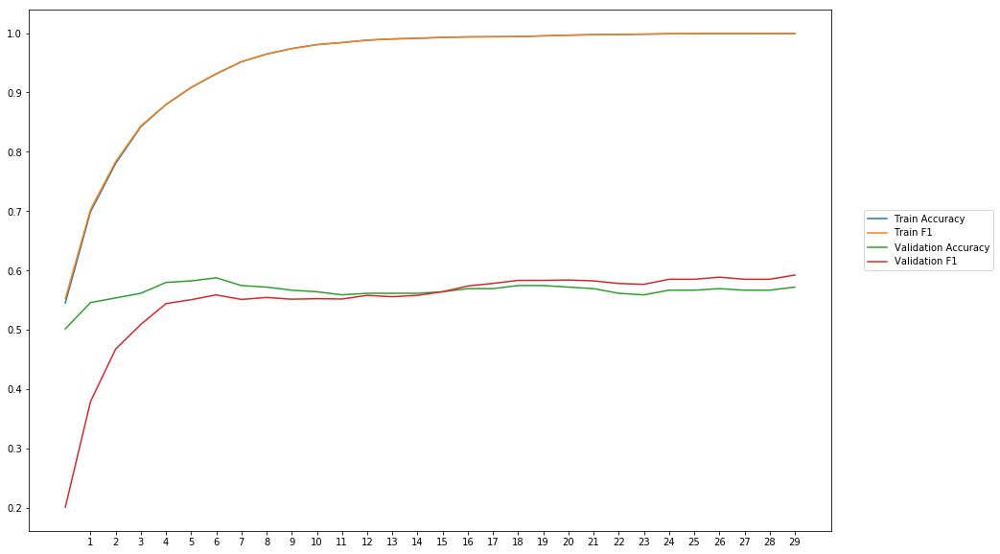

Average Accuracy: 56.50%
Average Precision: 56.69%
Average Recall: 53.86%
Average F1: 54.54%

-----Fold 8--------


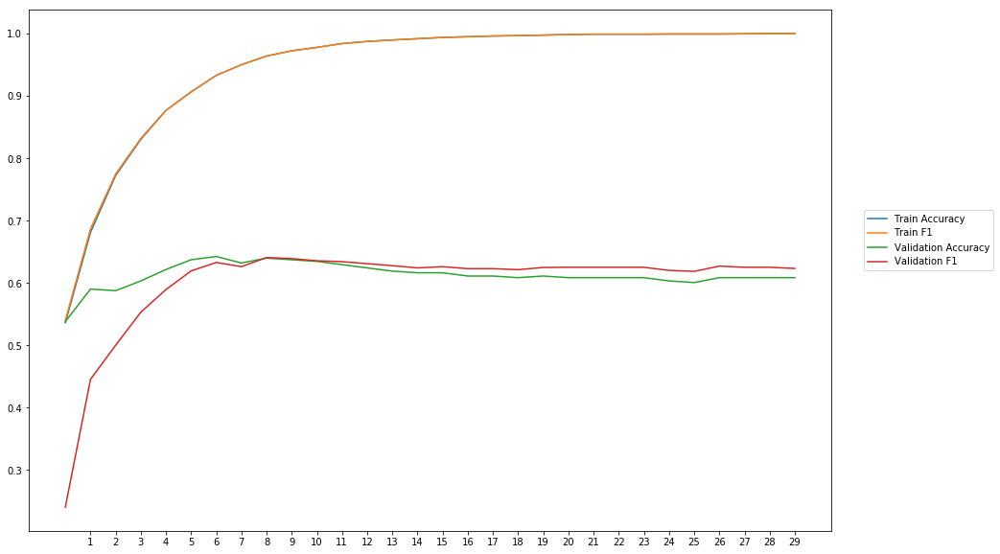

Average Accuracy: 61.26%
Average Precision: 61.81%
Average Recall: 60.03%
Average F1: 59.98%

-----Fold 9--------


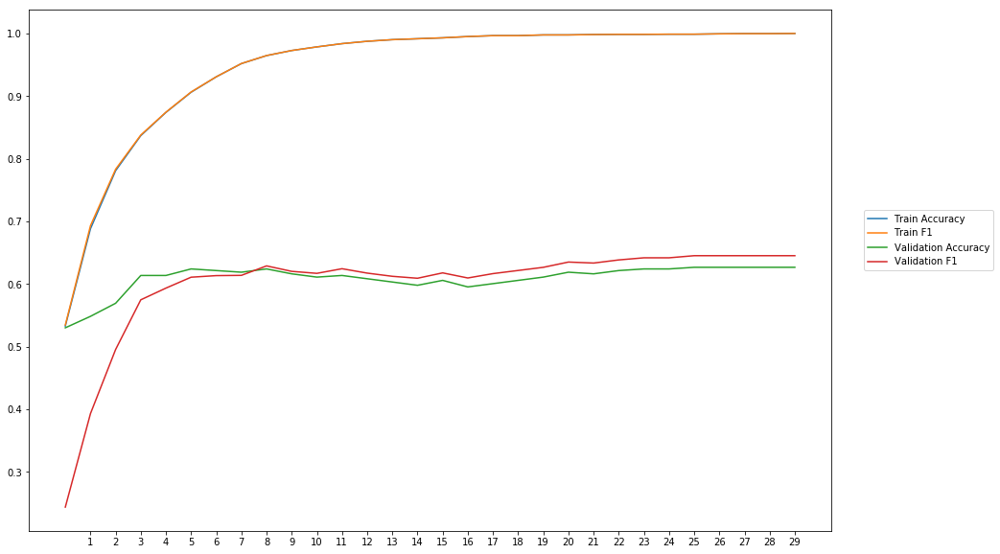

Average Accuracy: 60.90%
Average Precision: 60.88%
Average Recall: 60.54%
Average F1: 59.92%

-----Fold 10--------


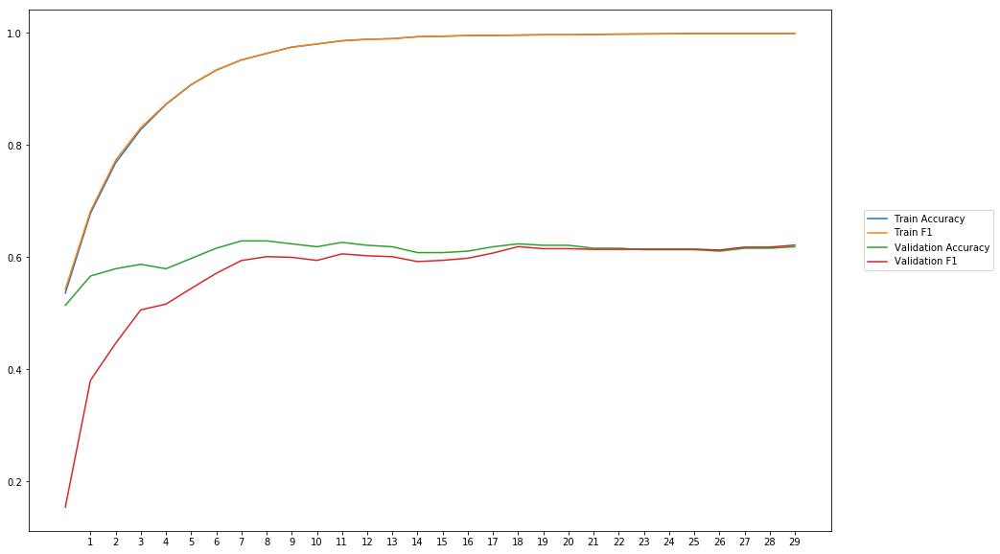

Average Accuracy: 60.86%
Average Precision: 62.46%
Average Recall: 54.14%
Average F1: 57.02%

-------Overallresults-------


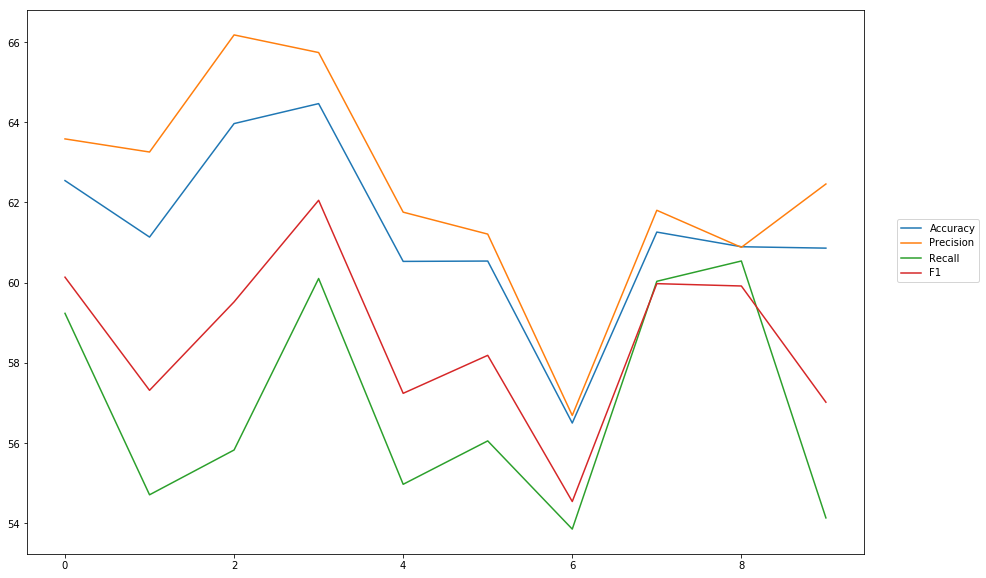

Accuracy: Mean = 61.27% (+/- 2.08%), Max = 64.46%, Min =  56.50%
Precision: Mean = 62.36% (+/- 2.54%), Max = 66.18%, Min =  56.69%
Recall: Mean = 56.95% (+/- 2.57%), Max = 60.54%, Min =  53.86%
F1: Mean = 58.59% (+/- 2.03%), Max = 62.05%, Min =  54.54%


In [11]:
cross_val_two_inputs(model, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'gloVe_6_50')

## Seperate Models combine results

In [12]:
#First part
wv_layer_2 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_2 = wv_layer_2(comment_input_2)
x_first = Dense(600, activation='relu')(embedded_sequences_2)
x_first = Flatten()(x_first)

#Second part
pos_input_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second = Dense(600, activation='relu')(pos_input_2)

#Concatination
concat = concatenate([x_first, x_second])

#x_2 = Flatten()(concat)

preds_2 = Dense(2, activation='softmax')(concat)

model_2 = Model(inputs=[comment_input_2, pos_input_2], outputs=preds_2)
model_2.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 40, 300)      3492600     input_3[0][0]                    
__________________________________________________________________________________________________
dense_3 (Dense)                 (None, 40, 600)      180600      embedding_2[0][0]                
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_2 


-----Fold 1--------


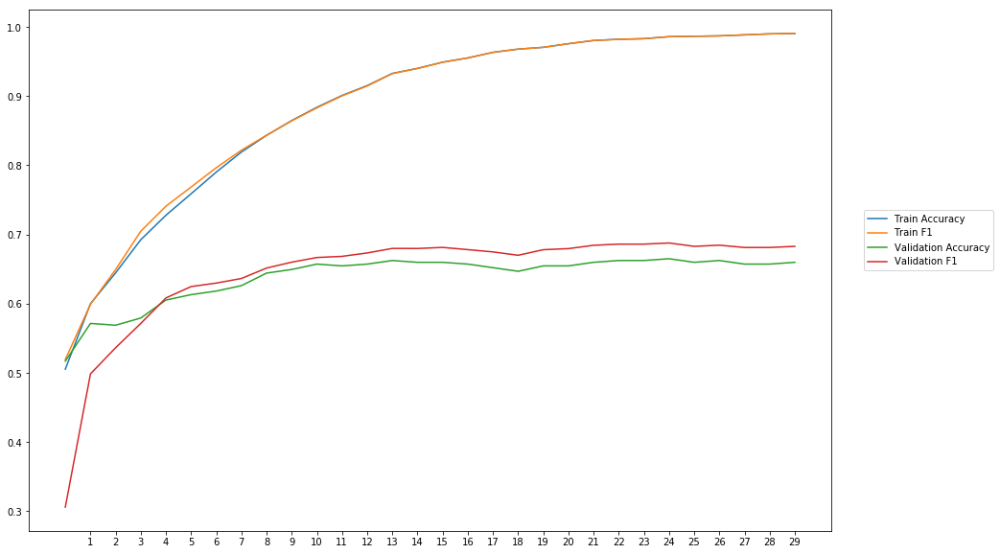

Average Accuracy: 63.84%
Average Precision: 62.57%
Average Recall: 67.15%
Average F1: 64.36%

-----Fold 2--------


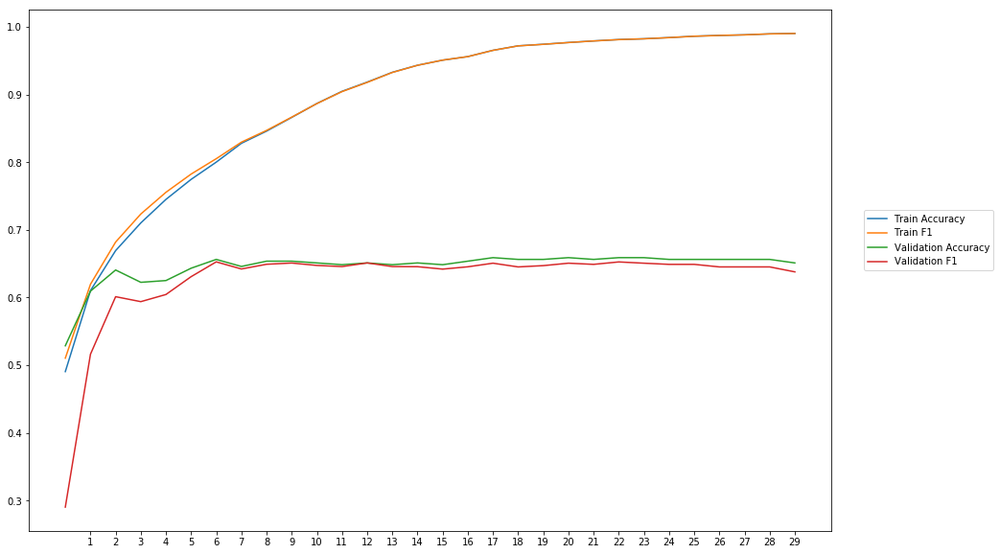

Average Accuracy: 64.56%
Average Precision: 65.36%
Average Recall: 60.72%
Average F1: 62.57%

-----Fold 3--------


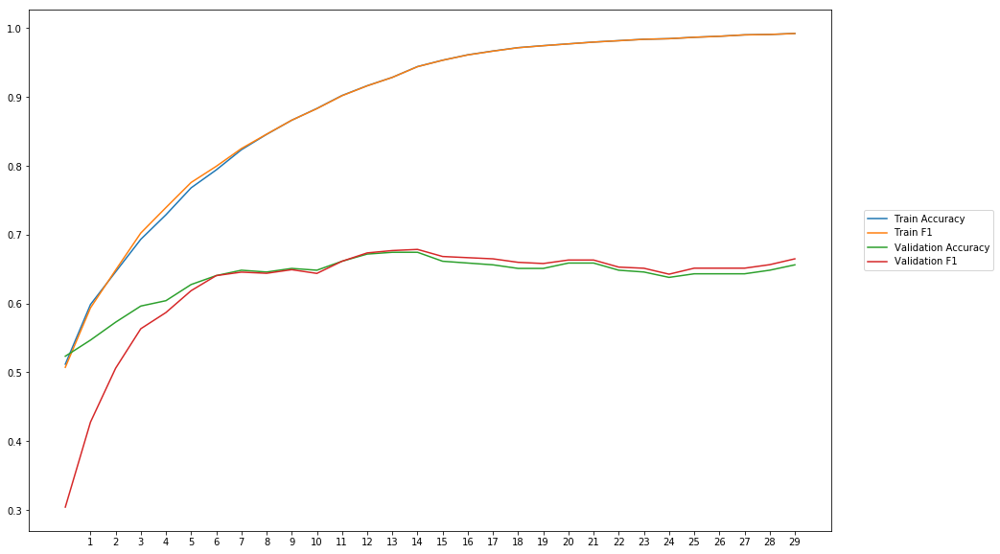

Average Accuracy: 63.84%
Average Precision: 63.63%
Average Recall: 62.50%
Average F1: 62.63%

-----Fold 4--------


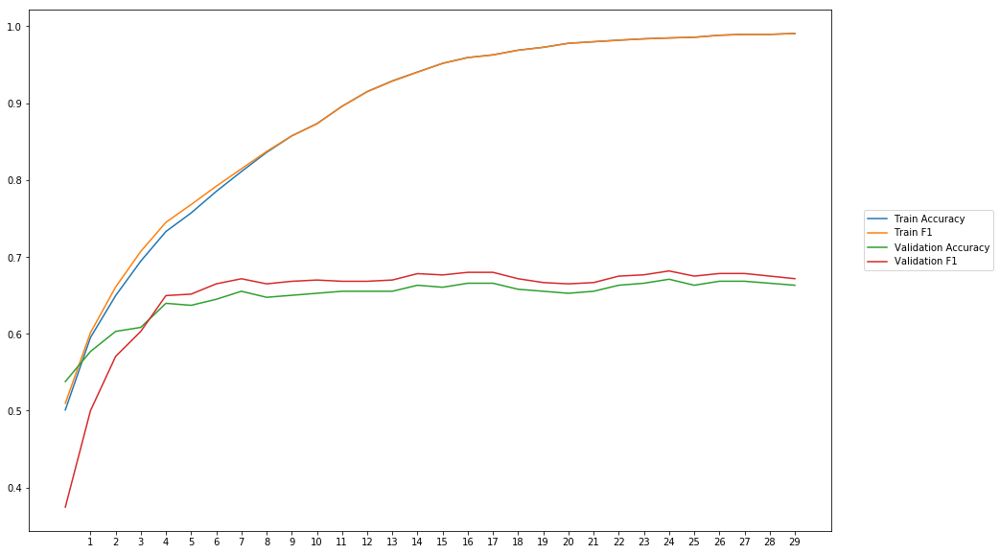

Average Accuracy: 64.75%
Average Precision: 63.89%
Average Recall: 66.75%
Average F1: 64.98%

-----Fold 5--------


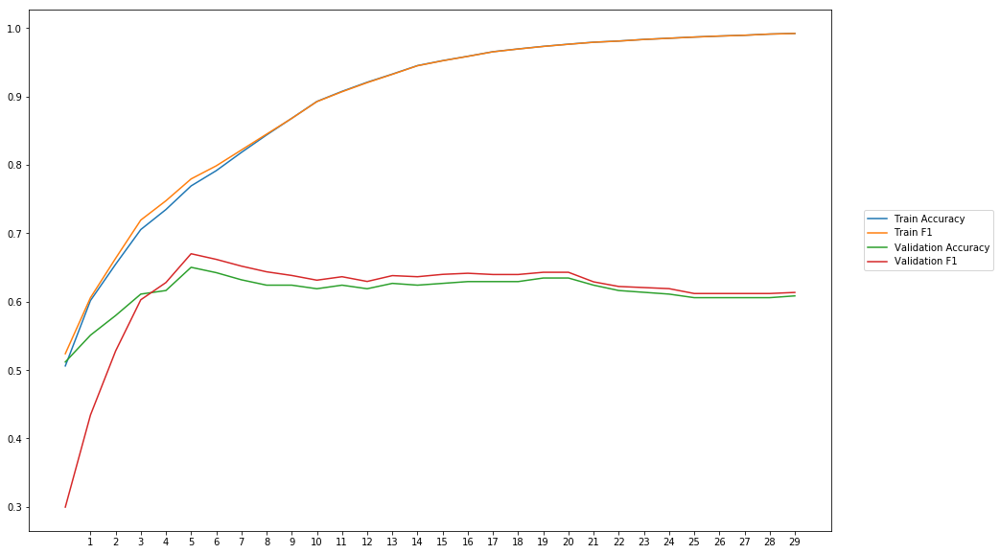

Average Accuracy: 61.44%
Average Precision: 60.94%
Average Recall: 62.08%
Average F1: 61.09%

-----Fold 6--------


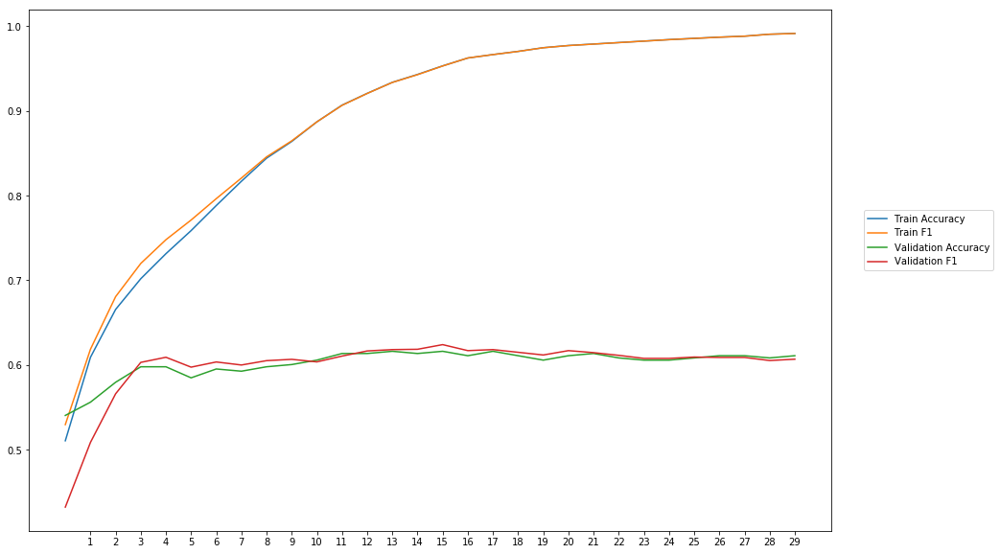

Average Accuracy: 60.20%
Average Precision: 60.03%
Average Recall: 60.09%
Average F1: 59.94%

-----Fold 7--------


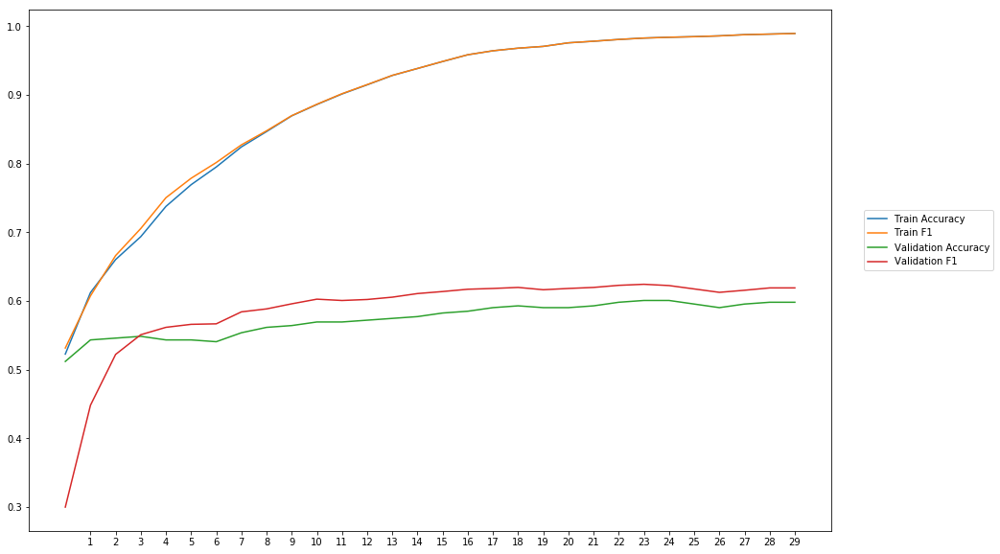

Average Accuracy: 57.38%
Average Precision: 56.57%
Average Recall: 61.66%
Average F1: 58.58%

-----Fold 8--------


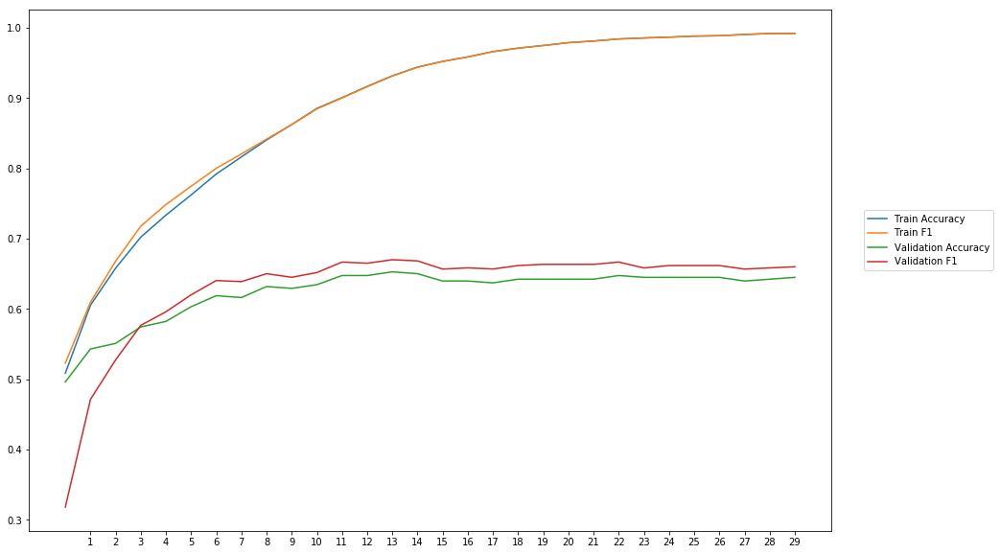

Average Accuracy: 62.39%
Average Precision: 61.17%
Average Recall: 65.62%
Average F1: 63.05%

-----Fold 9--------


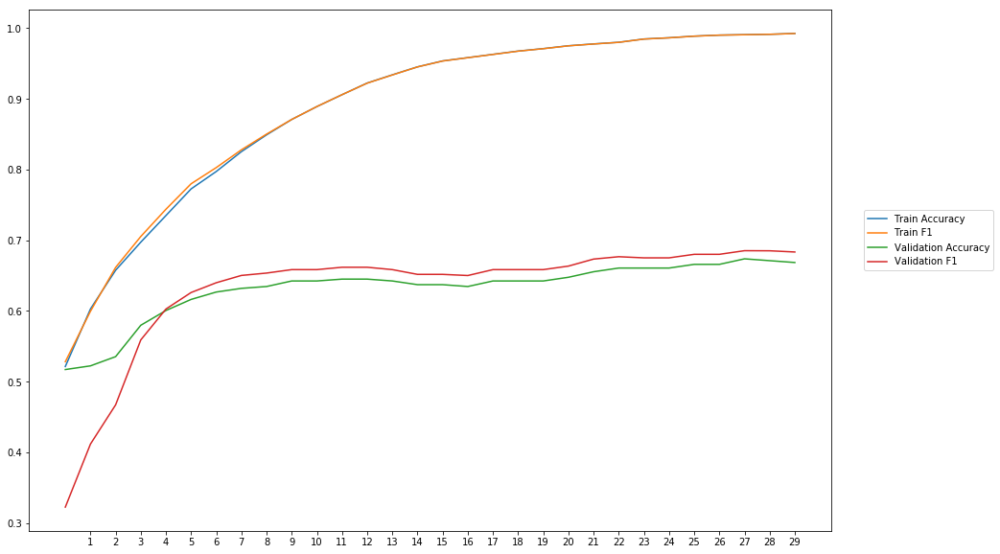

Average Accuracy: 63.15%
Average Precision: 62.15%
Average Recall: 64.96%
Average F1: 63.12%

-----Fold 10--------


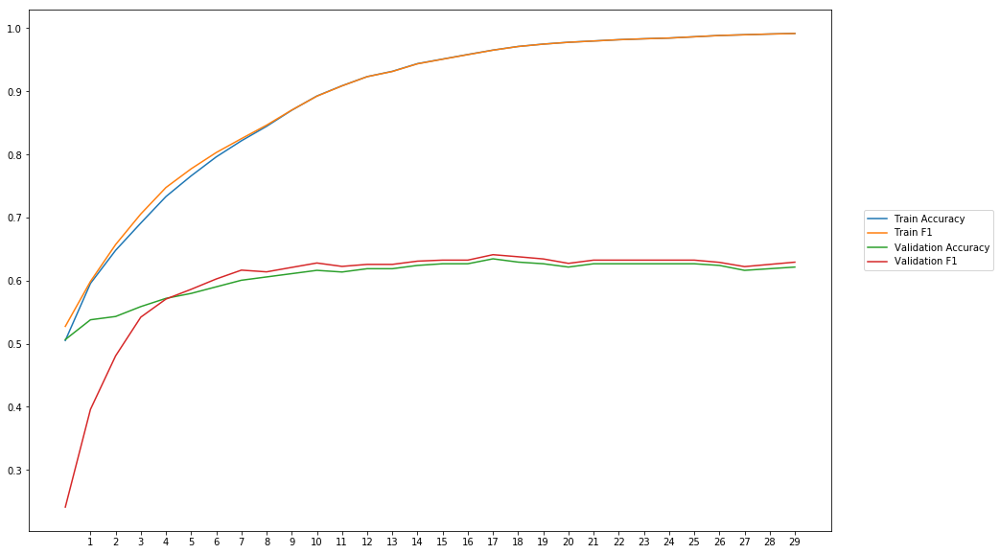

Average Accuracy: 60.58%
Average Precision: 60.27%
Average Recall: 59.93%
Average F1: 59.58%

-------Overallresults-------


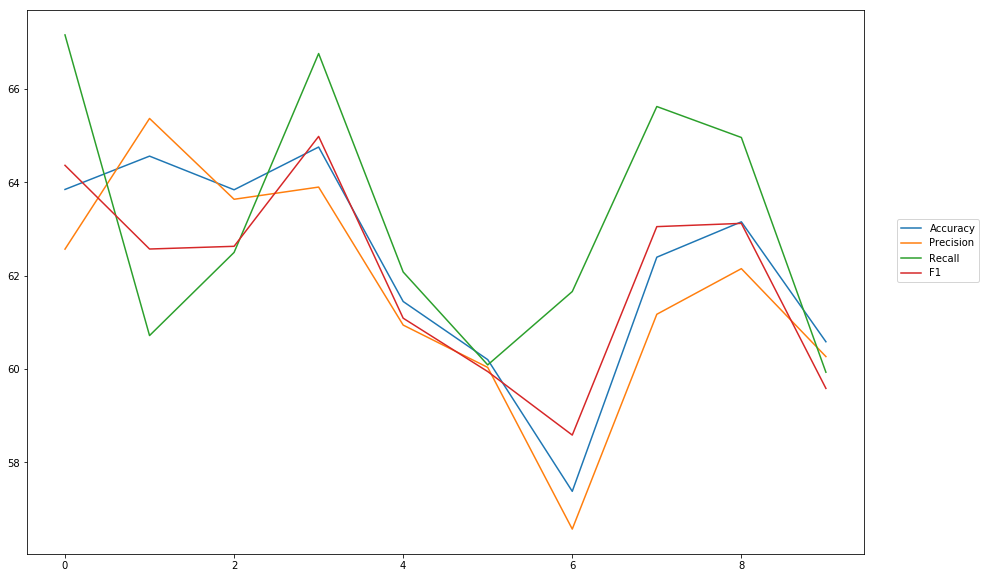

Accuracy: Mean = 62.21% (+/- 2.21%), Max = 64.75%, Min =  57.38%
Precision: Mean = 61.66% (+/- 2.34%), Max = 65.36%, Min =  56.57%
Recall: Mean = 63.14% (+/- 2.60%), Max = 67.15%, Min =  59.93%
F1: Mean = 61.99% (+/- 2.00%), Max = 64.98%, Min =  58.58%


In [14]:
cross_val_two_inputs(model_2, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'separat_models')

## Separate models combine output

### average

In [15]:
#First model
wv_layer_3 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_3 = wv_layer_3(comment_input_3)
x_first = Dense(600, activation='relu')(embedded_sequences_3)
x_first = Flatten()(x_first)
first_preds = Dense(2, activation='softmax')(x_first)

#Second model
pos_input_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second = Dense(600, activation='relu')(pos_input_3)
second_preds = Dense(2, activation='softmax')(x_second)

#Concat outputs
preds_3 = average([first_preds, second_preds])

model_3 = Model(inputs=[comment_input_3, pos_input_3], outputs=preds_3)
model_3.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 40, 300)      3492600     input_5[0][0]                    
__________________________________________________________________________________________________
dense_6 (Dense)                 (None, 40, 600)      180600      embedding_3[0][0]                
__________________________________________________________________________________________________
input_6 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_3 


-----Fold 1--------


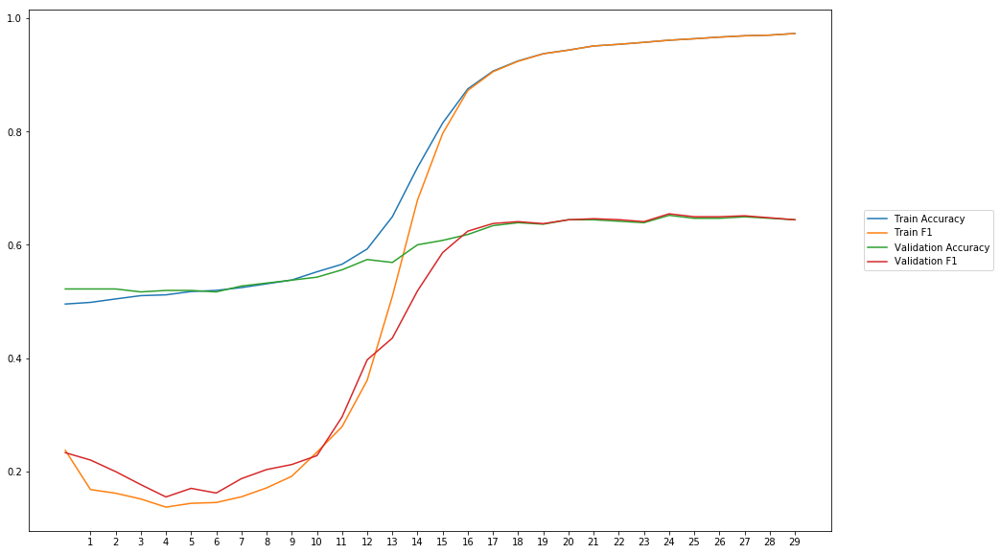

Average Accuracy: 58.89%
Average Precision: 63.94%
Average Recall: 40.52%
Average F1: 44.65%

-----Fold 2--------


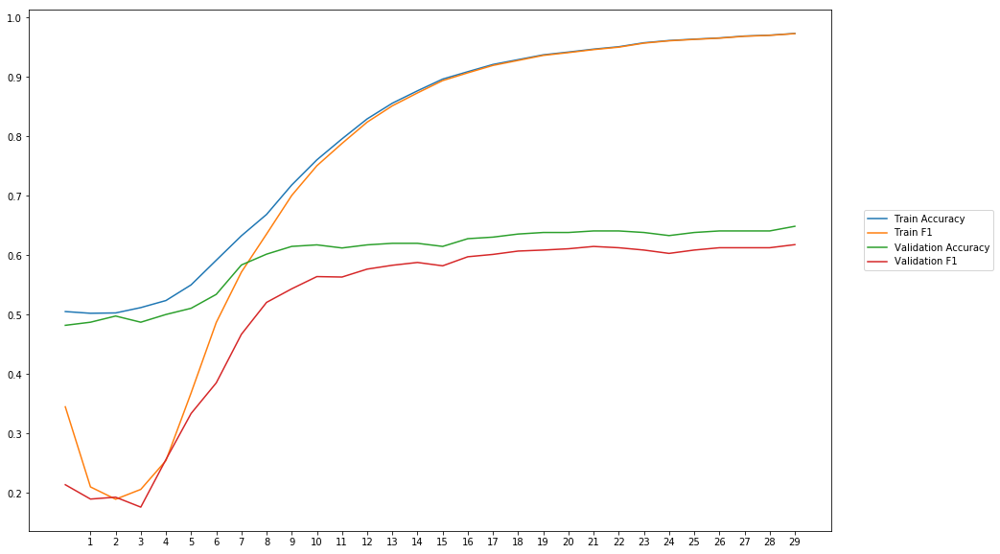

Average Accuracy: 59.76%
Average Precision: 61.22%
Average Recall: 45.15%
Average F1: 50.85%

-----Fold 3--------


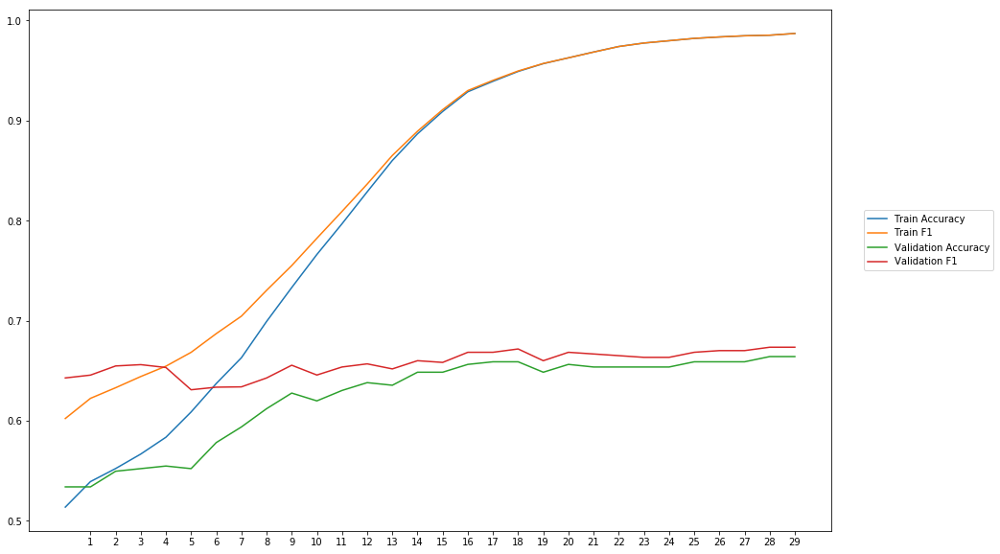

Average Accuracy: 62.35%
Average Precision: 60.82%
Average Recall: 72.44%
Average F1: 65.75%

-----Fold 4--------


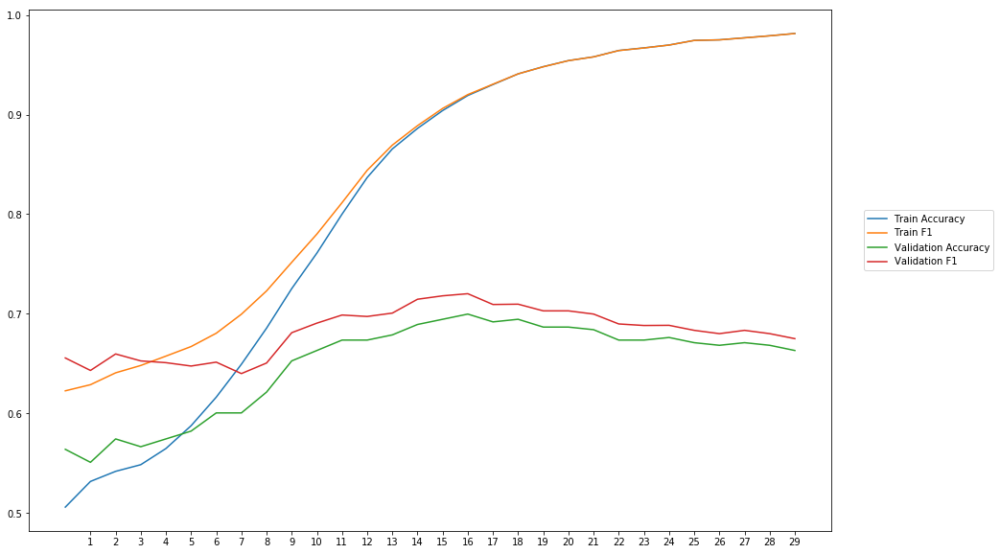

Average Accuracy: 64.90%
Average Precision: 62.81%
Average Recall: 75.18%
Average F1: 68.22%

-----Fold 5--------


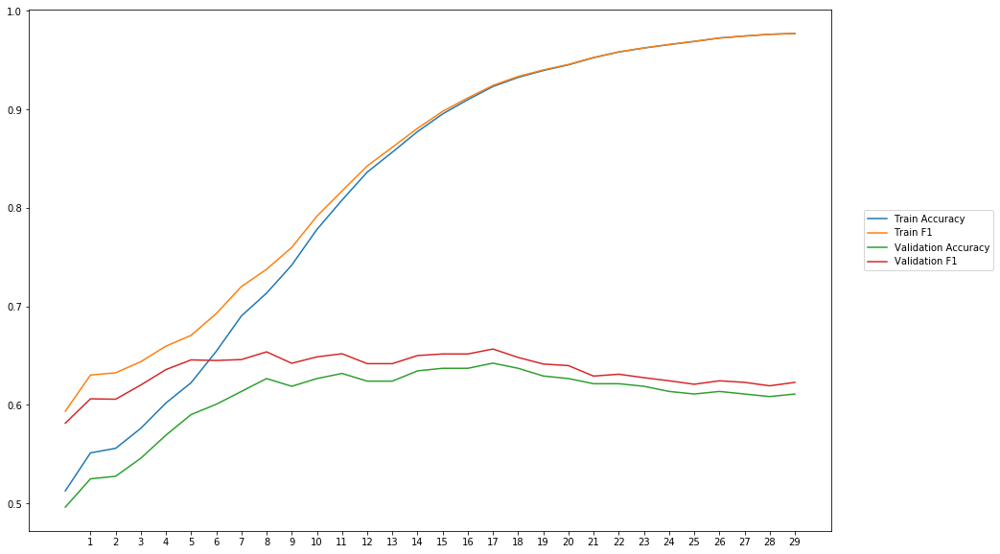

Average Accuracy: 60.64%
Average Precision: 59.49%
Average Recall: 68.29%
Average F1: 63.42%

-----Fold 6--------


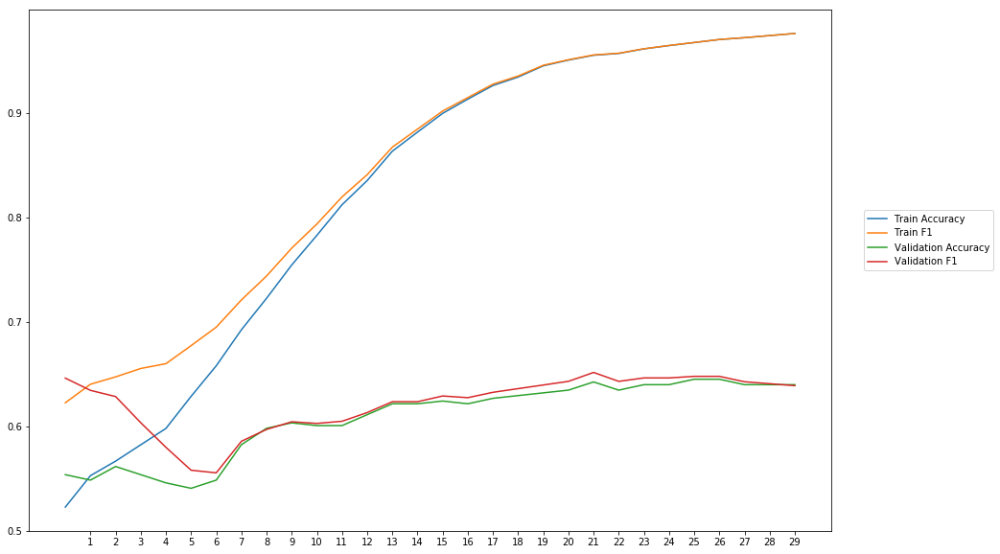

Average Accuracy: 60.74%
Average Precision: 60.14%
Average Recall: 64.89%
Average F1: 62.23%

-----Fold 7--------


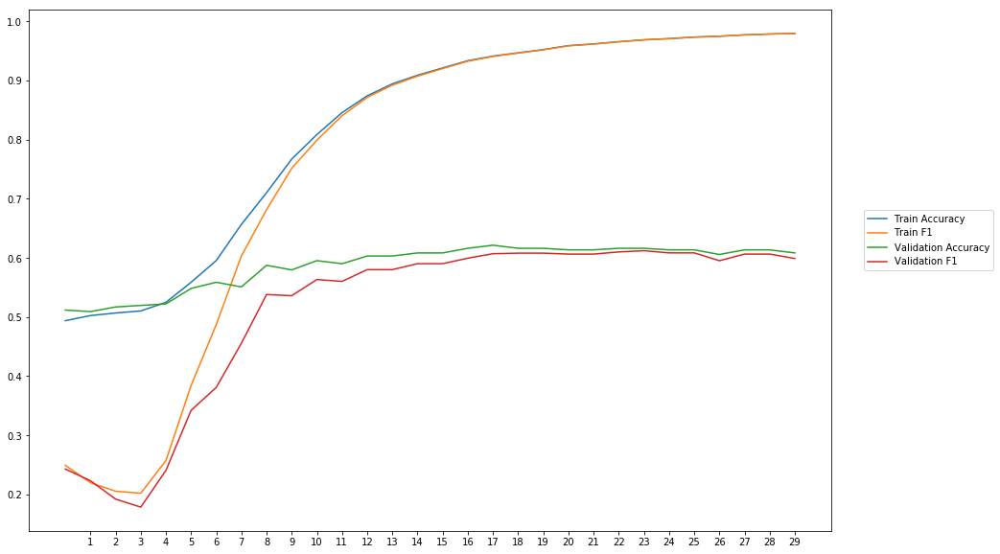

Average Accuracy: 58.70%
Average Precision: 60.64%
Average Recall: 47.09%
Average F1: 50.92%

-----Fold 8--------


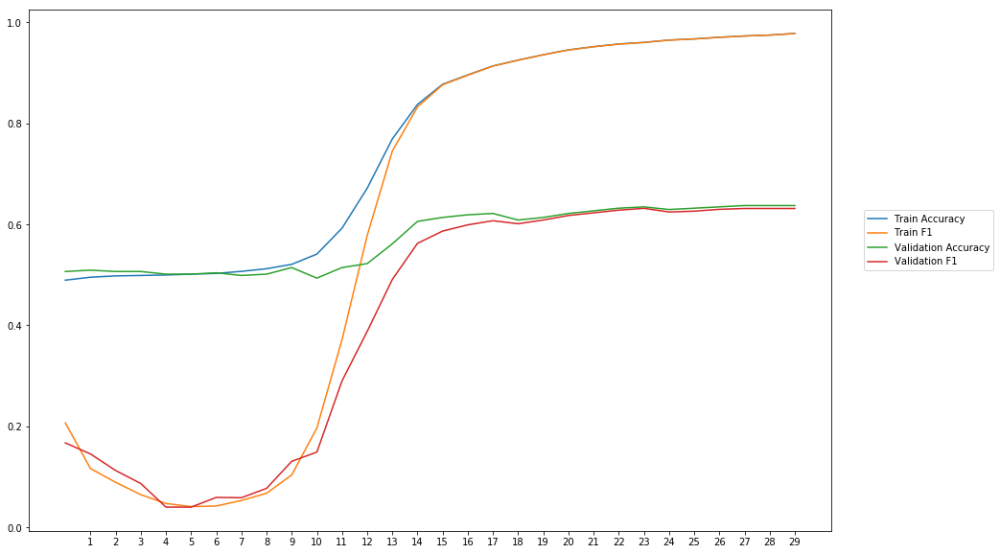

Average Accuracy: 57.15%
Average Precision: 58.33%
Average Recall: 37.16%
Average F1: 40.25%

-----Fold 9--------


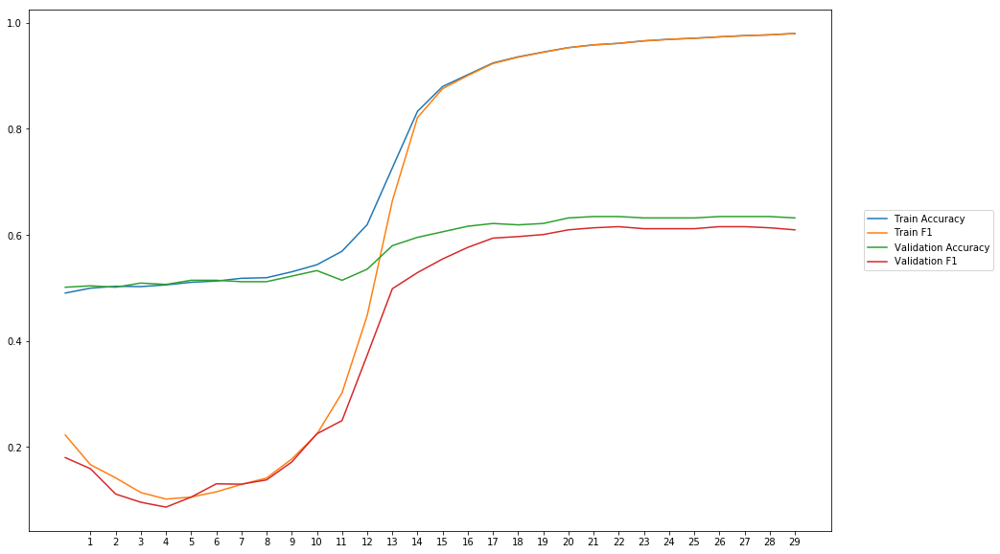

Average Accuracy: 57.56%
Average Precision: 61.25%
Average Recall: 35.74%
Average F1: 40.78%

-----Fold 10--------


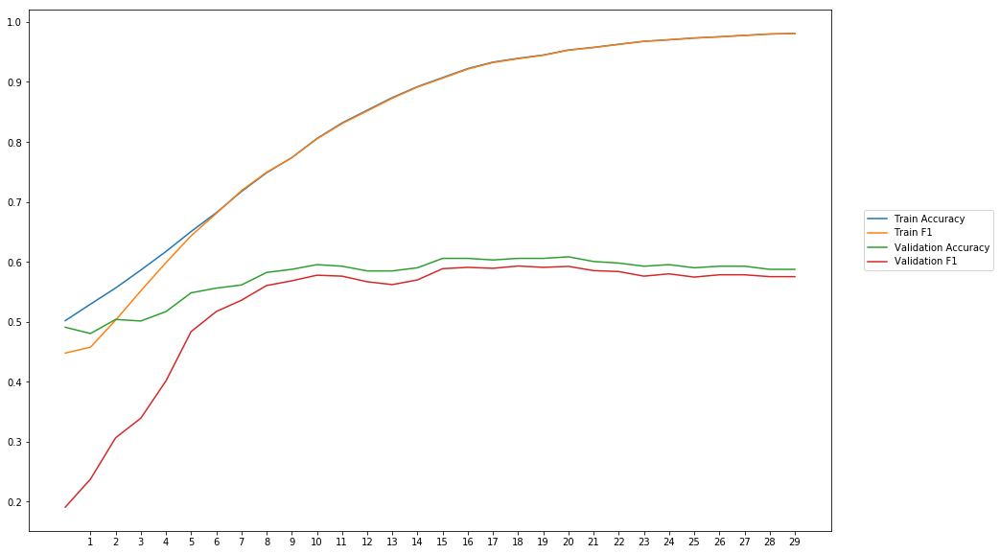

Average Accuracy: 57.49%
Average Precision: 57.85%
Average Recall: 49.23%
Average F1: 52.48%

-------Overallresults-------


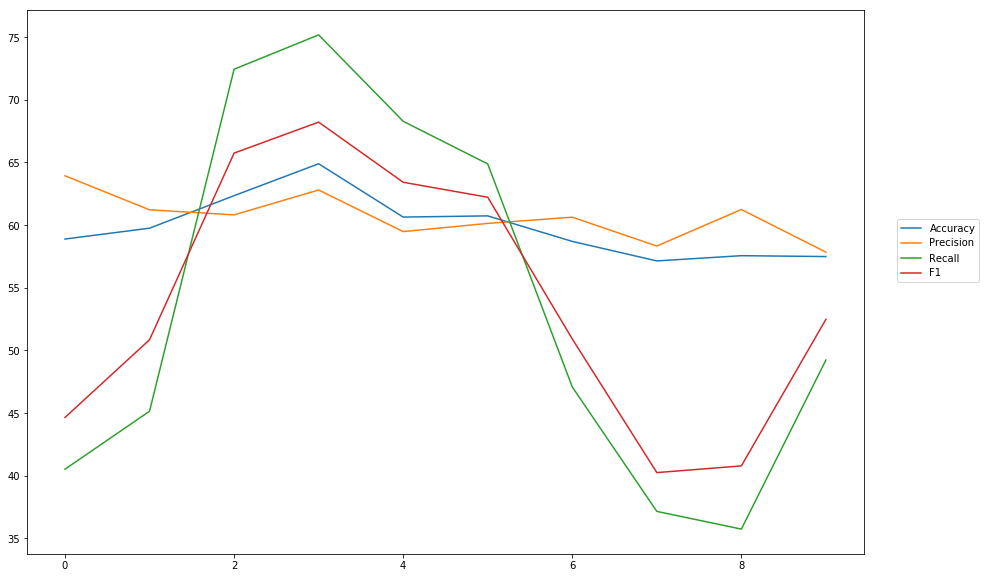

Accuracy: Mean = 59.82% (+/- 2.31%), Max = 64.90%, Min =  57.15%
Precision: Mean = 60.65% (+/- 1.76%), Max = 63.94%, Min =  57.85%
Recall: Mean = 53.57% (+/- 14.34%), Max = 75.18%, Min =  35.74%
F1: Mean = 53.96% (+/- 9.85%), Max = 68.22%, Min =  40.25%


In [16]:
cross_val_two_inputs(model_3, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'combined_outputs')

### maximum

In [17]:
#First model
wv_layer_4 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_4 = wv_layer_4(comment_input_4)
x_first_2 = Dense(600, activation='relu')(embedded_sequences_4)
x_first_2 = Flatten()(x_first_2)
first_preds_2 = Dense(2, activation='softmax')(x_first_2)

#Second model
pos_input_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_2 = Dense(600, activation='relu')(pos_input_4)
second_preds_2 = Dense(2, activation='softmax')(x_second_2)

#Concat outputs
preds_4 = maximum([first_preds_2, second_preds_2])

model_4 = Model(inputs=[comment_input_4, pos_input_4], outputs=preds_4)
model_4.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 40, 300)      3492600     input_7[0][0]                    
__________________________________________________________________________________________________
dense_10 (Dense)                (None, 40, 600)      180600      embedding_4[0][0]                
__________________________________________________________________________________________________
input_8 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_4 


-----Fold 1--------


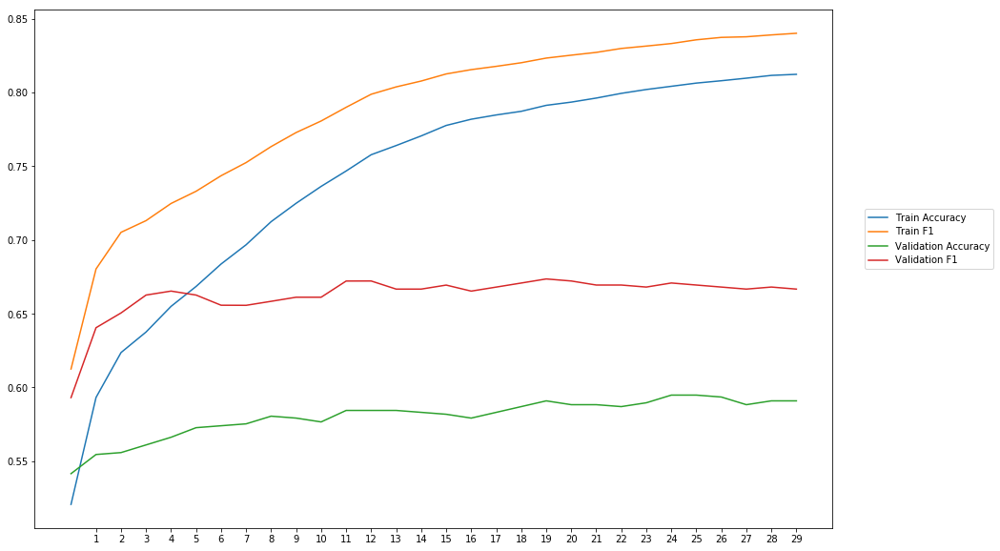

Average Accuracy: 58.01%
Average Precision: 54.90%
Average Recall: 83.63%
Average F1: 66.27%

-----Fold 2--------


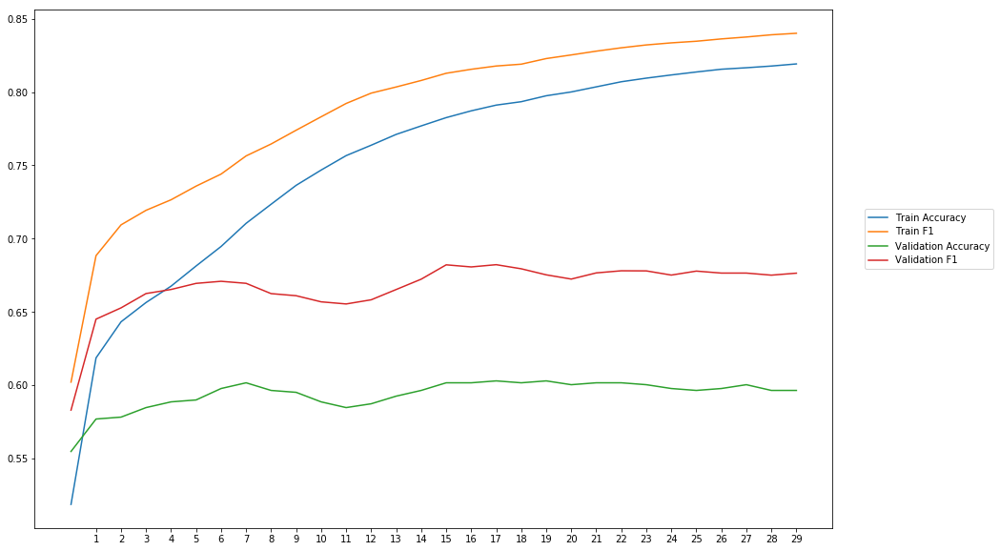

Average Accuracy: 59.37%
Average Precision: 56.11%
Average Recall: 82.37%
Average F1: 66.71%

-----Fold 3--------


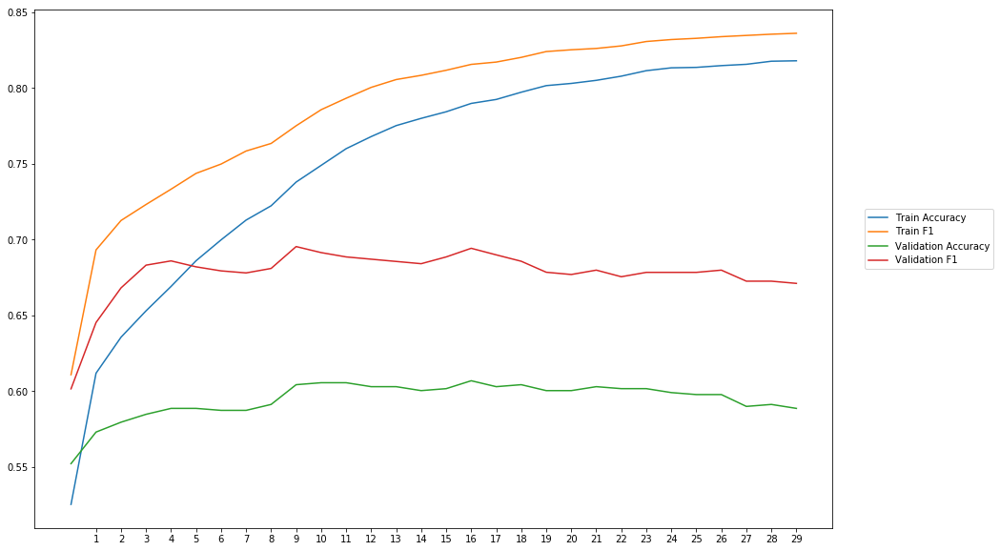

Average Accuracy: 59.46%
Average Precision: 57.66%
Average Recall: 82.30%
Average F1: 67.78%

-----Fold 4--------


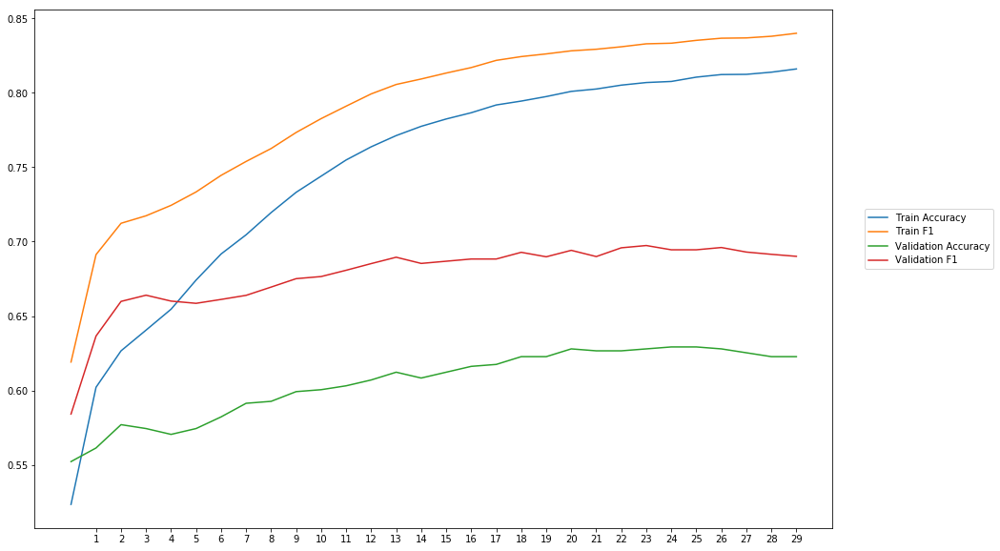

Average Accuracy: 60.55%
Average Precision: 57.50%
Average Recall: 82.72%
Average F1: 67.78%

-----Fold 5--------


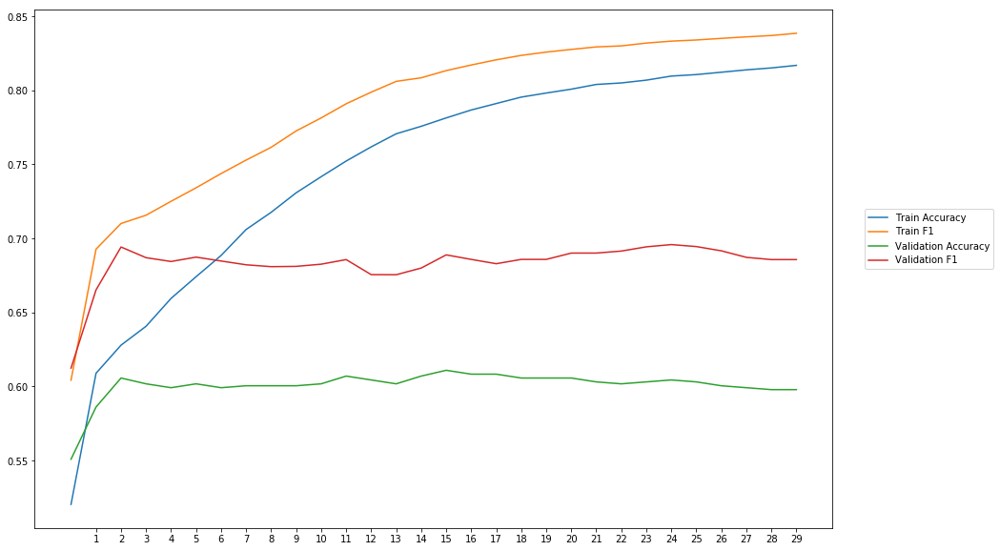

Average Accuracy: 60.08%
Average Precision: 58.49%
Average Recall: 82.25%
Average F1: 68.32%

-----Fold 6--------


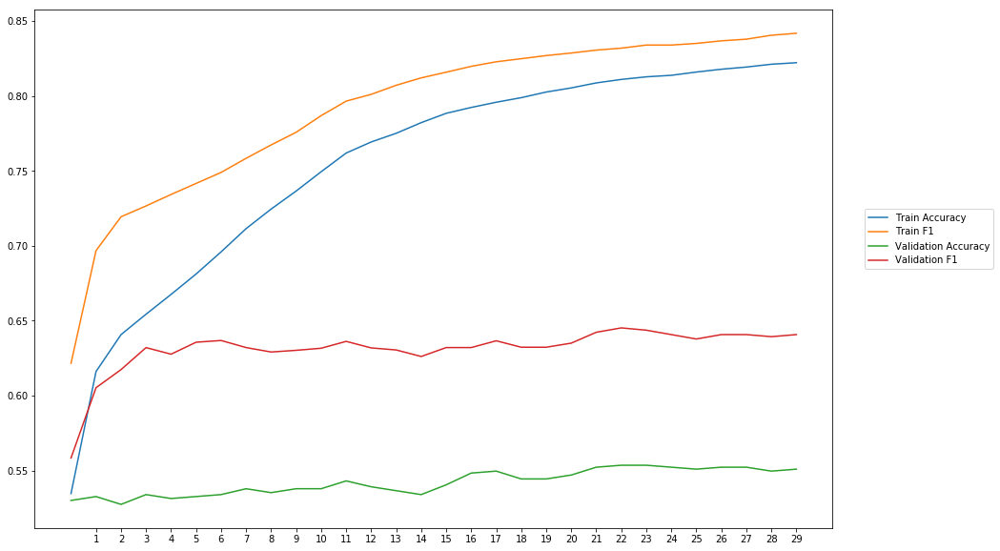

Average Accuracy: 54.22%
Average Precision: 53.88%
Average Recall: 76.27%
Average F1: 63.10%

-----Fold 7--------


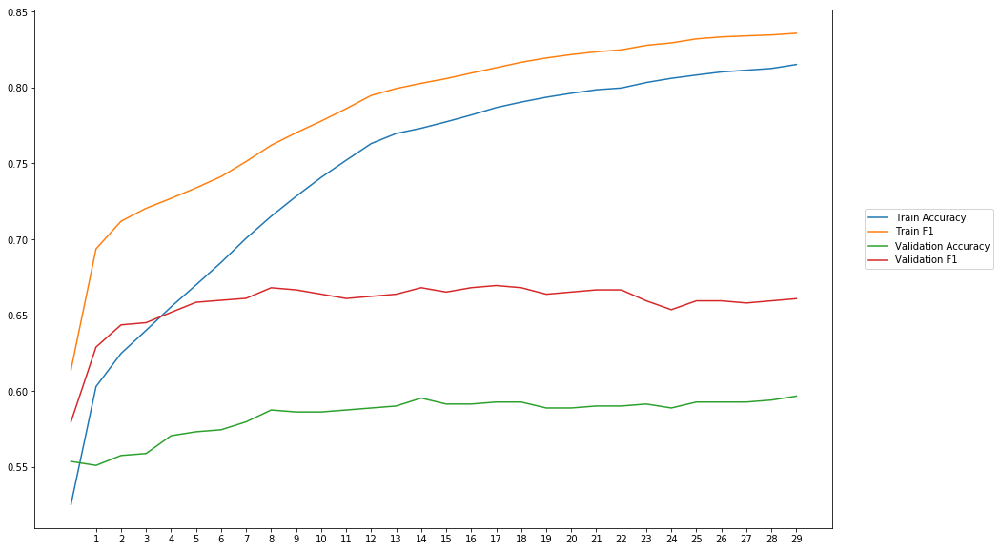

Average Accuracy: 58.38%
Average Precision: 55.55%
Average Recall: 80.68%
Average F1: 65.75%

-----Fold 8--------


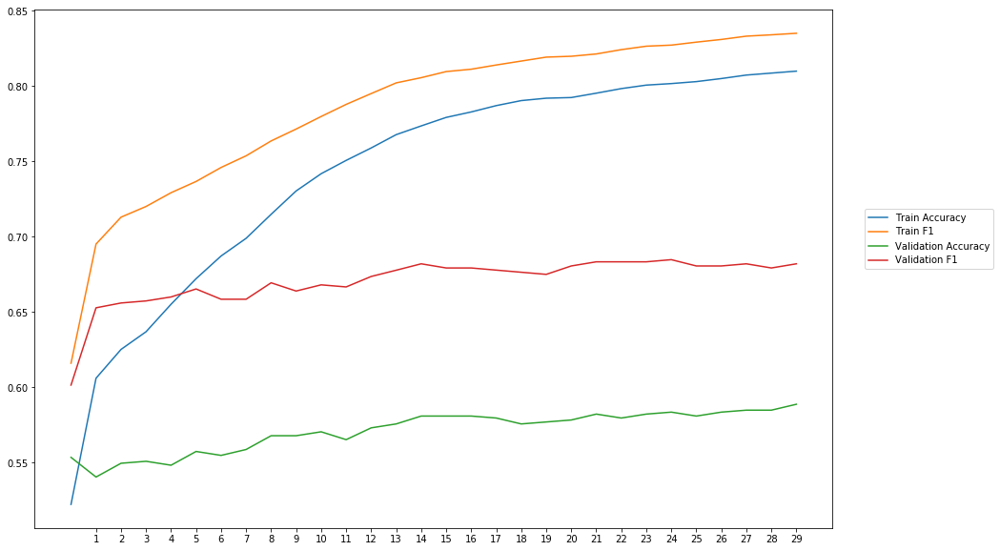

Average Accuracy: 57.13%
Average Precision: 55.72%
Average Recall: 84.40%
Average F1: 67.06%

-----Fold 9--------


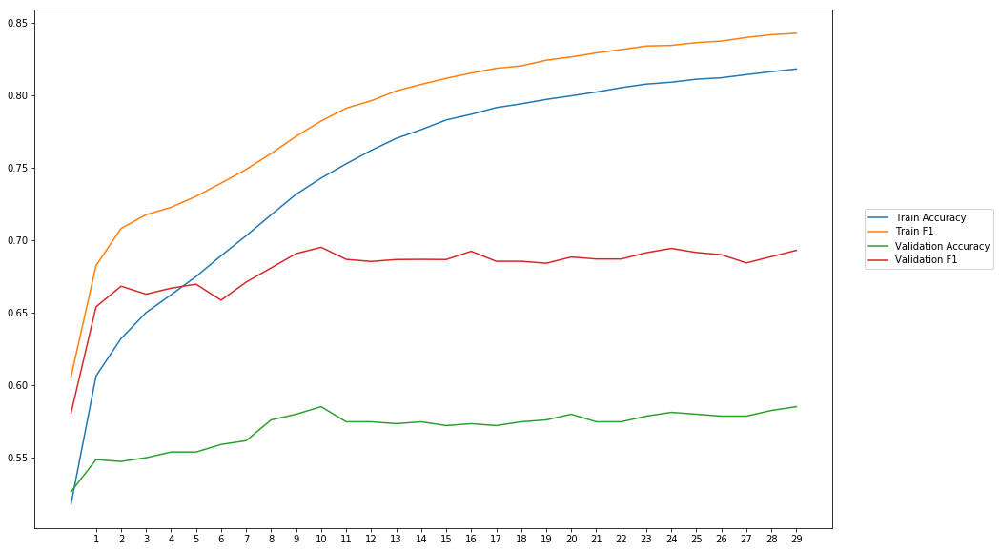

Average Accuracy: 56.98%
Average Precision: 57.38%
Average Recall: 83.23%
Average F1: 67.89%

-----Fold 10--------


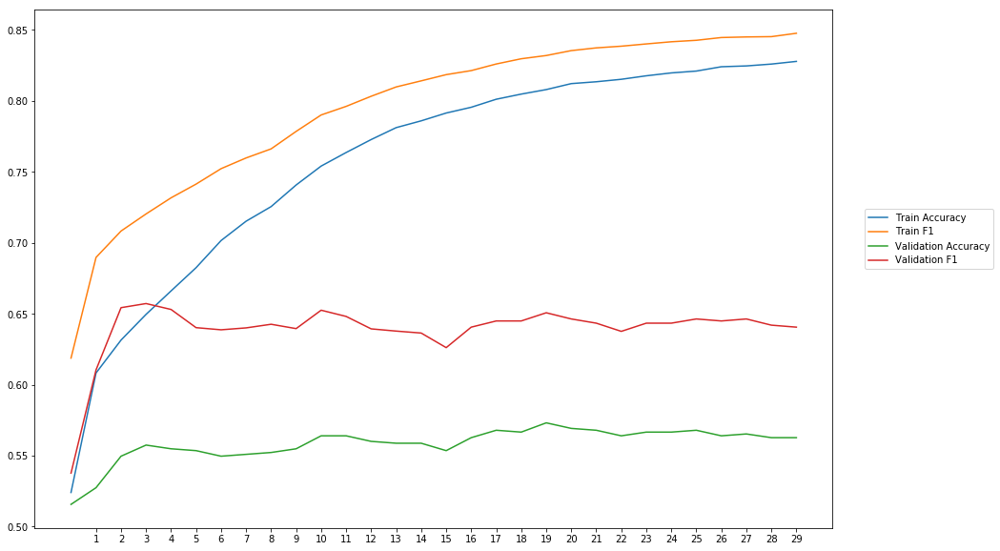

Average Accuracy: 55.84%
Average Precision: 54.45%
Average Recall: 77.45%
Average F1: 63.89%

-------Overallresults-------


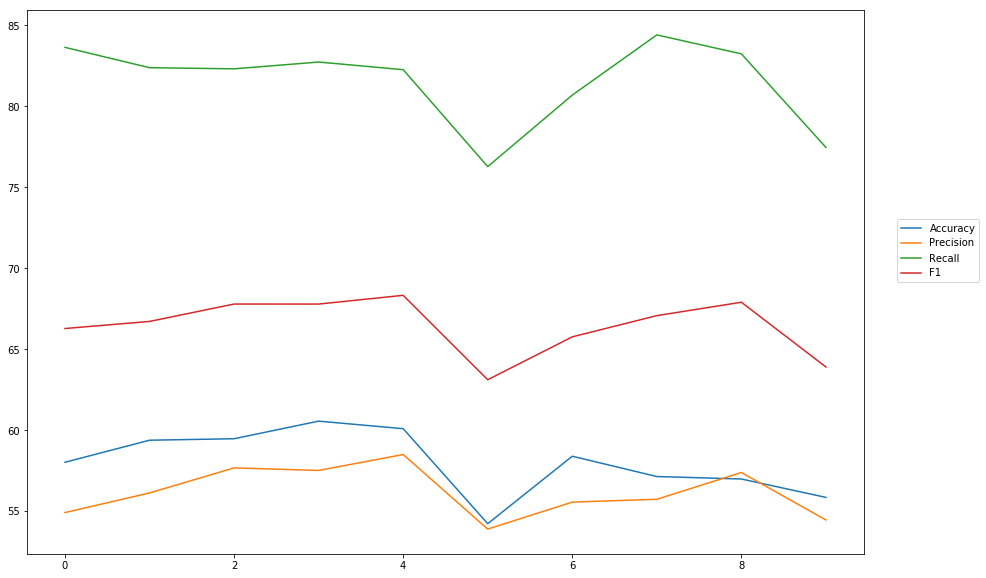

Accuracy: Mean = 58.00% (+/- 1.89%), Max = 60.55%, Min =  54.22%
Precision: Mean = 56.16% (+/- 1.46%), Max = 58.49%, Min =  53.88%
Recall: Mean = 81.53% (+/- 2.53%), Max = 84.40%, Min =  76.27%
F1: Mean = 66.45% (+/- 1.67%), Max = 68.32%, Min =  63.10%


In [18]:
cross_val_two_inputs(model_4, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'combined_outputs_max')

### minimum

In [19]:
#First model
wv_layer_5 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_5 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_5 = wv_layer_5(comment_input_5)
x_first_3 = Dense(600, activation='relu')(embedded_sequences_5)
x_first_3 = Flatten()(x_first_3)
first_preds_3 = Dense(2, activation='softmax')(x_first_3)

#Second model
pos_input_5 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_3 = Dense(600, activation='relu')(pos_input_5)
second_preds_3 = Dense(2, activation='softmax')(x_second_3)

#Concat outputs
preds_5 = minimum([first_preds_3, second_preds_3])

model_5 = Model(inputs=[comment_input_5, pos_input_5], outputs=preds_5)
model_5.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_5 (Embedding)         (None, 40, 300)      3492600     input_9[0][0]                    
__________________________________________________________________________________________________
dense_14 (Dense)                (None, 40, 600)      180600      embedding_5[0][0]                
__________________________________________________________________________________________________
input_10 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_5 


-----Fold 1--------


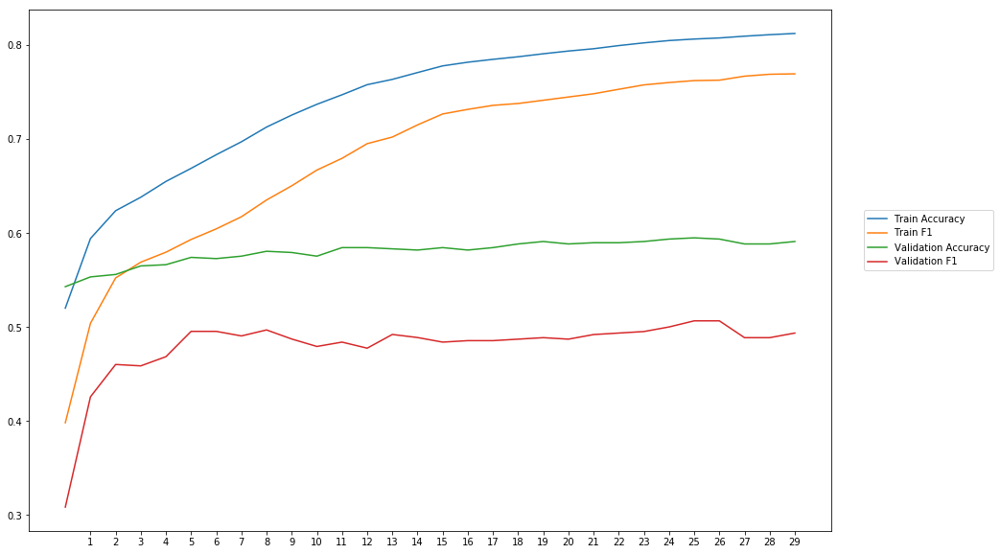

Average Accuracy: 58.04%
Average Precision: 63.76%
Average Recall: 38.59%
Average F1: 47.96%

-----Fold 2--------


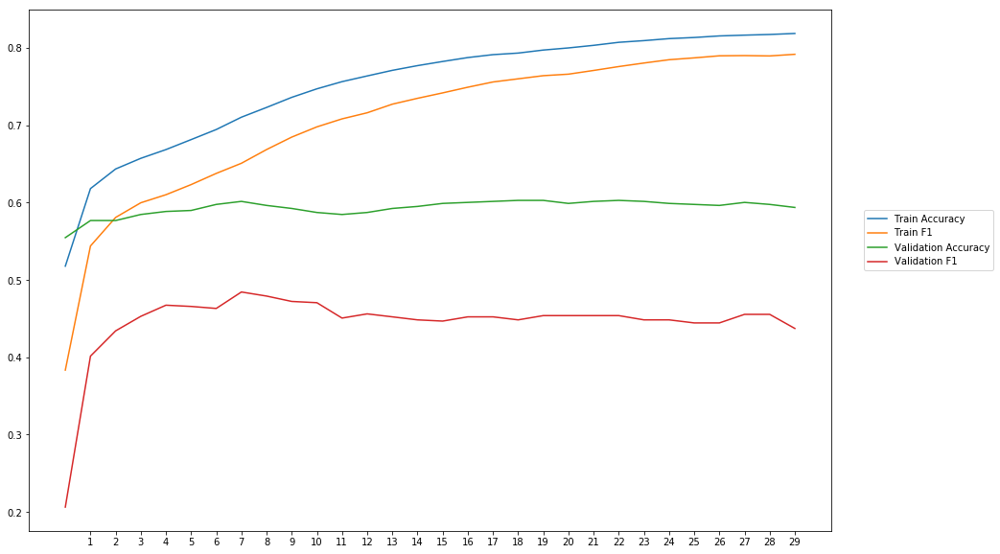

Average Accuracy: 59.34%
Average Precision: 69.79%
Average Recall: 32.90%
Average F1: 44.51%

-----Fold 3--------


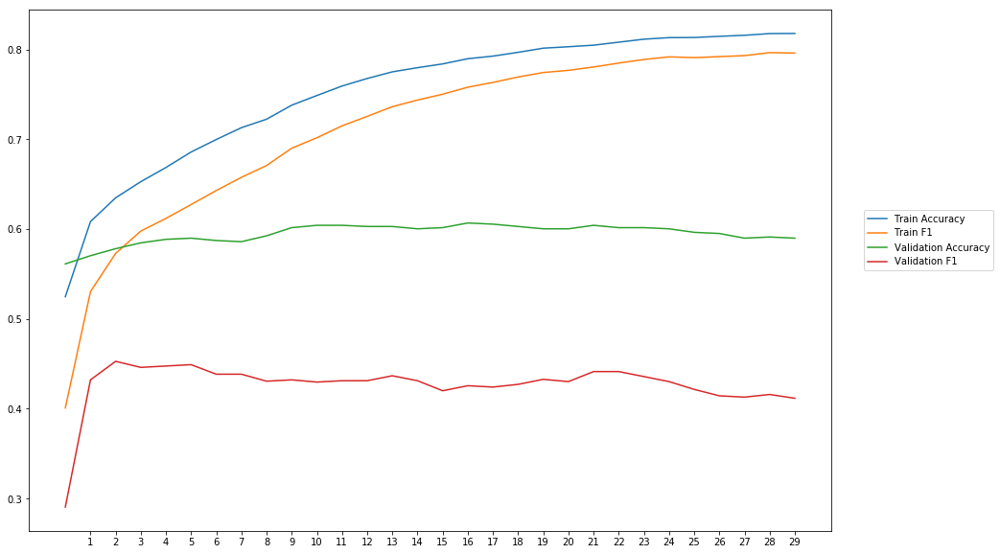

Average Accuracy: 59.47%
Average Precision: 65.65%
Average Recall: 31.69%
Average F1: 42.67%

-----Fold 4--------


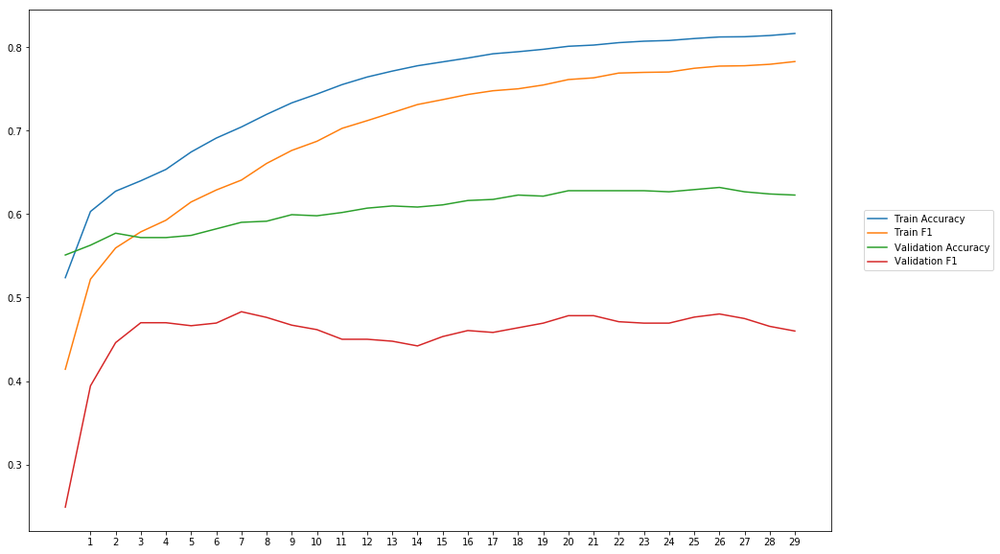

Average Accuracy: 60.53%
Average Precision: 72.05%
Average Recall: 33.51%
Average F1: 45.57%

-----Fold 5--------


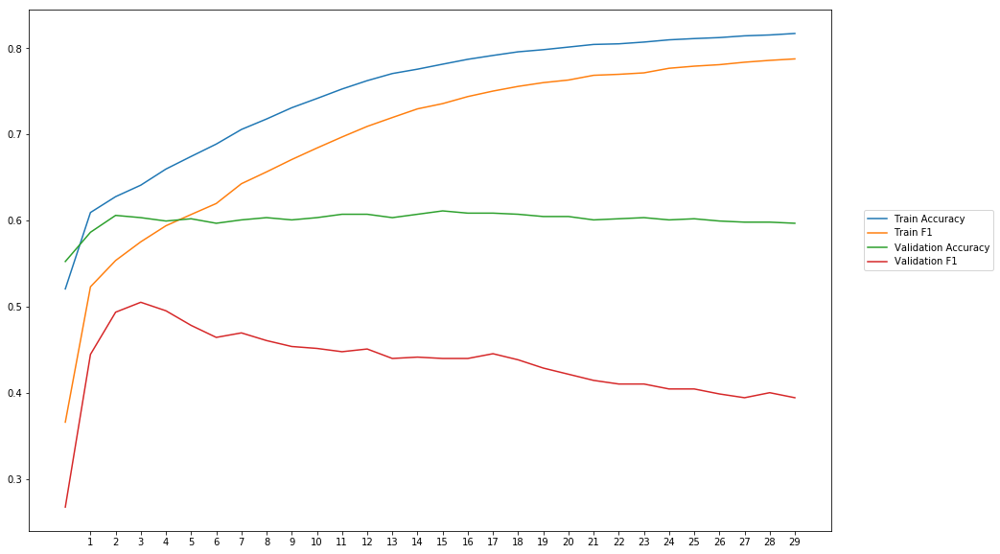

Average Accuracy: 60.07%
Average Precision: 66.41%
Average Recall: 32.32%
Average F1: 43.35%

-----Fold 6--------


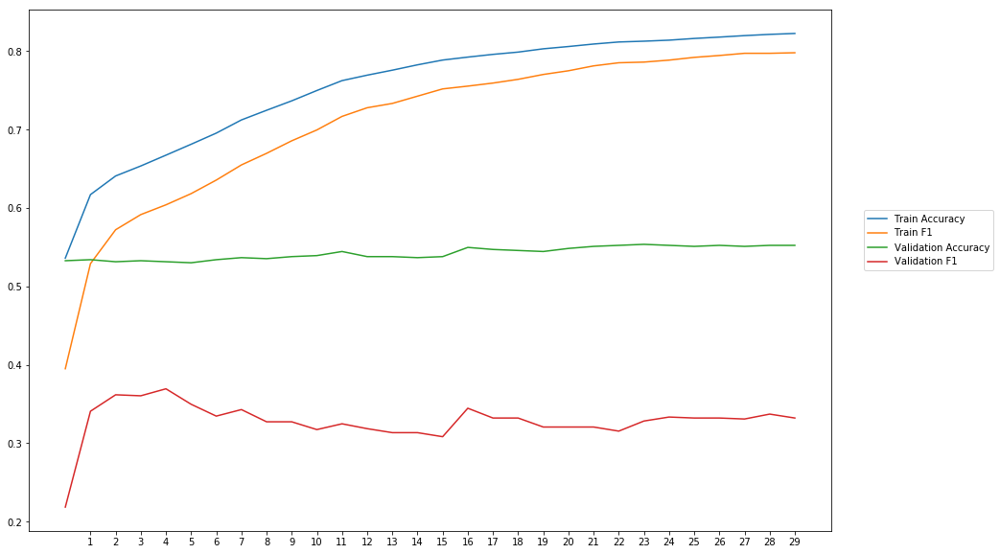

Average Accuracy: 54.24%
Average Precision: 56.88%
Average Recall: 23.14%
Average F1: 32.80%

-----Fold 7--------


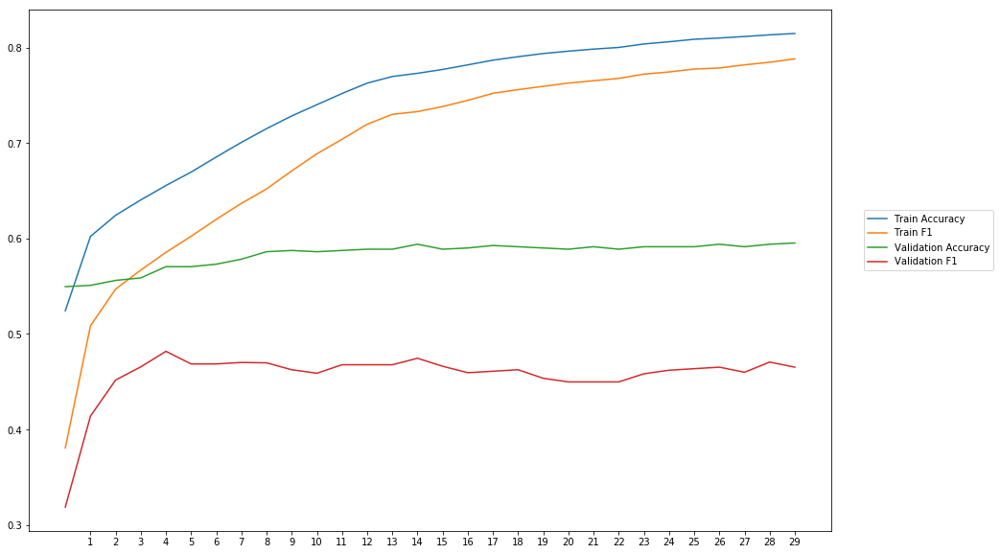

Average Accuracy: 58.32%
Average Precision: 66.03%
Average Recall: 35.04%
Average F1: 45.69%

-----Fold 8--------


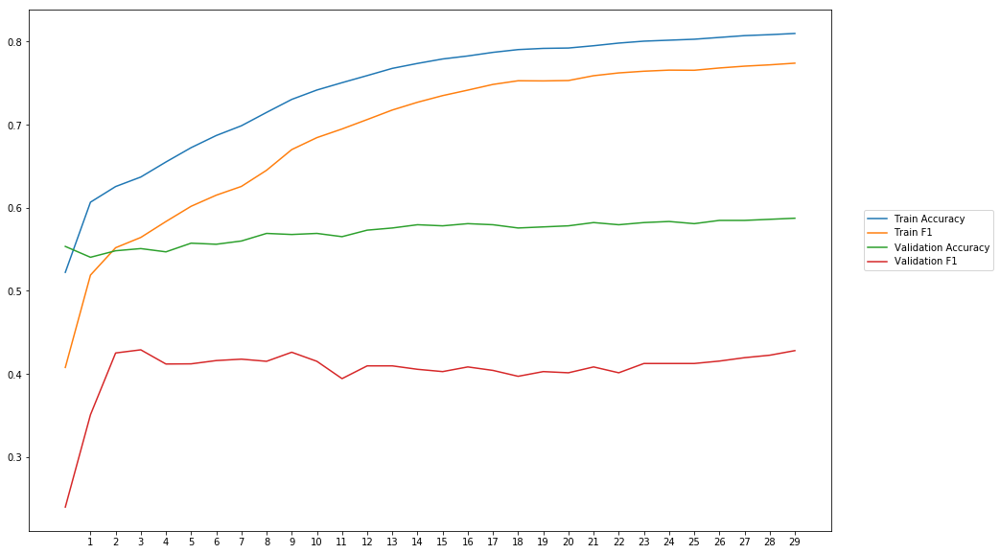

Average Accuracy: 57.12%
Average Precision: 60.81%
Average Recall: 30.40%
Average F1: 40.43%

-----Fold 9--------


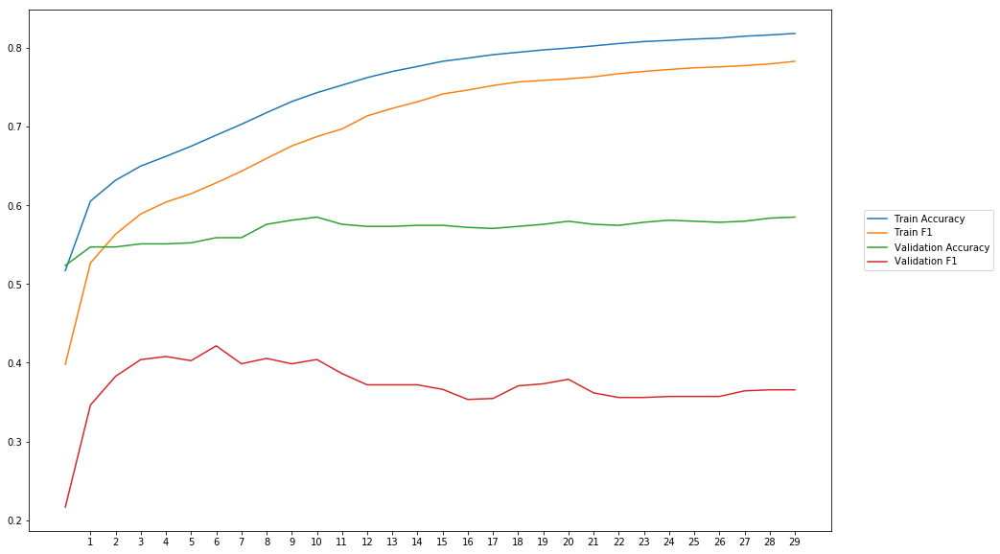

Average Accuracy: 56.96%
Average Precision: 56.08%
Average Recall: 27.85%
Average F1: 37.09%

-----Fold 10--------


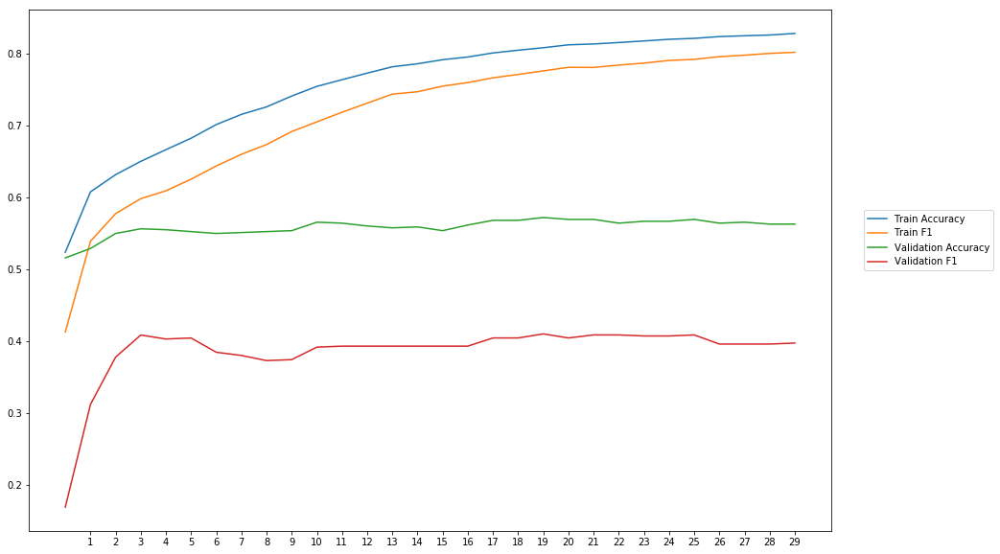

Average Accuracy: 55.84%
Average Precision: 60.89%
Average Recall: 28.41%
Average F1: 38.60%

-------Overallresults-------


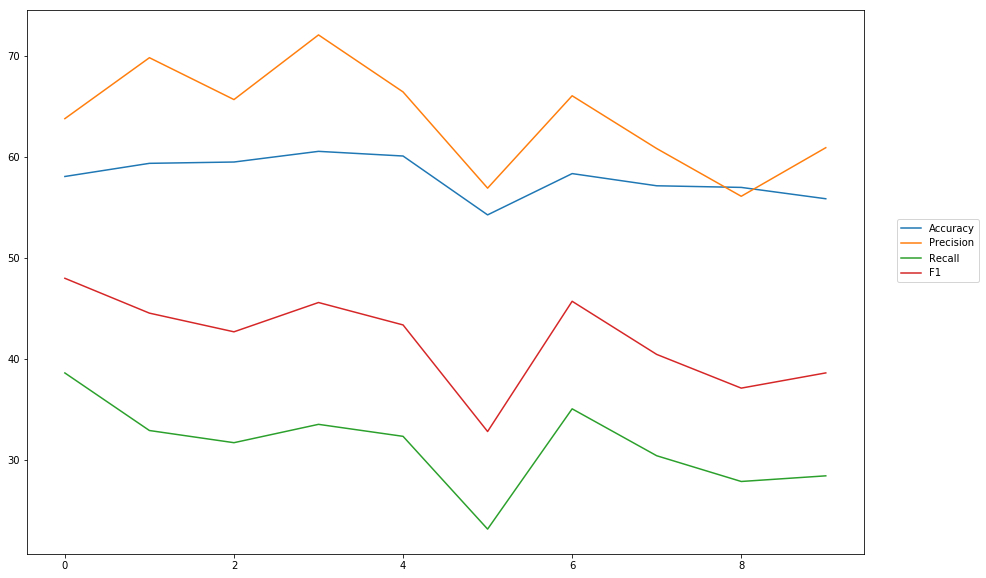

Accuracy: Mean = 57.99% (+/- 1.88%), Max = 60.53%, Min =  54.24%
Precision: Mean = 63.84% (+/- 4.94%), Max = 72.05%, Min =  56.08%
Recall: Mean = 31.39% (+/- 4.04%), Max = 38.59%, Min =  23.14%
F1: Mean = 41.87% (+/- 4.39%), Max = 47.96%, Min =  32.80%


In [20]:
cross_val_two_inputs(model_5, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'combined_outputs_min')

### add

In [21]:
#First model
wv_layer_6 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_6 = wv_layer_6(comment_input_6)
x_first_4 = Dense(600, activation='relu')(embedded_sequences_6)
x_first_4 = Flatten()(x_first_4)
first_preds_4 = Dense(2, activation='softmax')(x_first_4)

#Second model
pos_input_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_4 = Dense(600, activation='relu')(pos_input_6)
second_preds_4 = Dense(2, activation='softmax')(x_second_4)

#Concat outputs
preds_6 = add([first_preds_4, second_preds_4])

model_6 = Model(inputs=[comment_input_6, pos_input_6], outputs=preds_6)
model_6.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_6 (Embedding)         (None, 40, 300)      3492600     input_11[0][0]                   
__________________________________________________________________________________________________
dense_18 (Dense)                (None, 40, 600)      180600      embedding_6[0][0]                
__________________________________________________________________________________________________
input_12 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_6 


-----Fold 1--------


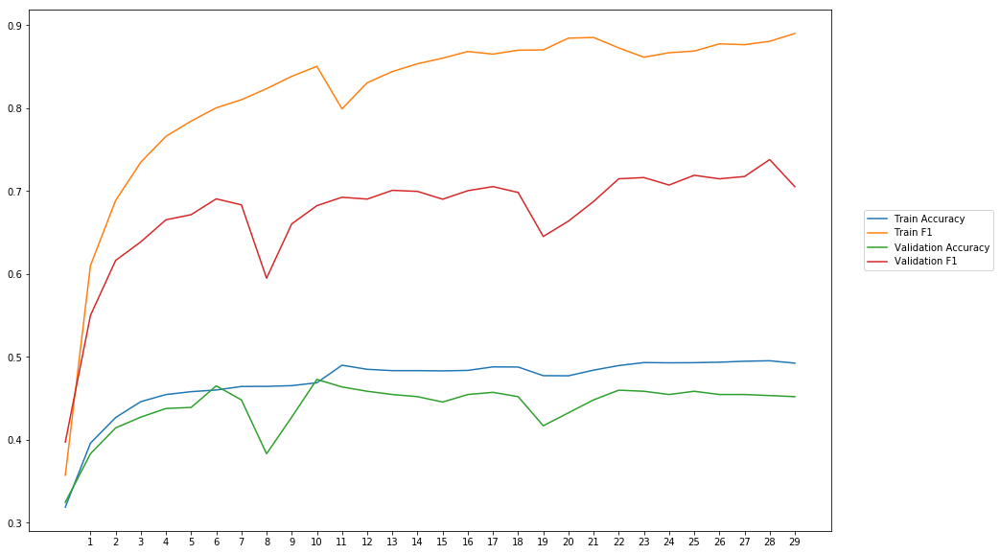

Average Accuracy: 44.01%
Average Precision: 58.19%
Average Recall: 82.81%
Average F1: 67.17%

-----Fold 2--------


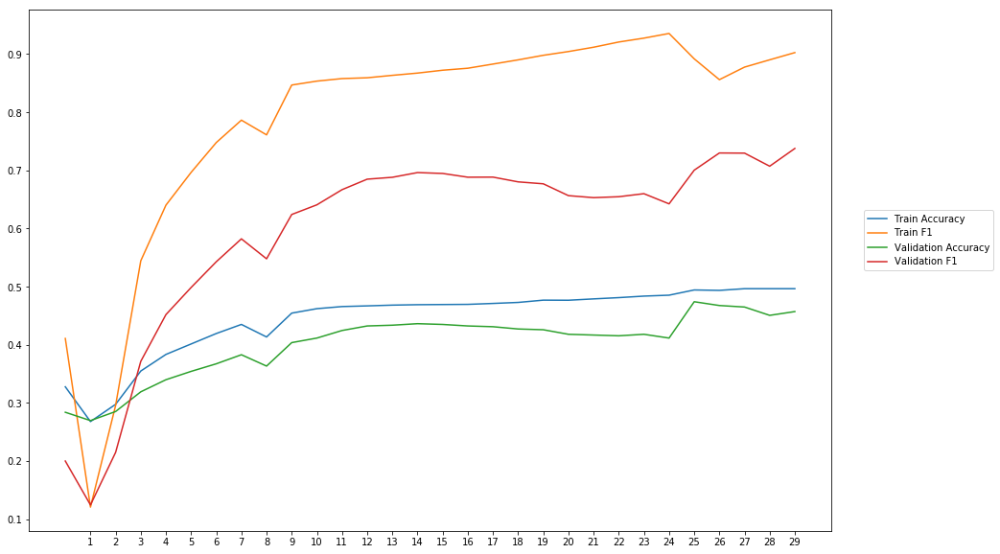

Average Accuracy: 40.17%
Average Precision: 61.03%
Average Recall: 63.53%
Average F1: 59.44%

-----Fold 3--------


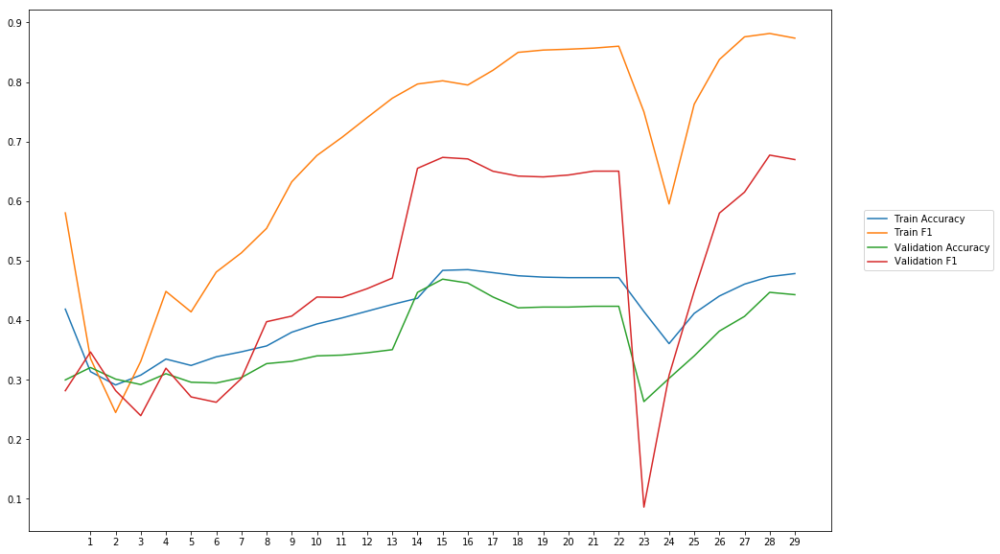

Average Accuracy: 36.53%
Average Precision: 56.27%
Average Recall: 45.83%
Average F1: 47.22%

-----Fold 4--------


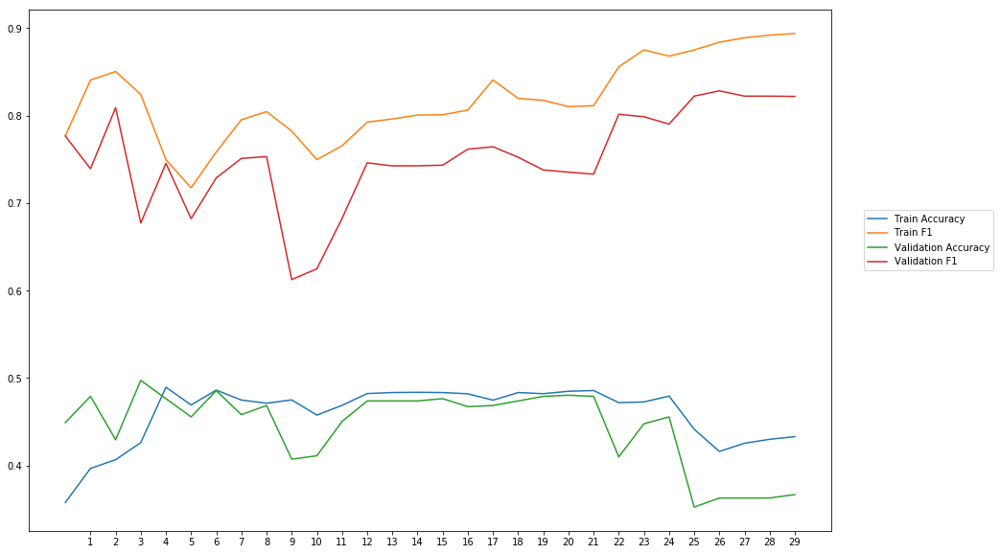

Average Accuracy: 44.46%
Average Precision: 55.22%
Average Recall: 124.61%
Average F1: 75.18%

-----Fold 5--------


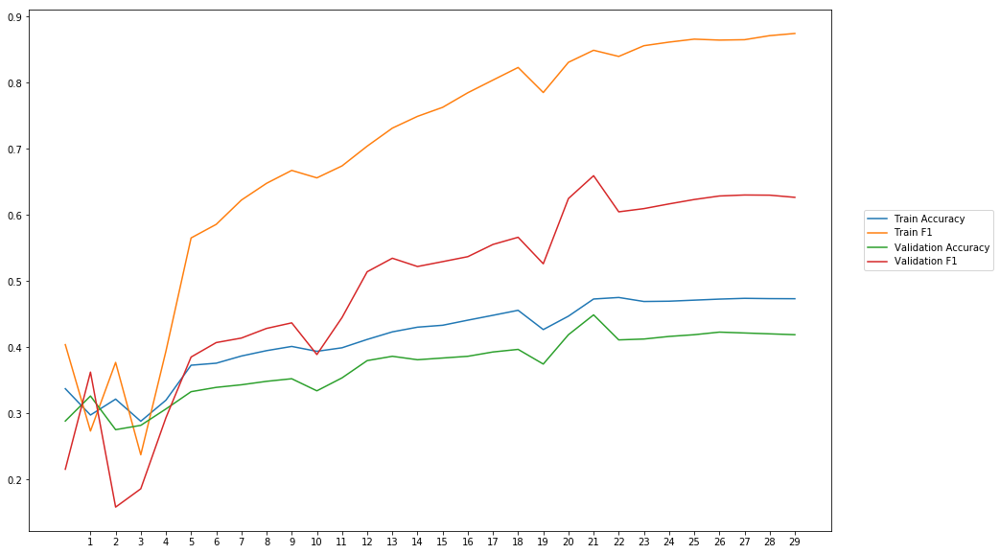

Average Accuracy: 37.26%
Average Precision: 50.82%
Average Recall: 49.21%
Average F1: 48.88%

-----Fold 6--------


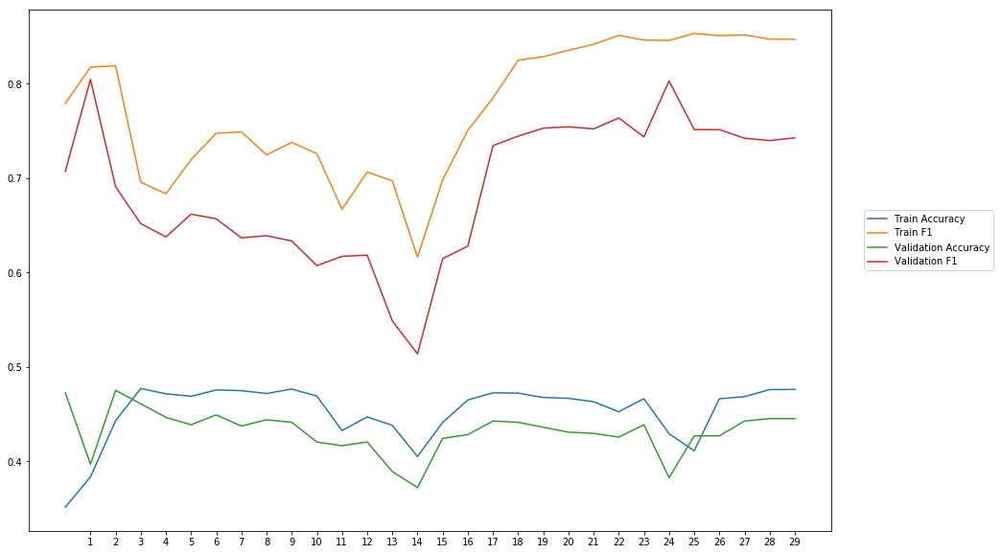

Average Accuracy: 43.15%
Average Precision: 52.61%
Average Recall: 105.45%
Average F1: 68.82%

-----Fold 7--------


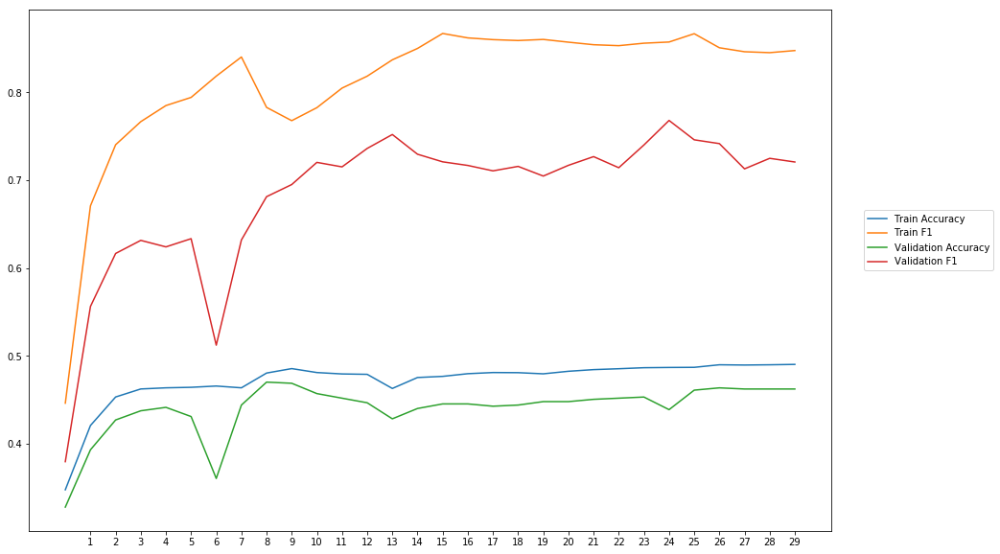

Average Accuracy: 44.00%
Average Precision: 53.88%
Average Recall: 98.39%
Average F1: 68.30%

-----Fold 8--------


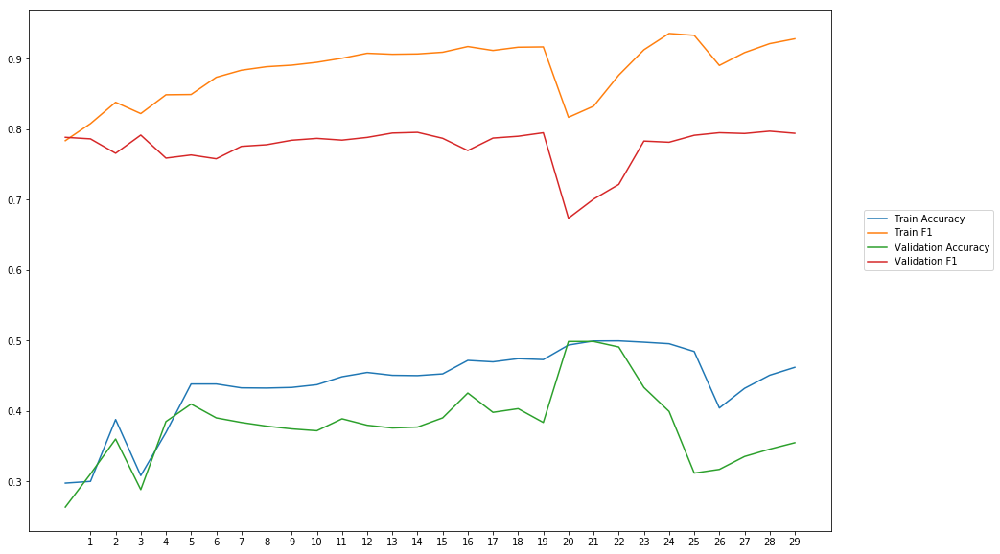

Average Accuracy: 38.09%
Average Precision: 51.67%
Average Recall: 157.77%
Average F1: 77.53%

-----Fold 9--------


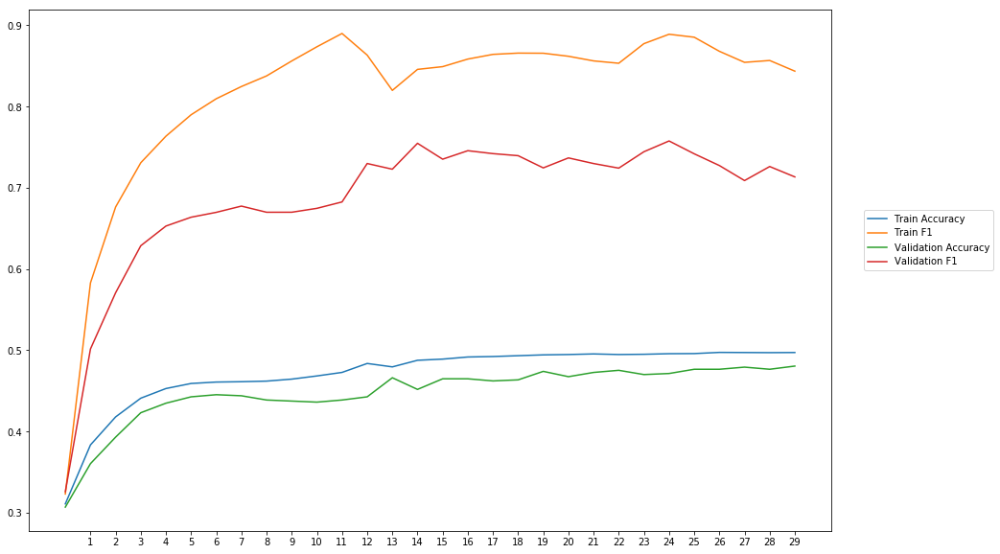

Average Accuracy: 44.78%
Average Precision: 56.13%
Average Recall: 95.60%
Average F1: 68.63%

-----Fold 10--------


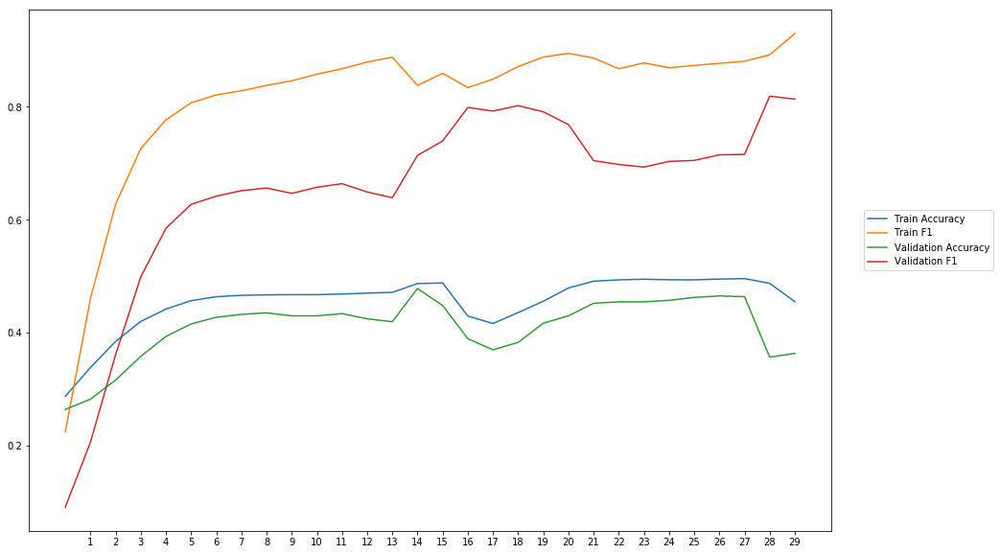

Average Accuracy: 40.99%
Average Precision: 55.37%
Average Recall: 95.24%
Average F1: 65.12%

-------Overallresults-------


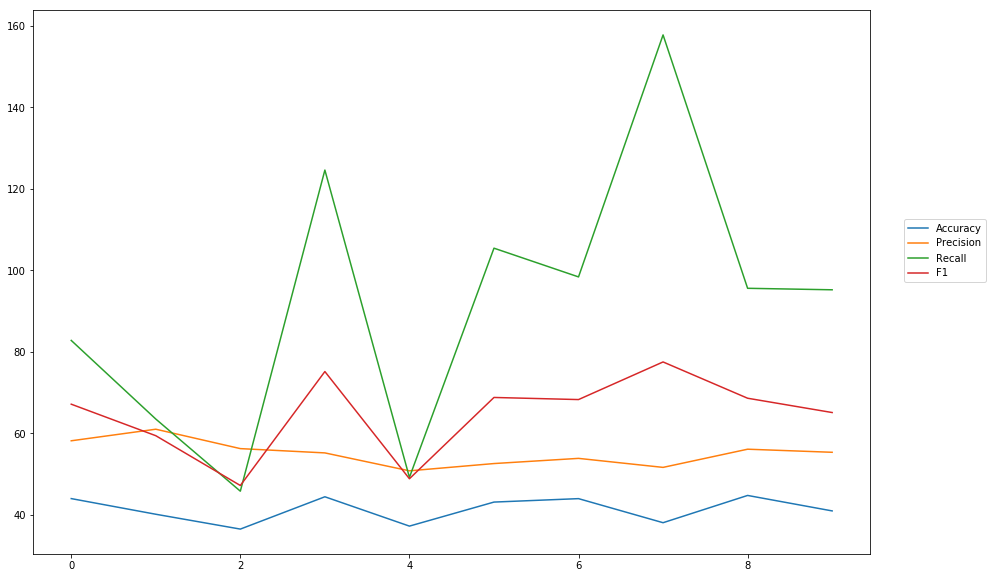

Accuracy: Mean = 41.34% (+/- 3.01%), Max = 44.78%, Min =  36.53%
Precision: Mean = 55.12% (+/- 2.92%), Max = 61.03%, Min =  50.82%
Recall: Mean = 91.84% (+/- 32.39%), Max = 157.77%, Min =  45.83%
F1: Mean = 64.63% (+/- 9.54%), Max = 77.53%, Min =  47.22%


In [22]:
cross_val_two_inputs(model_6, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'combined_outputs_add')

## Combine Outputs + anoter dense layer

In [23]:
#First model
wv_layer_7 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_7 = wv_layer_7(comment_input_7)
x_first_5 = Dense(600, activation='relu')(embedded_sequences_7)
x_first_5 = Flatten()(x_first_5)
first_preds_5 = Dense(2, activation='softmax')(x_first_5)

#Second model
pos_input_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_5 = Dense(600, activation='relu')(pos_input_7)
second_preds_5 = Dense(2, activation='softmax')(x_second_5)

#Concat outputs
preds_7 = concatenate([first_preds_5, second_preds_5])

preds_7 = Dense(2, activation='softmax')(preds_7)

model_7 = Model(inputs=[comment_input_7, pos_input_7], outputs=preds_7)
model_7.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_7 (Embedding)         (None, 40, 300)      3492600     input_13[0][0]                   
__________________________________________________________________________________________________
dense_22 (Dense)                (None, 40, 600)      180600      embedding_7[0][0]                
__________________________________________________________________________________________________
input_14 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_7 


-----Fold 1--------


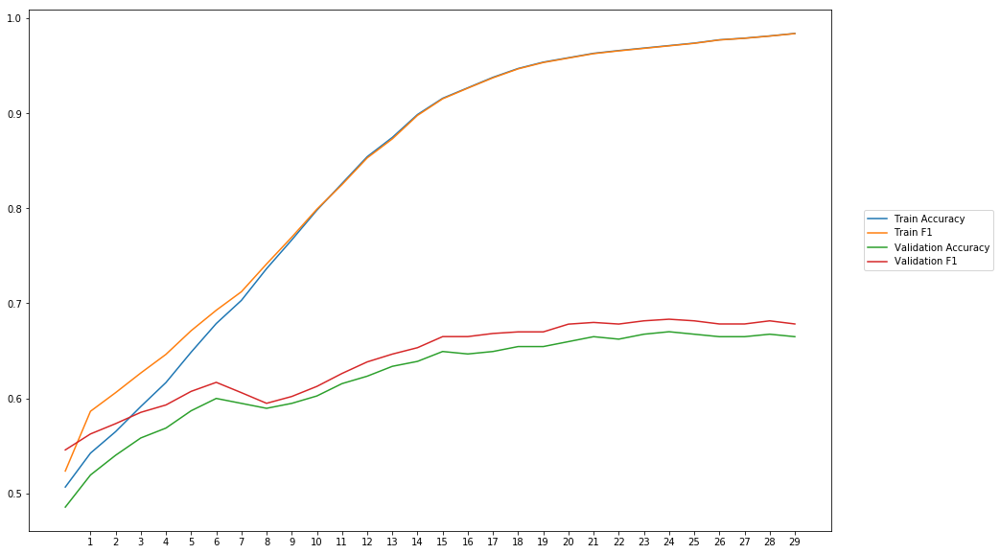

Average Accuracy: 62.21%
Average Precision: 61.09%
Average Recall: 67.27%
Average F1: 64.01%

-----Fold 2--------


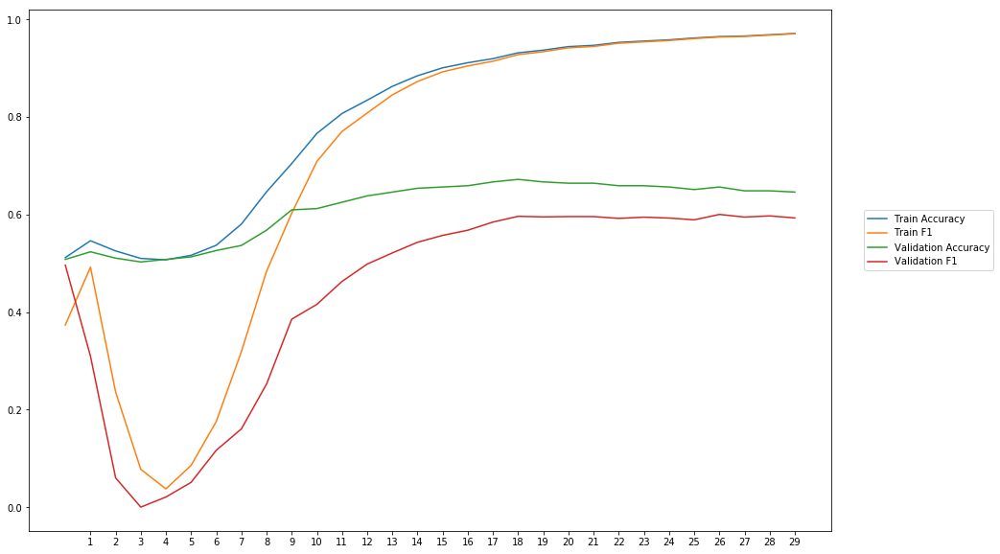

Average Accuracy: 61.17%
Average Precision: 73.28%
Average Recall: 34.97%
Average F1: 43.79%

-----Fold 3--------


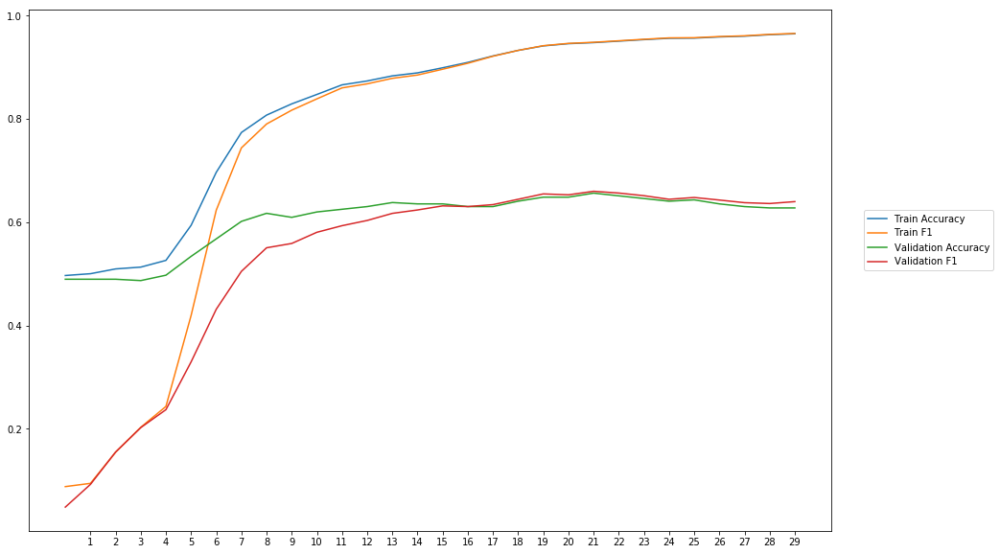

Average Accuracy: 60.41%
Average Precision: 59.93%
Average Recall: 50.28%
Average F1: 52.64%

-----Fold 4--------


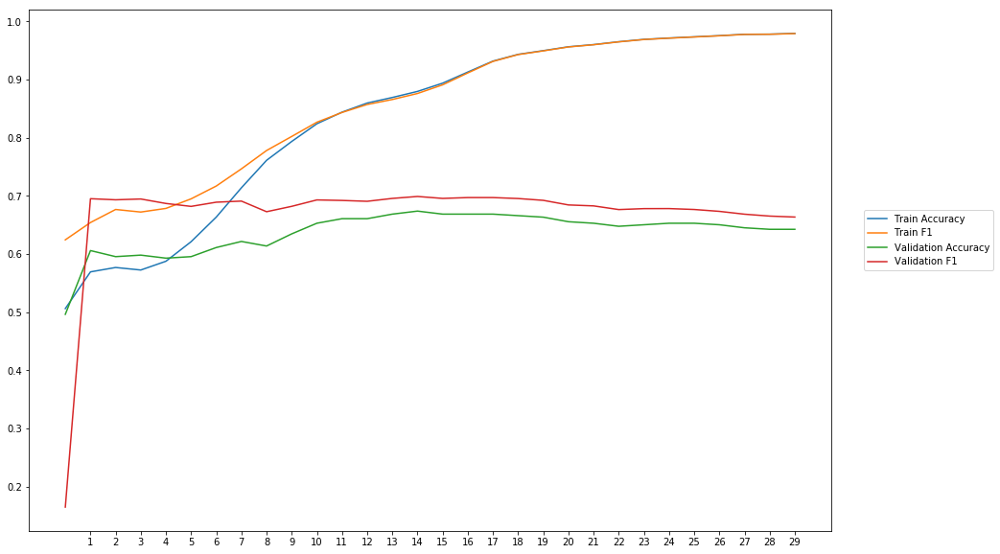

Average Accuracy: 63.68%
Average Precision: 60.87%
Average Recall: 76.07%
Average F1: 66.80%

-----Fold 5--------


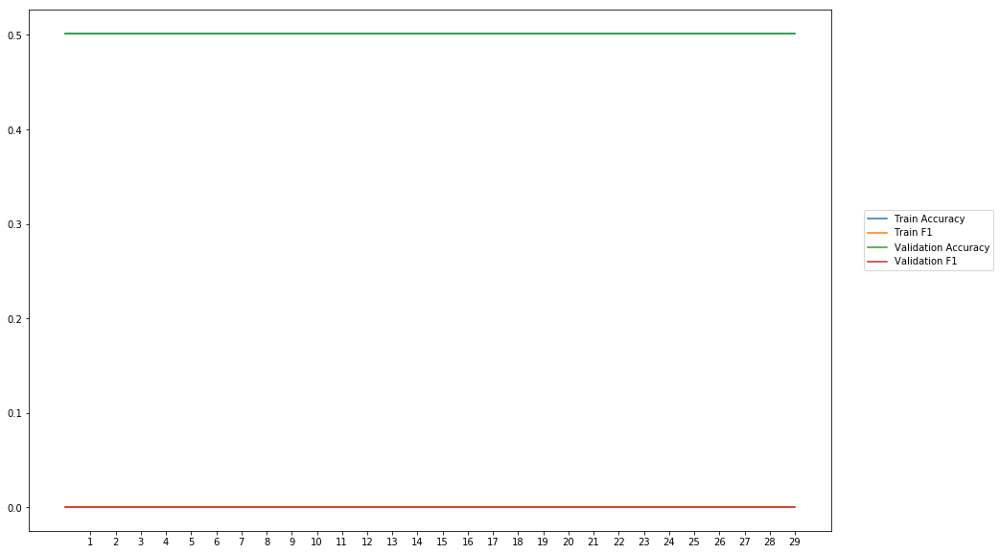

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 6--------


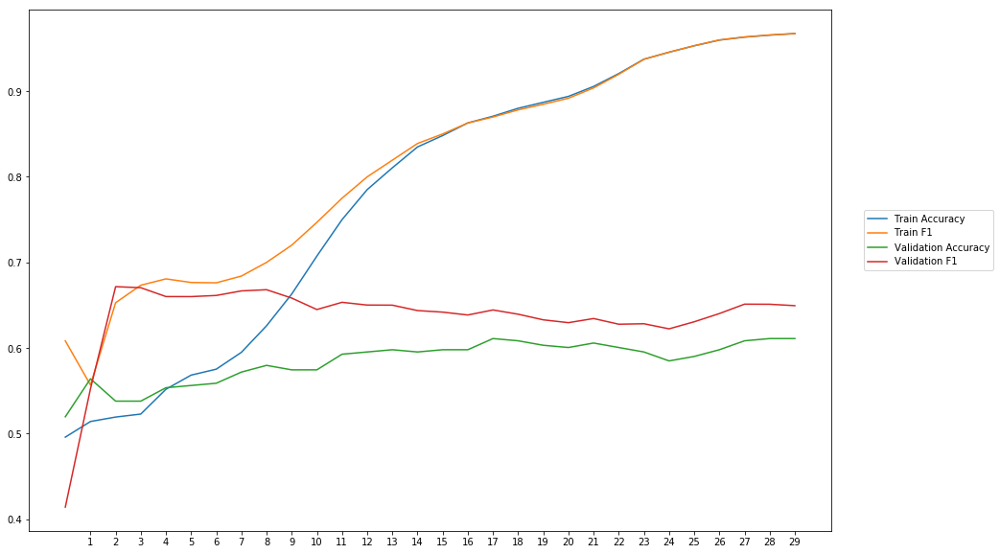

Average Accuracy: 58.44%
Average Precision: 56.58%
Average Recall: 74.05%
Average F1: 63.62%

-----Fold 7--------


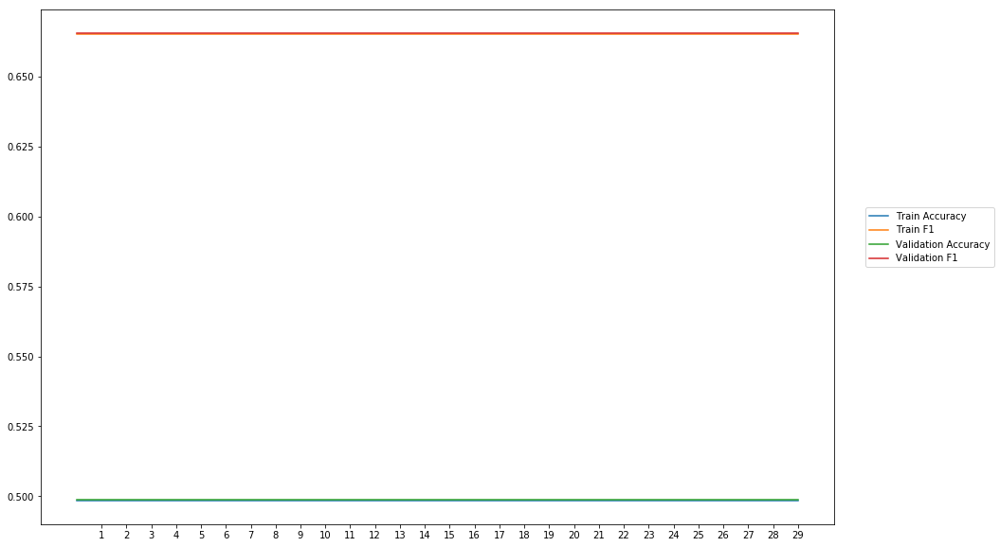

Average Accuracy: 49.87%
Average Precision: 49.87%
Average Recall: 100.00%
Average F1: 66.55%

-----Fold 8--------


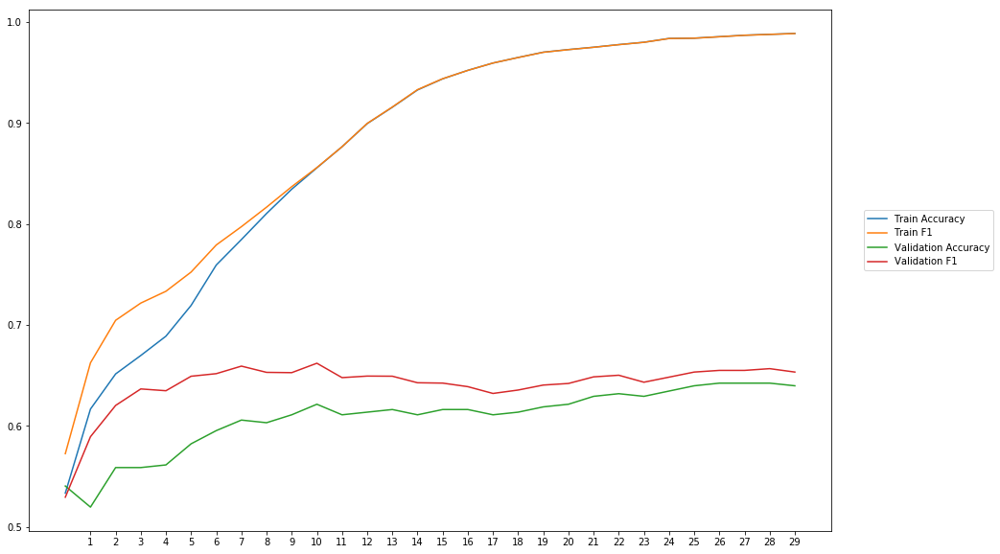

Average Accuracy: 60.79%
Average Precision: 59.20%
Average Recall: 70.16%
Average F1: 64.07%

-----Fold 9--------


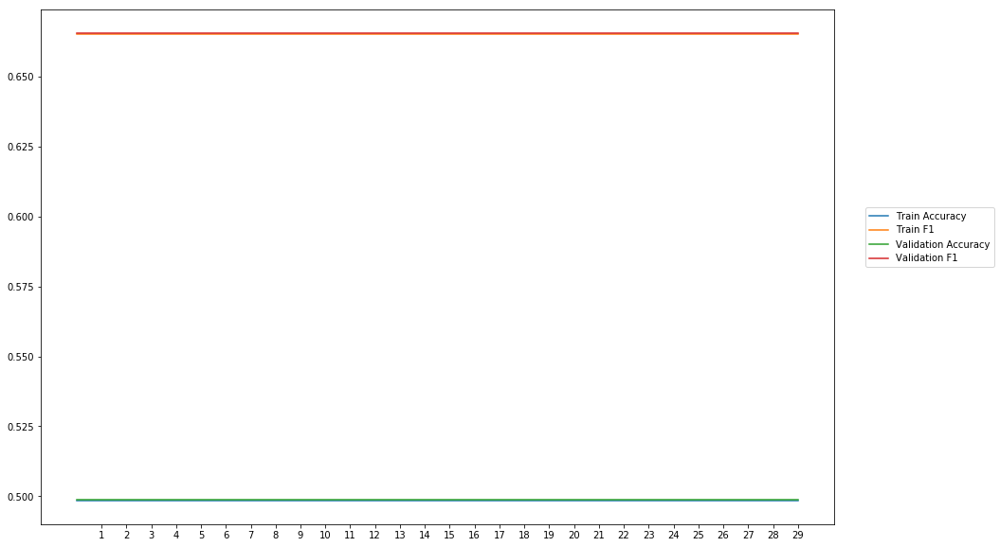

Average Accuracy: 49.87%
Average Precision: 49.87%
Average Recall: 100.00%
Average F1: 66.55%

-----Fold 10--------


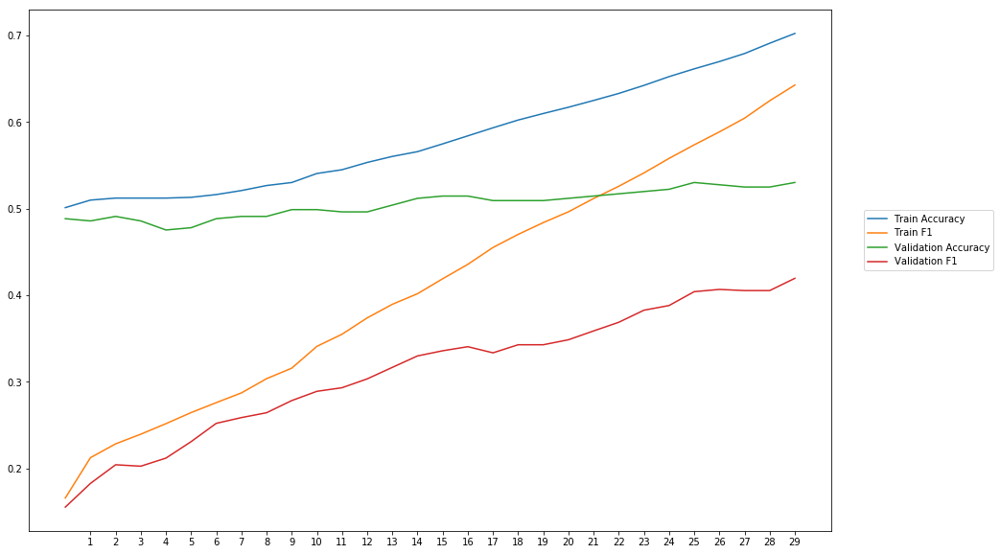

Average Accuracy: 50.52%
Average Precision: 50.04%
Average Recall: 23.04%
Average F1: 31.17%

-------Overallresults-------


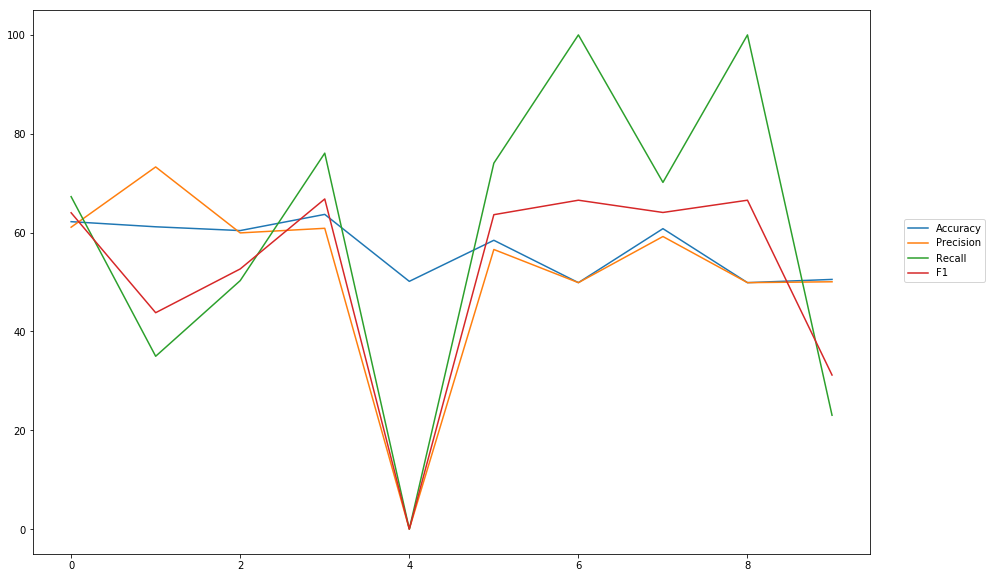

Accuracy: Mean = 56.71% (+/- 5.54%), Max = 63.68%, Min =  49.87%
Precision: Mean = 52.07% (+/- 18.62%), Max = 73.28%, Min =  0.00%
Recall: Mean = 59.58% (+/- 30.82%), Max = 100.00%, Min =  0.00%
F1: Mean = 51.92% (+/- 20.67%), Max = 66.80%, Min =  0.00%


In [24]:
cross_val_two_inputs(model_7, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'combined_outputs_dense')

# Sentiment - BLOB

## Combine Inputs

In [25]:
#Input Words
wv_layer_8 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_8 = wv_layer_8(comment_input_8)
embedded_sequences_8 = Flatten()(embedded_sequences_8)

#Input POS
senti_input_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')

#Concat Inputs
concat_8 = concatenate([embedded_sequences_8, senti_input_8], axis=1)

x_8 = Dense(600, activation='relu')(concat_8)
preds_8 = Dense(2, activation='softmax')(x_8)

# build the model
model_8 = Model(inputs=[comment_input_8, senti_input_8], outputs=preds_8)
model_8.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_8 (Embedding)         (None, 40, 300)      3492600     input_15[0][0]                   
__________________________________________________________________________________________________
flatten_8 (Flatten)             (None, 12000)        0           embedding_8[0][0]                
__________________________________________________________________________________________________
input_16 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
concatenat


-----Fold 1--------


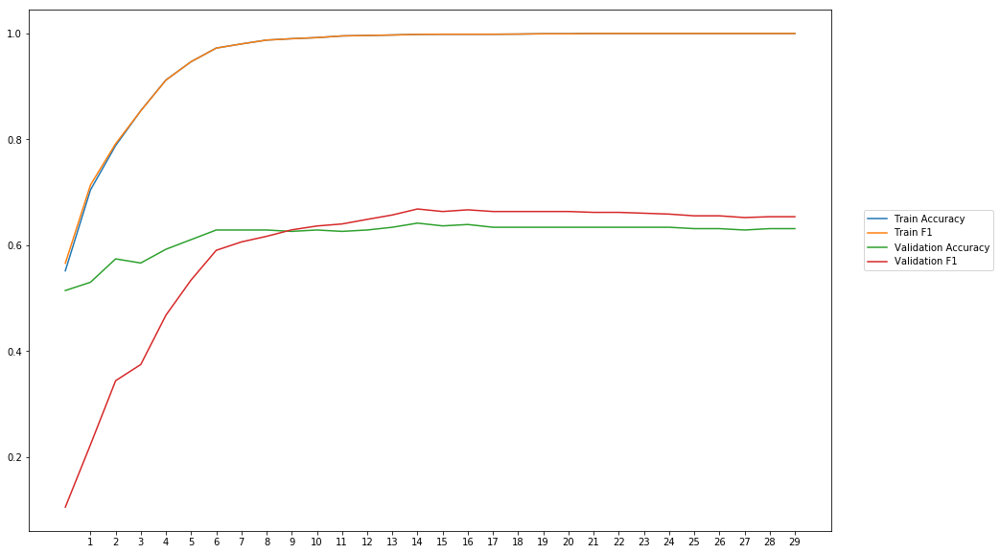

Average Accuracy: 61.85%
Average Precision: 62.91%
Average Recall: 59.86%
Average F1: 58.79%

-----Fold 2--------


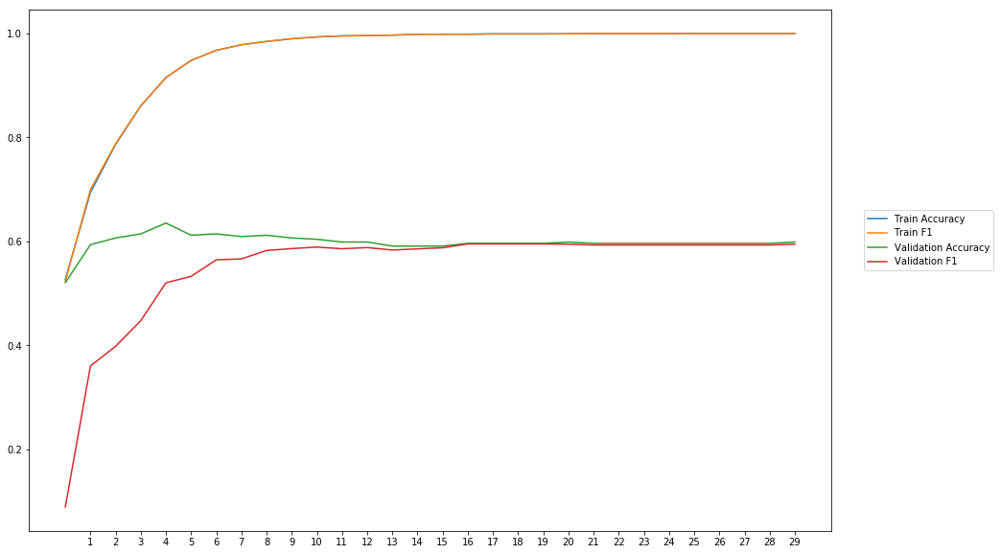

Average Accuracy: 59.85%
Average Precision: 63.69%
Average Recall: 51.94%
Average F1: 54.95%

-----Fold 3--------


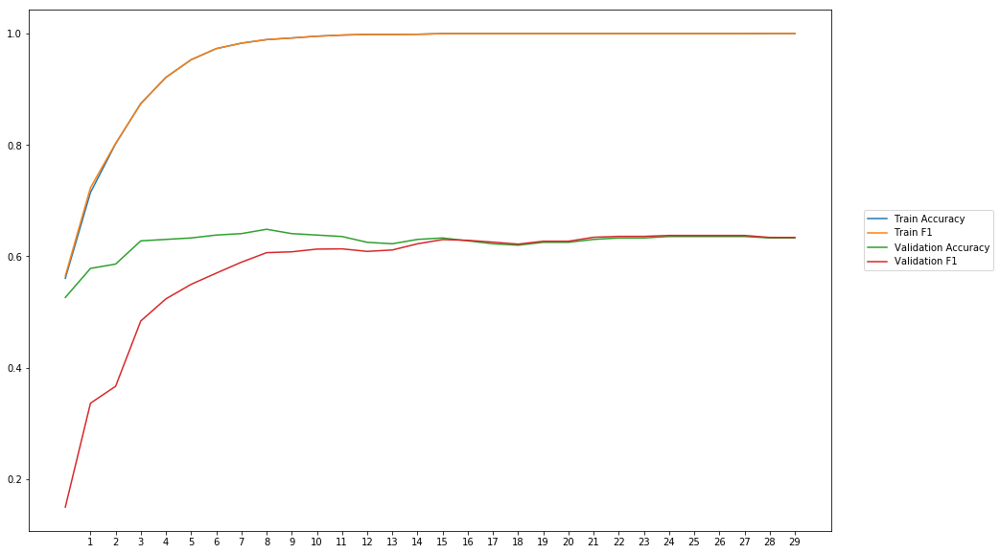

Average Accuracy: 62.52%
Average Precision: 65.87%
Average Recall: 54.61%
Average F1: 57.77%

-----Fold 4--------


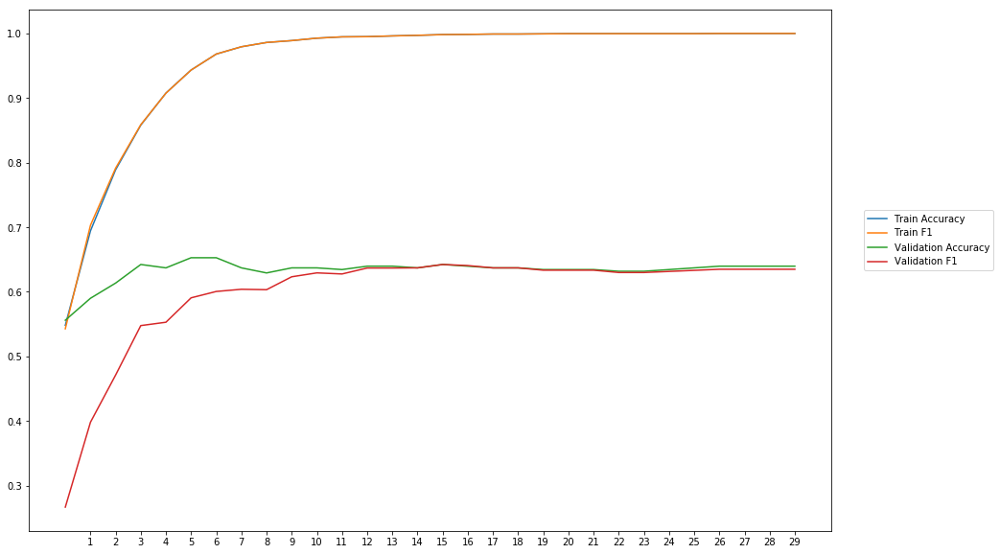

Average Accuracy: 63.30%
Average Precision: 66.07%
Average Recall: 56.82%
Average F1: 59.83%

-----Fold 5--------


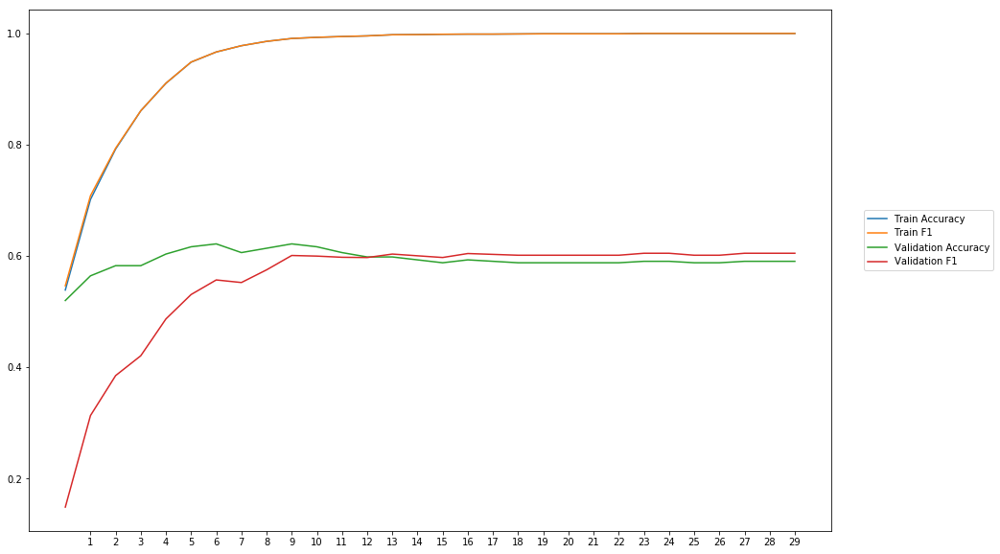

Average Accuracy: 59.24%
Average Precision: 61.54%
Average Recall: 53.54%
Average F1: 55.32%

-----Fold 6--------


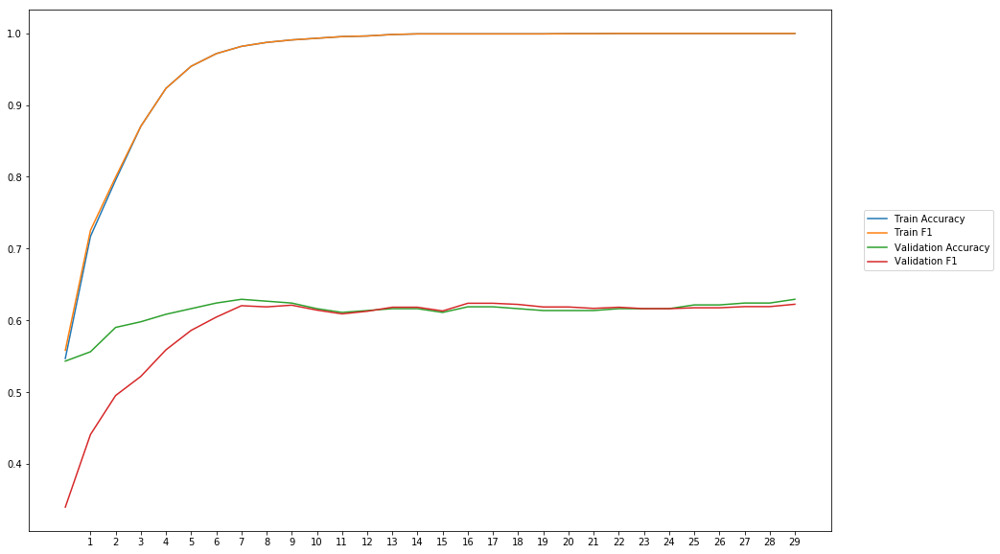

Average Accuracy: 61.21%
Average Precision: 61.98%
Average Recall: 57.59%
Average F1: 59.20%

-----Fold 7--------


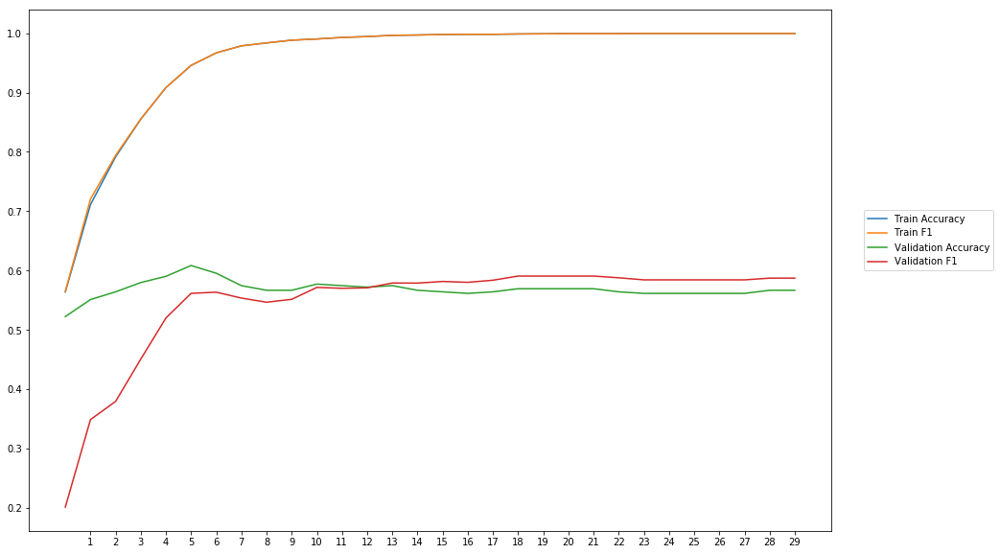

Average Accuracy: 56.84%
Average Precision: 57.81%
Average Recall: 53.94%
Average F1: 54.45%

-----Fold 8--------


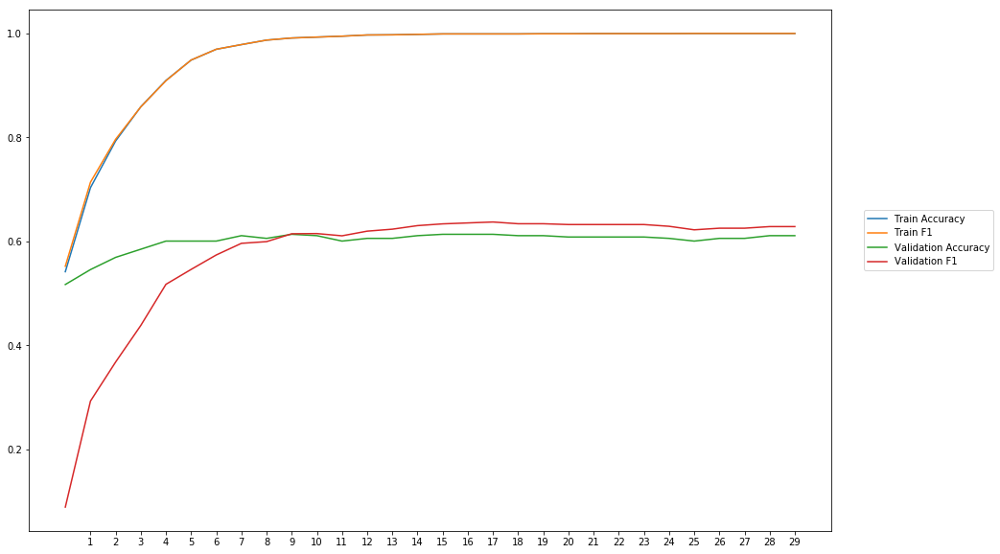

Average Accuracy: 60.06%
Average Precision: 61.43%
Average Recall: 57.70%
Average F1: 57.32%

-----Fold 9--------


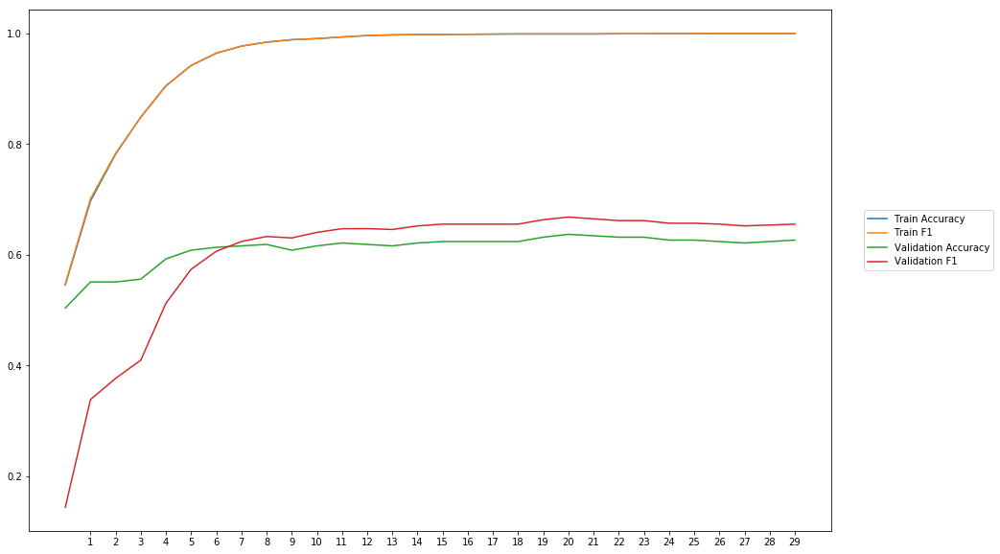

Average Accuracy: 61.09%
Average Precision: 60.58%
Average Recall: 62.36%
Average F1: 59.86%

-----Fold 10--------


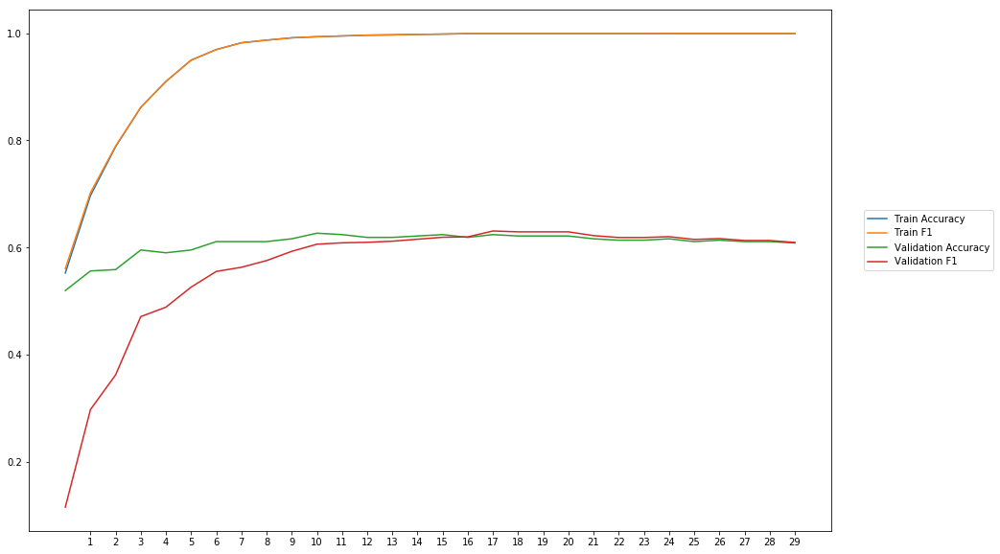

Average Accuracy: 60.73%
Average Precision: 62.97%
Average Recall: 53.93%
Average F1: 56.34%

-------Overallresults-------


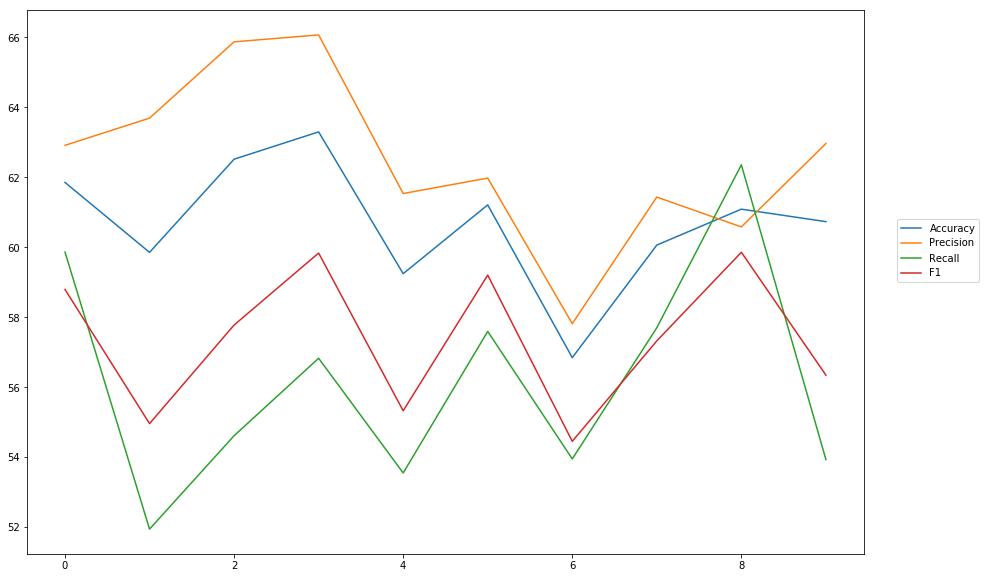

Accuracy: Mean = 60.67% (+/- 1.73%), Max = 63.30%, Min =  56.84%
Precision: Mean = 62.49% (+/- 2.32%), Max = 66.07%, Min =  57.81%
Recall: Mean = 56.23% (+/- 3.06%), Max = 62.36%, Min =  51.94%
F1: Mean = 57.38% (+/- 1.93%), Max = 59.86%, Min =  54.45%


In [26]:
cross_val_two_inputs(model_8, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_labels, softmax, outputpath, 'combined_input_senti_blob')

## Seperate Models combine results

In [27]:
#First part
wv_layer_9 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_9 = wv_layer_9(comment_input_9)
x_first_9 = Dense(600, activation='relu')(embedded_sequences_9)
x_first_9 = Flatten()(x_first_9)

#Second part
senti_input_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_9 = Dense(600, activation='relu')(senti_input_9)

#Concatination
concat_9 = concatenate([x_first_9, x_second_9])

#x_9 = Flatten()(concat)

preds_9 = Dense(2, activation='softmax')(concat_9)

model_9 = Model(inputs=[comment_input_9, senti_input_9], outputs=preds_9)
model_9.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_9 (Embedding)         (None, 40, 300)      3492600     input_17[0][0]                   
__________________________________________________________________________________________________
dense_29 (Dense)                (None, 40, 600)      180600      embedding_9[0][0]                
__________________________________________________________________________________________________
input_18 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_9 


-----Fold 1--------


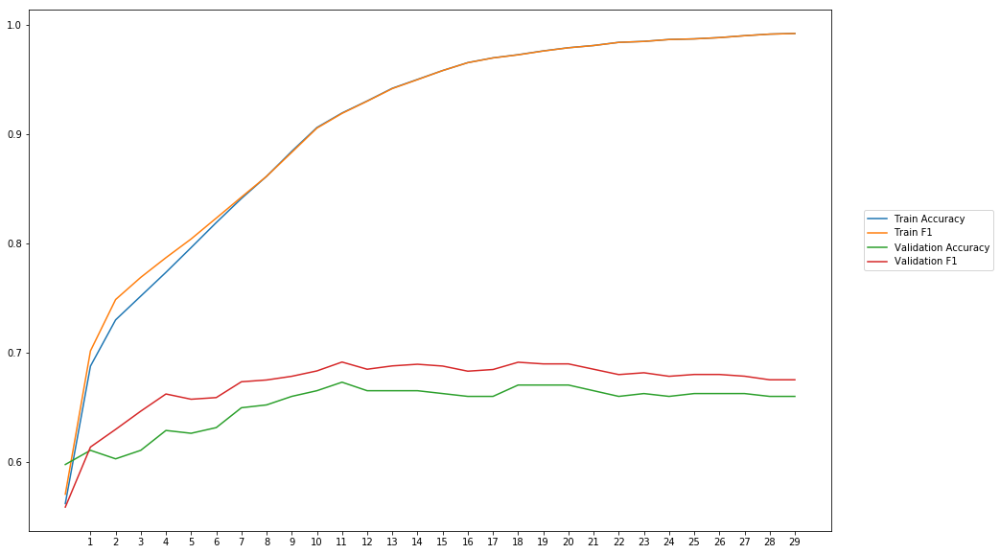

Average Accuracy: 65.15%
Average Precision: 63.38%
Average Recall: 71.37%
Average F1: 67.08%

-----Fold 2--------


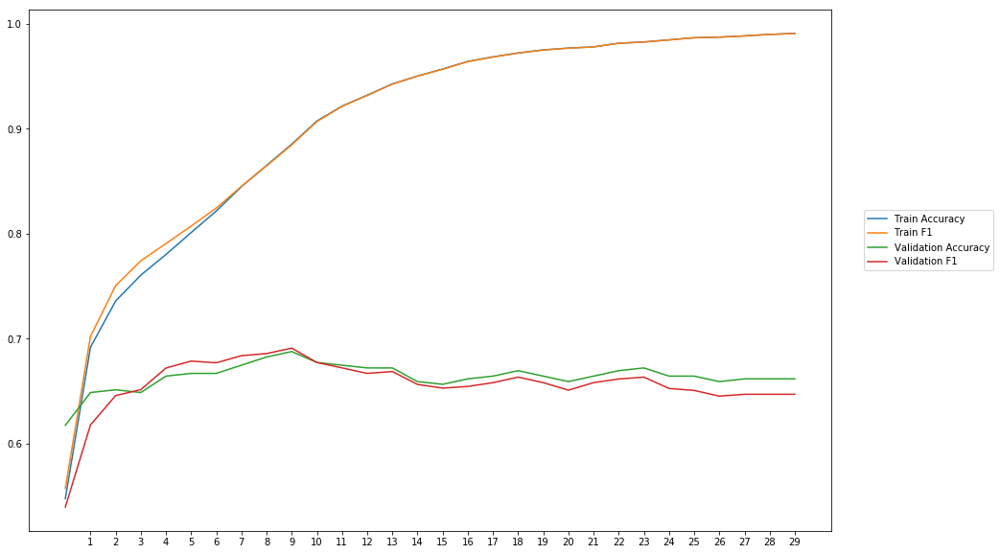

Average Accuracy: 66.37%
Average Precision: 66.69%
Average Recall: 64.80%
Average F1: 65.62%

-----Fold 3--------


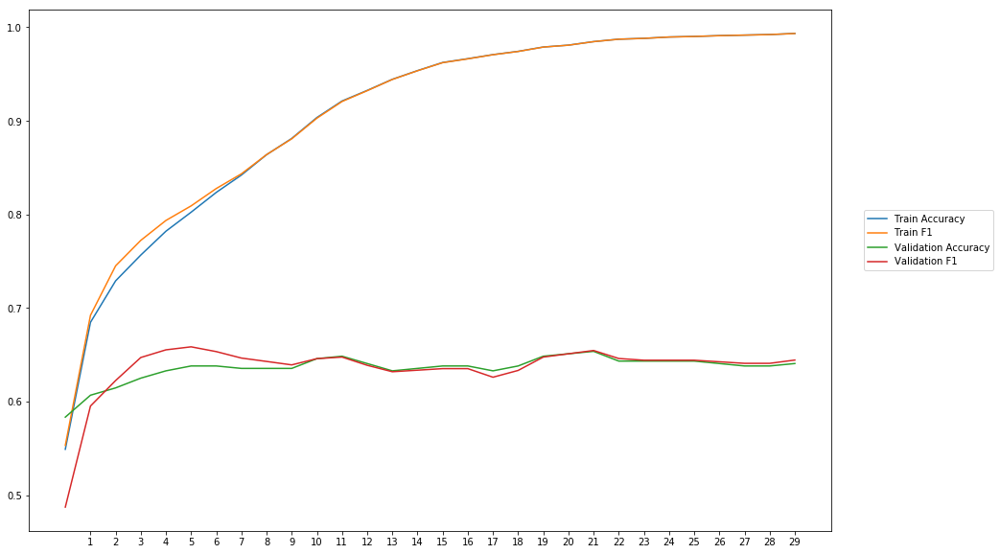

Average Accuracy: 63.59%
Average Precision: 63.21%
Average Recall: 64.21%
Average F1: 63.58%

-----Fold 4--------


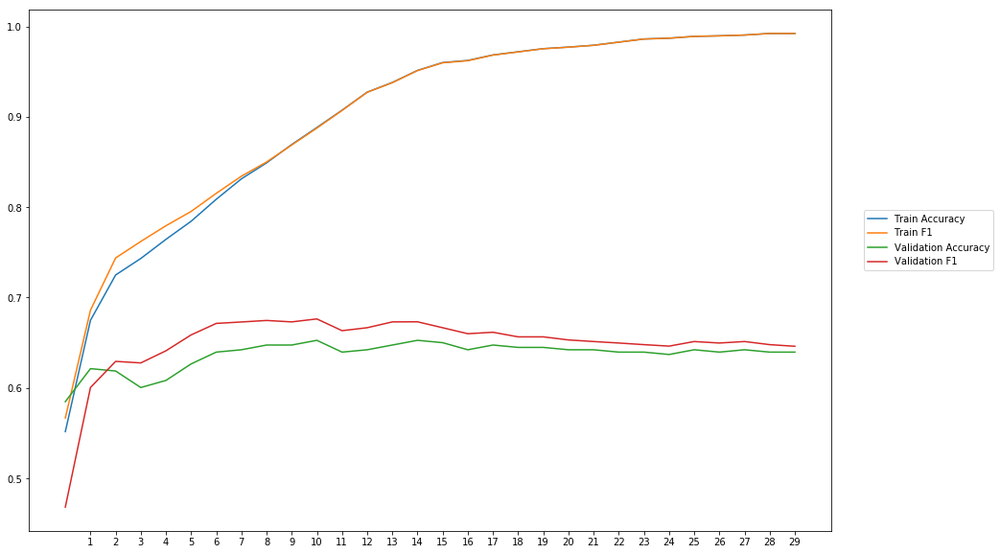

Average Accuracy: 63.69%
Average Precision: 62.60%
Average Recall: 67.85%
Average F1: 64.89%

-----Fold 5--------


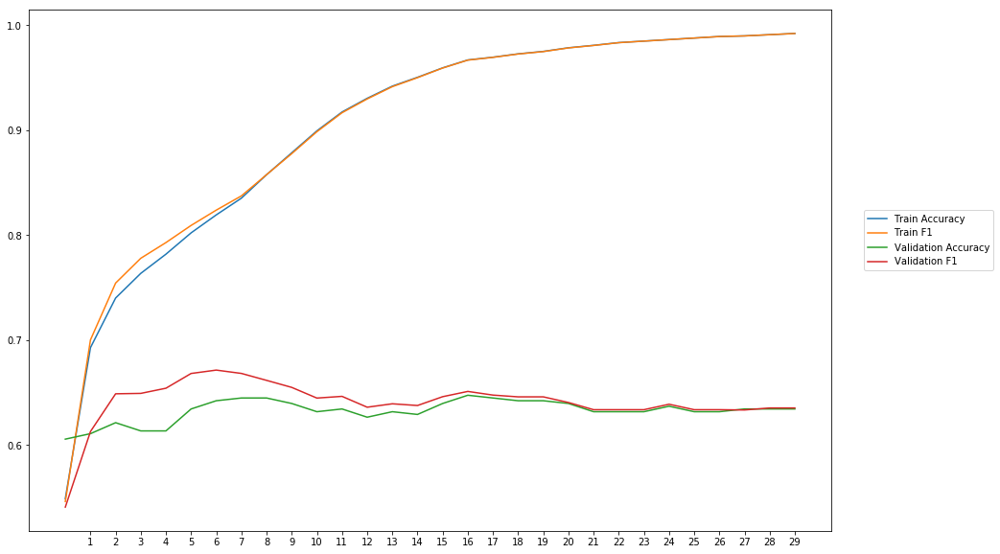

Average Accuracy: 63.27%
Average Precision: 62.57%
Average Recall: 65.95%
Average F1: 64.08%

-----Fold 6--------


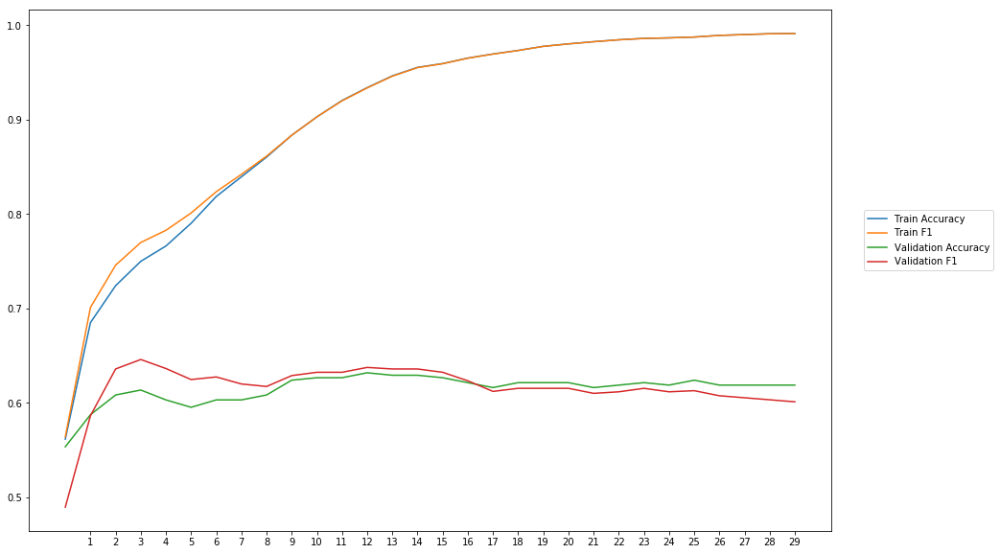

Average Accuracy: 61.49%
Average Precision: 61.26%
Average Recall: 62.18%
Average F1: 61.60%

-----Fold 7--------


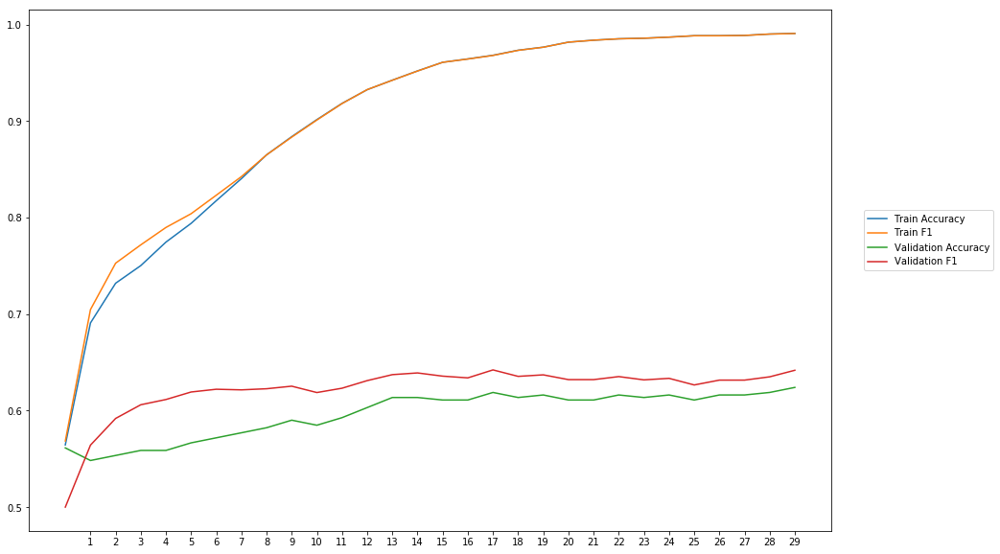

Average Accuracy: 59.67%
Average Precision: 58.47%
Average Recall: 66.61%
Average F1: 62.16%

-----Fold 8--------


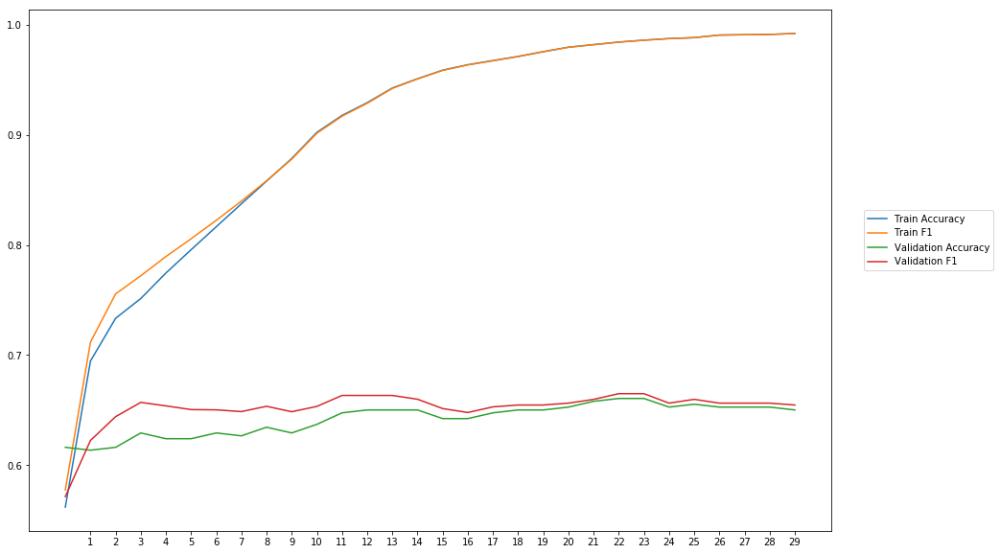

Average Accuracy: 64.19%
Average Precision: 63.34%
Average Recall: 67.26%
Average F1: 65.17%

-----Fold 9--------


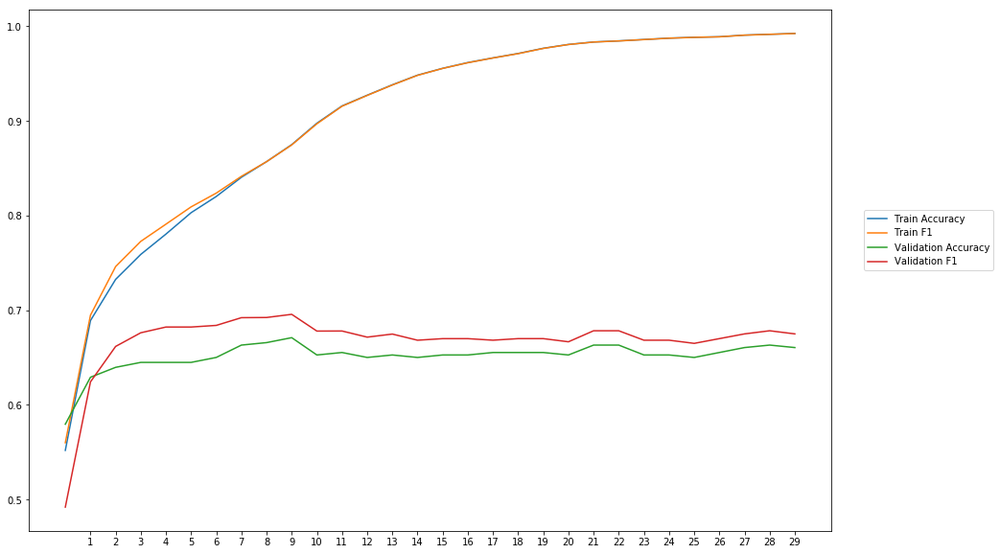

Average Accuracy: 65.13%
Average Precision: 63.53%
Average Recall: 70.66%
Average F1: 66.75%

-----Fold 10--------


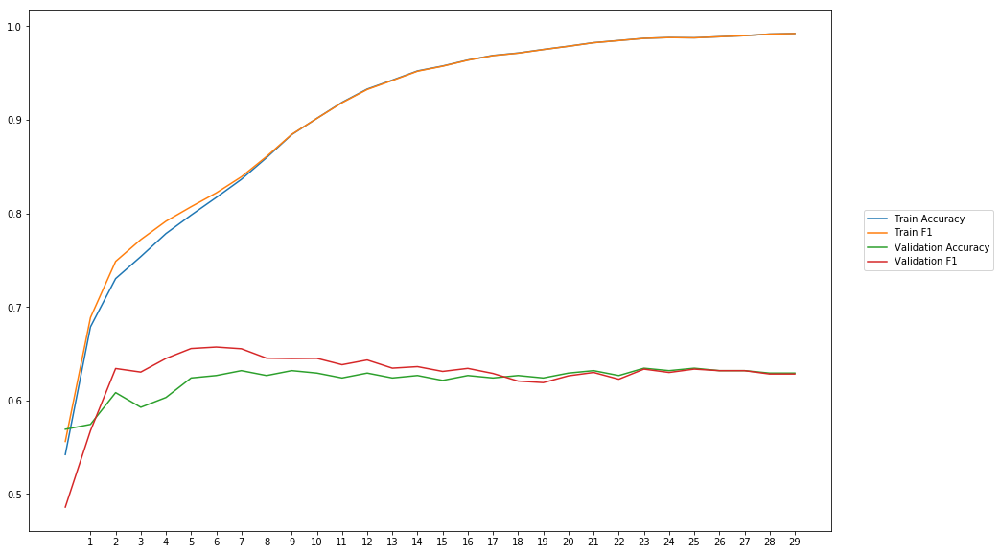

Average Accuracy: 62.18%
Average Precision: 61.61%
Average Recall: 64.42%
Average F1: 62.83%

-------Overallresults-------


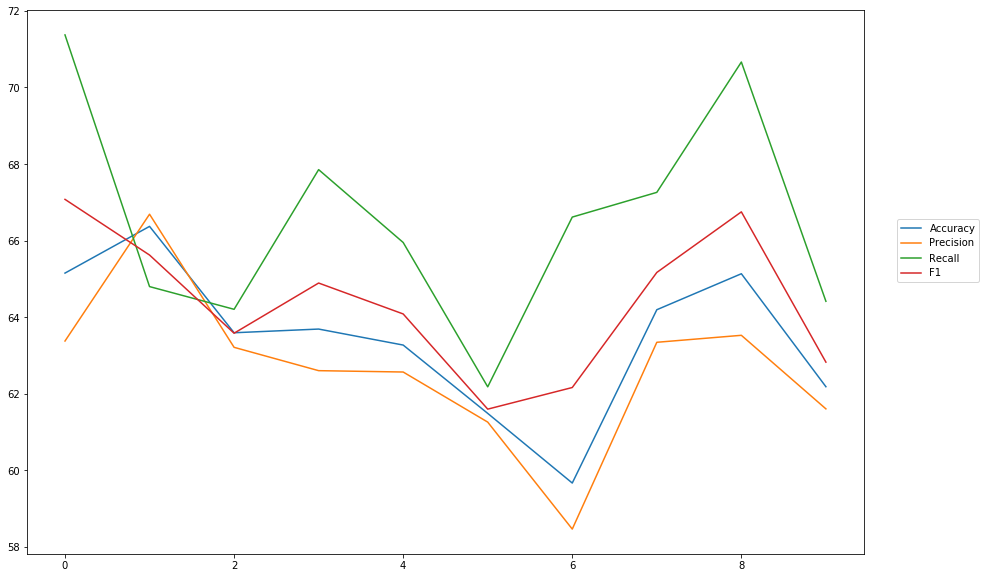

Accuracy: Mean = 63.48% (+/- 1.86%), Max = 66.37%, Min =  59.67%
Precision: Mean = 62.67% (+/- 1.97%), Max = 66.69%, Min =  58.47%
Recall: Mean = 66.53% (+/- 2.74%), Max = 71.37%, Min =  62.18%
F1: Mean = 64.38% (+/- 1.76%), Max = 67.08%, Min =  61.60%


In [28]:
cross_val_two_inputs(model_9, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_labels, softmax, outputpath, 'separat_models_senti_blob')

## Separate models combine output

### average

In [29]:
#First model
wv_layer_10 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_10 = wv_layer_10(comment_input_10)
x_first_10 = Dense(600, activation='relu')(embedded_sequences_10)
x_first_10 = Flatten()(x_first_10)
first_preds_10 = Dense(2, activation='softmax')(x_first_10)

#Second model
senti_input_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_10 = Dense(600, activation='relu')(senti_input_10)
second_preds_10 = Dense(2, activation='softmax')(x_second_10)

#Concat outputs
preds_10 = average([first_preds_10, second_preds_10])

model_10 = Model(inputs=[comment_input_10, senti_input_10], outputs=preds_10)
model_10.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_10 (Embedding)        (None, 40, 300)      3492600     input_19[0][0]                   
__________________________________________________________________________________________________
dense_32 (Dense)                (None, 40, 600)      180600      embedding_10[0][0]               
__________________________________________________________________________________________________
input_20 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_10


-----Fold 1--------


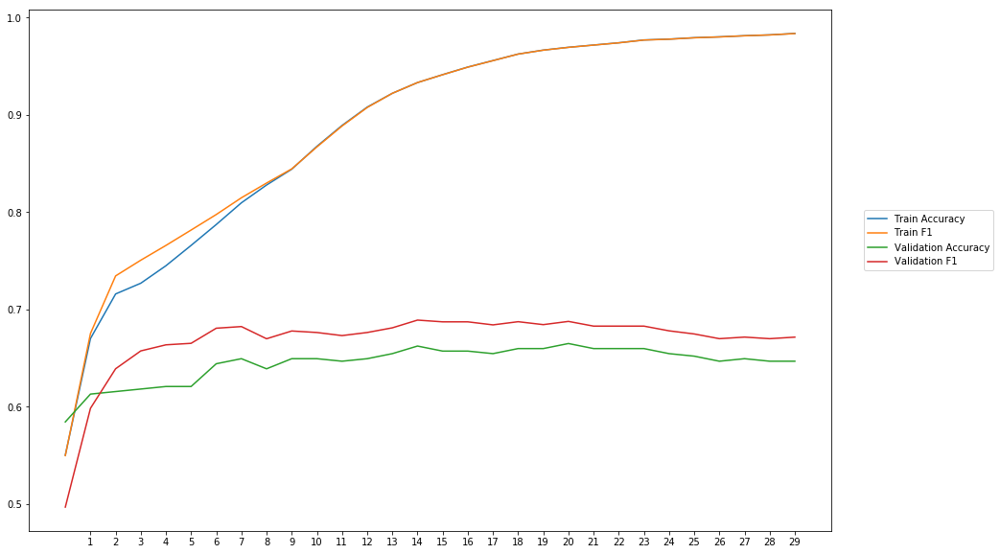

Average Accuracy: 64.48%
Average Precision: 62.51%
Average Recall: 72.05%
Average F1: 66.76%

-----Fold 2--------


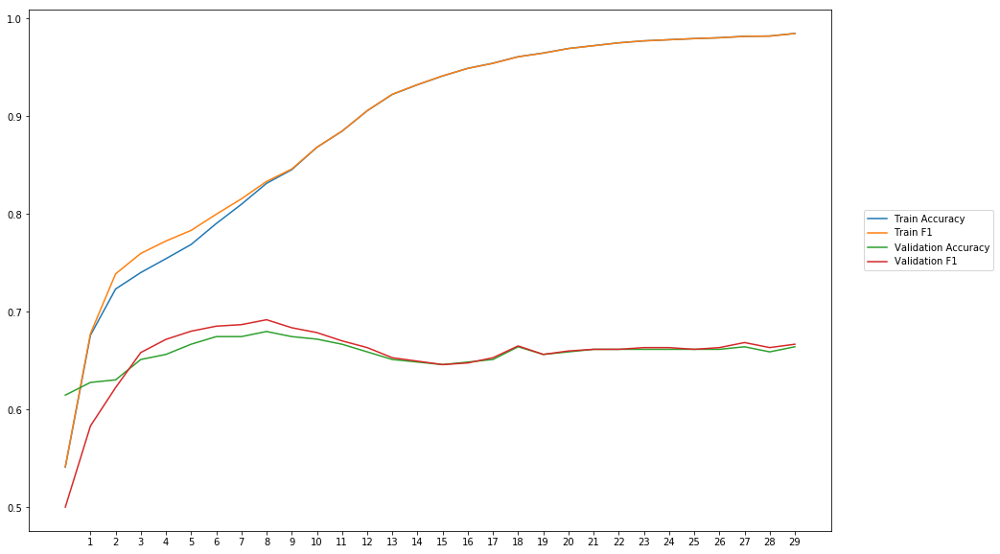

Average Accuracy: 65.76%
Average Precision: 65.49%
Average Recall: 66.11%
Average F1: 65.59%

-----Fold 3--------


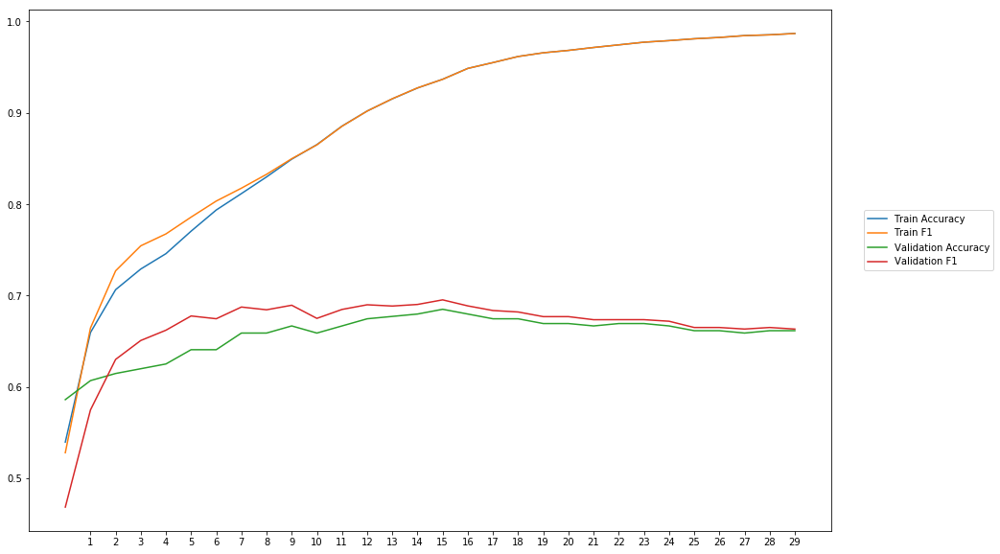

Average Accuracy: 65.68%
Average Precision: 64.55%
Average Recall: 69.06%
Average F1: 66.48%

-----Fold 4--------


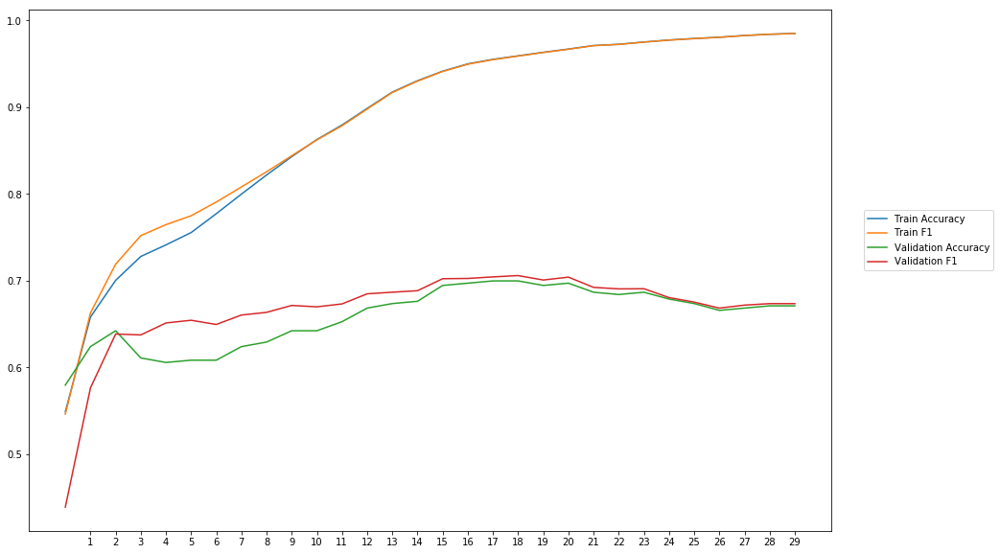

Average Accuracy: 65.86%
Average Precision: 65.07%
Average Recall: 68.97%
Average F1: 66.61%

-----Fold 5--------


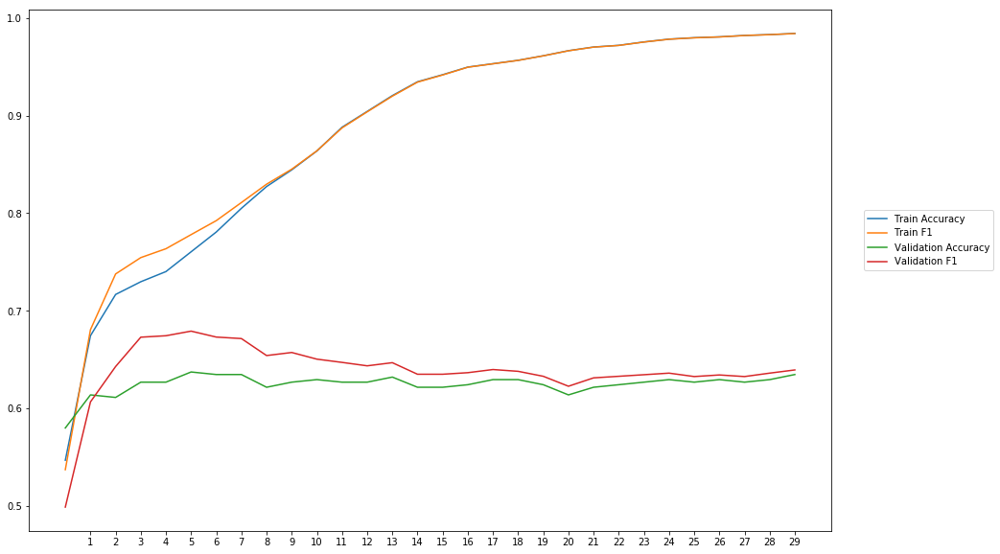

Average Accuracy: 62.45%
Average Precision: 61.36%
Average Recall: 67.02%
Average F1: 63.87%

-----Fold 6--------


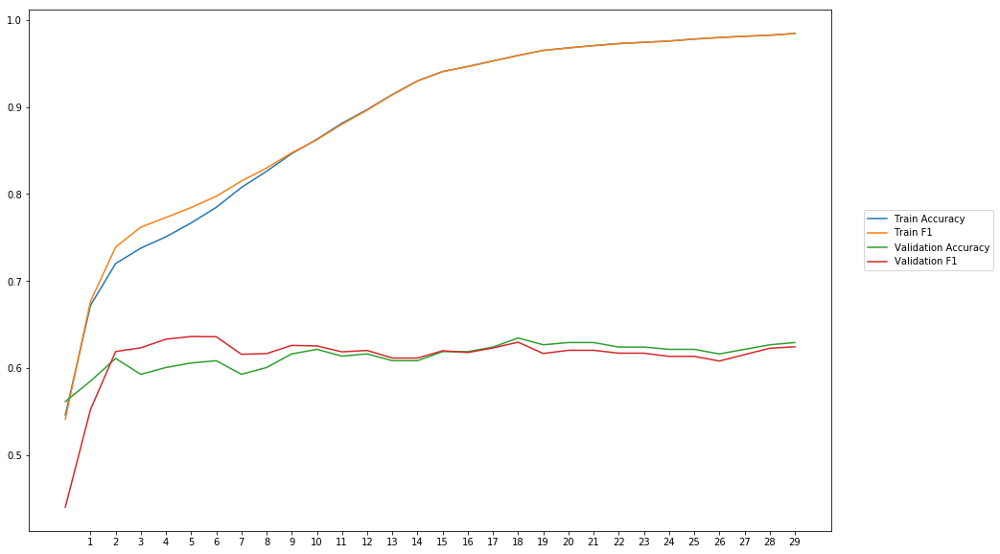

Average Accuracy: 61.36%
Average Precision: 61.28%
Average Recall: 61.55%
Average F1: 61.21%

-----Fold 7--------


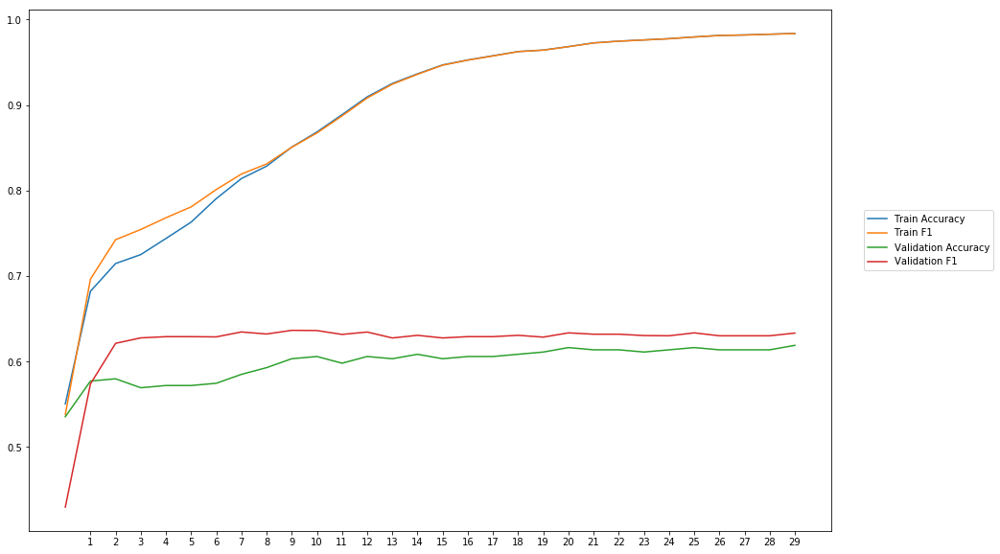

Average Accuracy: 59.86%
Average Precision: 58.62%
Average Recall: 66.70%
Average F1: 62.20%

-----Fold 8--------


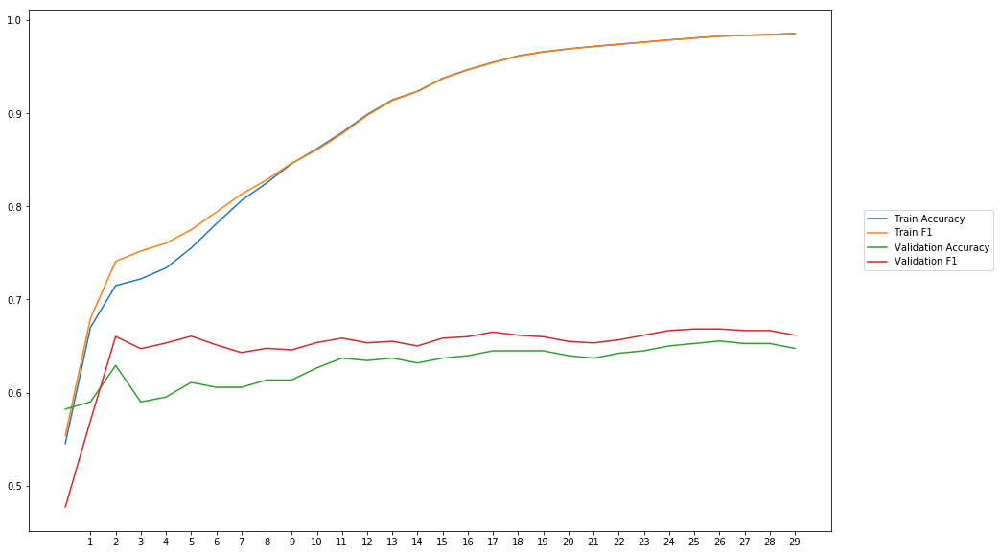

Average Accuracy: 62.97%
Average Precision: 61.61%
Average Recall: 69.02%
Average F1: 64.86%

-----Fold 9--------


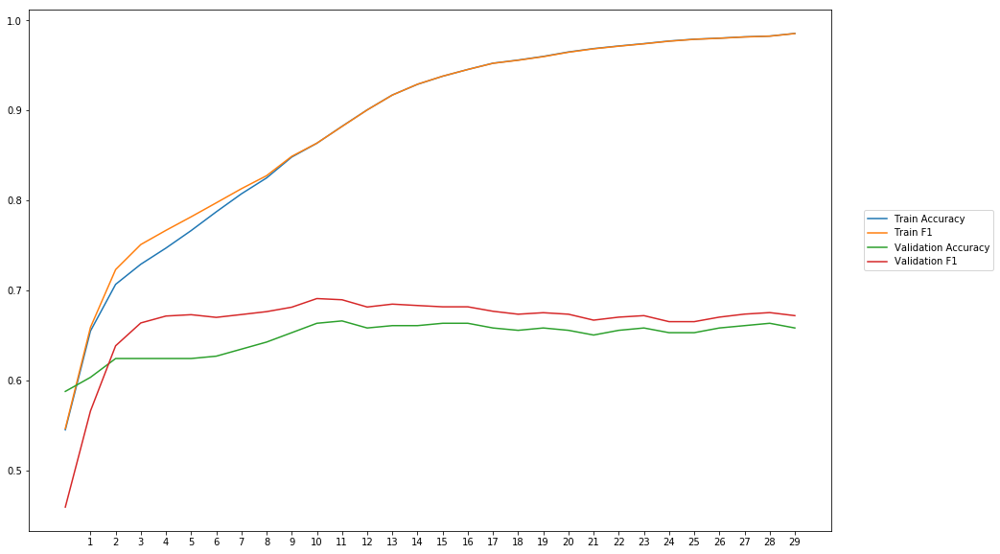

Average Accuracy: 64.71%
Average Precision: 63.24%
Average Recall: 70.38%
Average F1: 66.29%

-----Fold 10--------


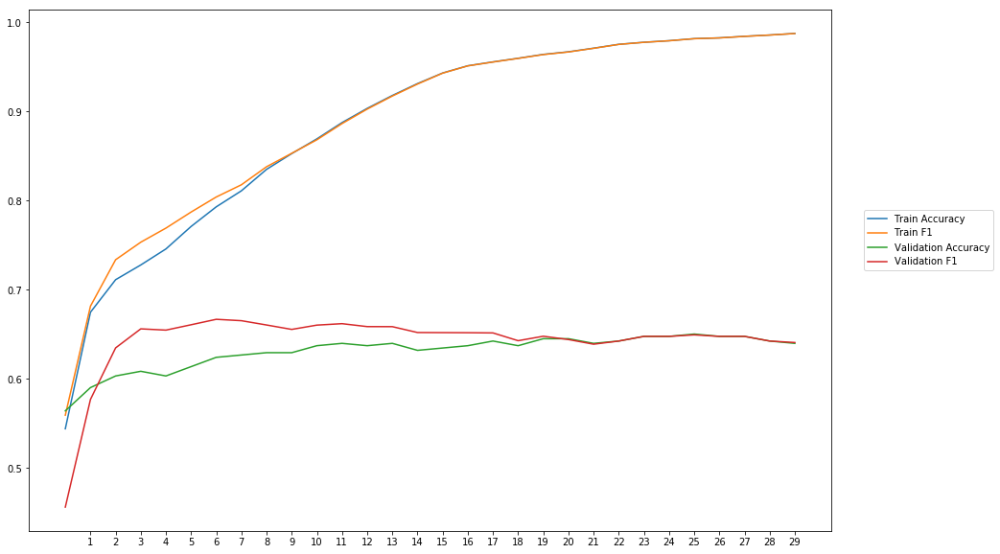

Average Accuracy: 63.07%
Average Precision: 62.14%
Average Recall: 67.03%
Average F1: 64.23%

-------Overallresults-------


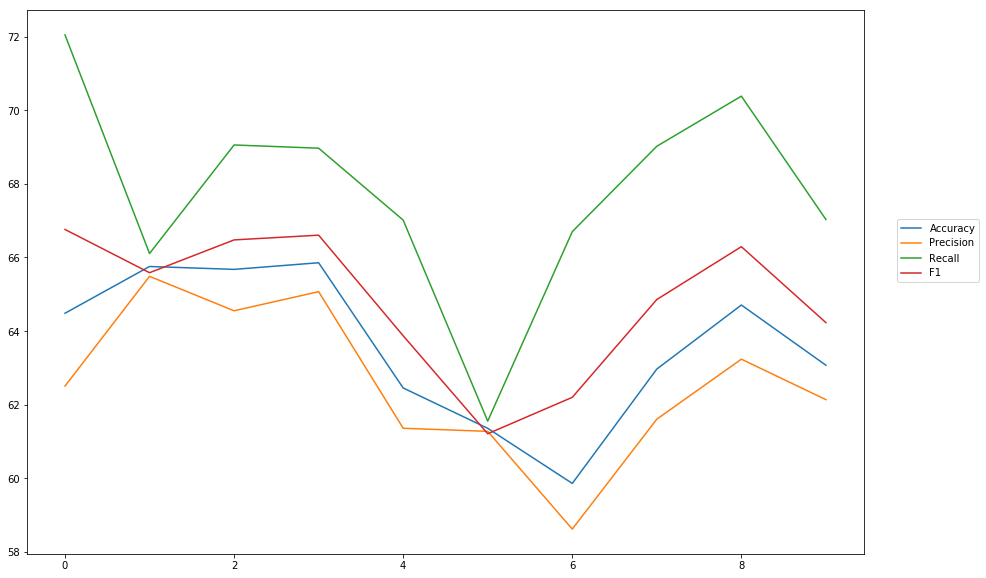

Accuracy: Mean = 63.62% (+/- 1.93%), Max = 65.86%, Min =  59.86%
Precision: Mean = 62.59% (+/- 1.98%), Max = 65.49%, Min =  58.62%
Recall: Mean = 67.79% (+/- 2.71%), Max = 72.05%, Min =  61.55%
F1: Mean = 64.81% (+/- 1.83%), Max = 66.76%, Min =  61.21%


In [30]:
cross_val_two_inputs(model_10, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_labels, softmax, outputpath, 'combined_outputs_senti_blob')

# Sentiment - Vadar

## Combine Inputs

In [31]:
#Input Words
wv_layer_11 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_11 = wv_layer_11(comment_input_11)
embedded_sequences_11 = Flatten()(embedded_sequences_11)

#Input POS
senti_input_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')

#Concat Inputs
concat_11 = concatenate([embedded_sequences_11, senti_input_11], axis=1)

x_11 = Dense(600, activation='relu')(concat_11)
preds_11 = Dense(2, activation='softmax')(x_11)

# build the model
model_11 = Model(inputs=[comment_input_11, senti_input_11], outputs=preds_11)
model_11.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_21 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_11 (Embedding)        (None, 40, 300)      3492600     input_21[0][0]                   
__________________________________________________________________________________________________
flatten_11 (Flatten)            (None, 12000)        0           embedding_11[0][0]               
__________________________________________________________________________________________________
input_22 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
concatenat


-----Fold 1--------


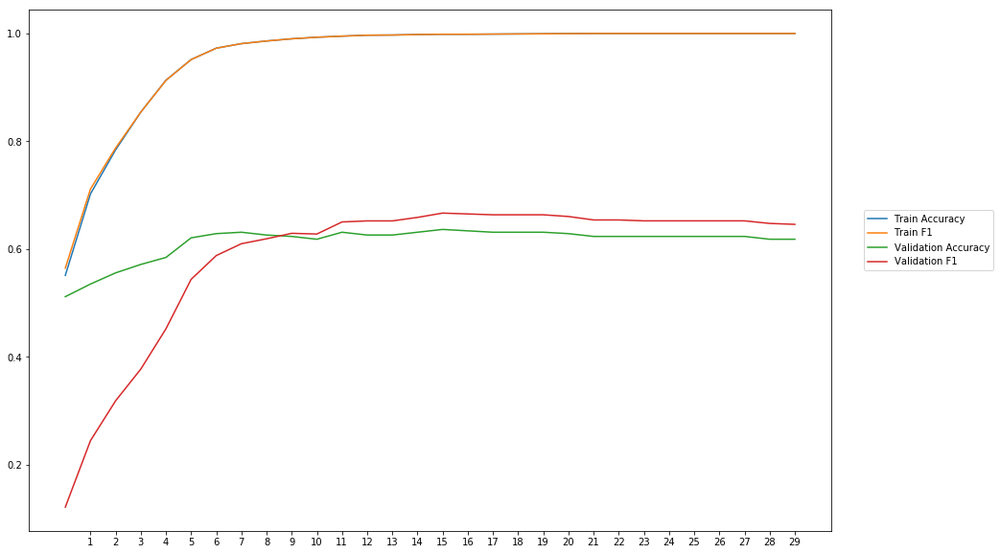

Average Accuracy: 61.38%
Average Precision: 62.11%
Average Recall: 60.12%
Average F1: 58.63%

-----Fold 2--------


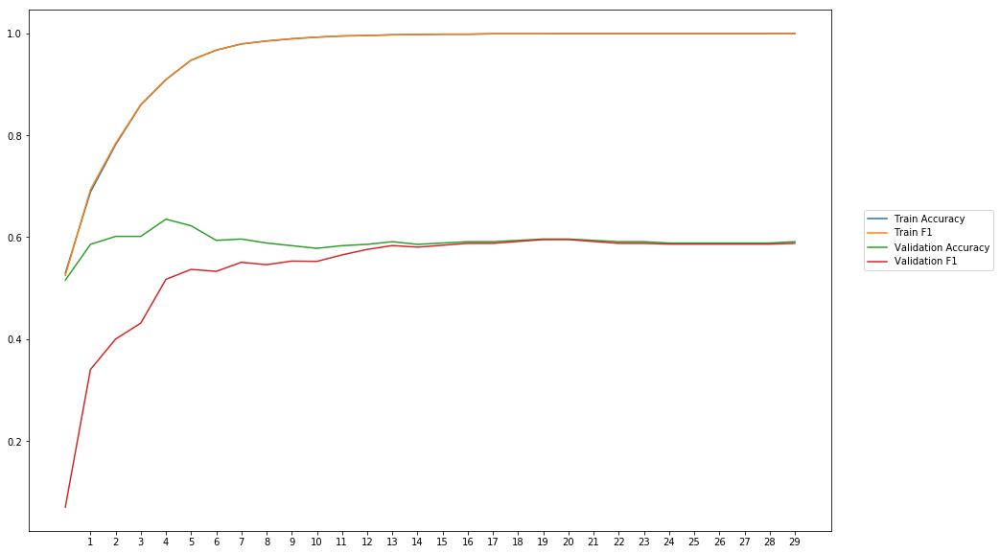

Average Accuracy: 59.05%
Average Precision: 62.65%
Average Recall: 50.80%
Average F1: 53.89%

-----Fold 3--------


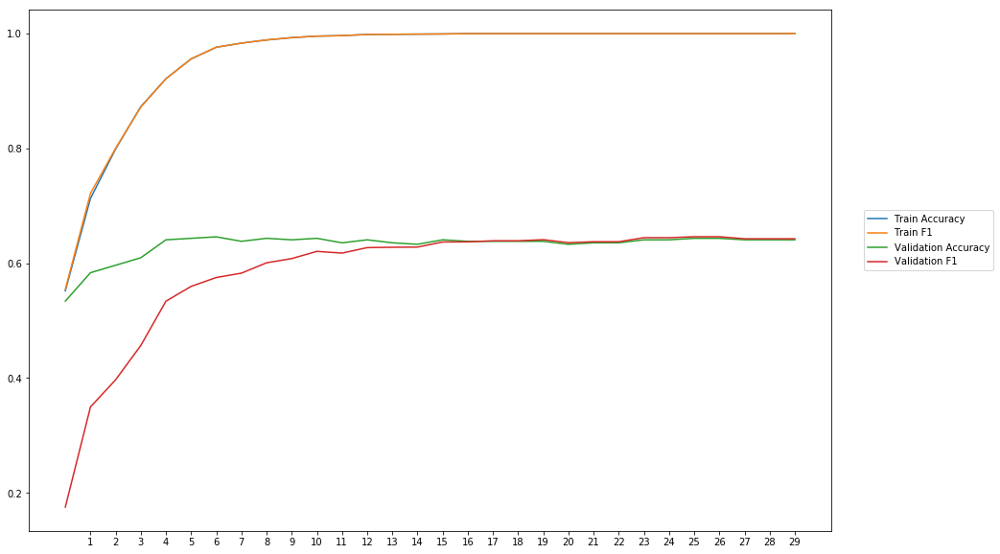

Average Accuracy: 63.16%
Average Precision: 66.61%
Average Recall: 55.38%
Average F1: 58.56%

-----Fold 4--------


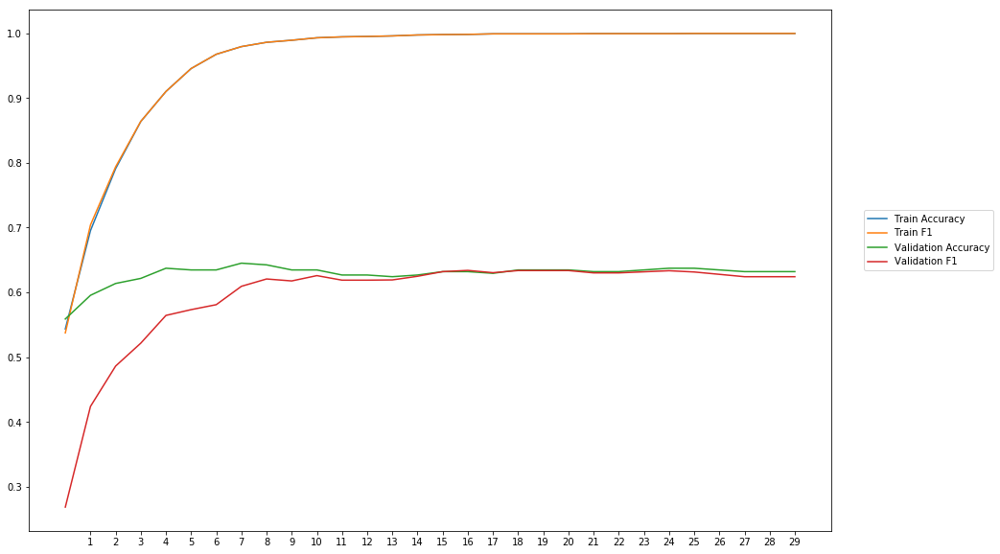

Average Accuracy: 62.85%
Average Precision: 65.47%
Average Recall: 56.35%
Average F1: 59.41%

-----Fold 5--------


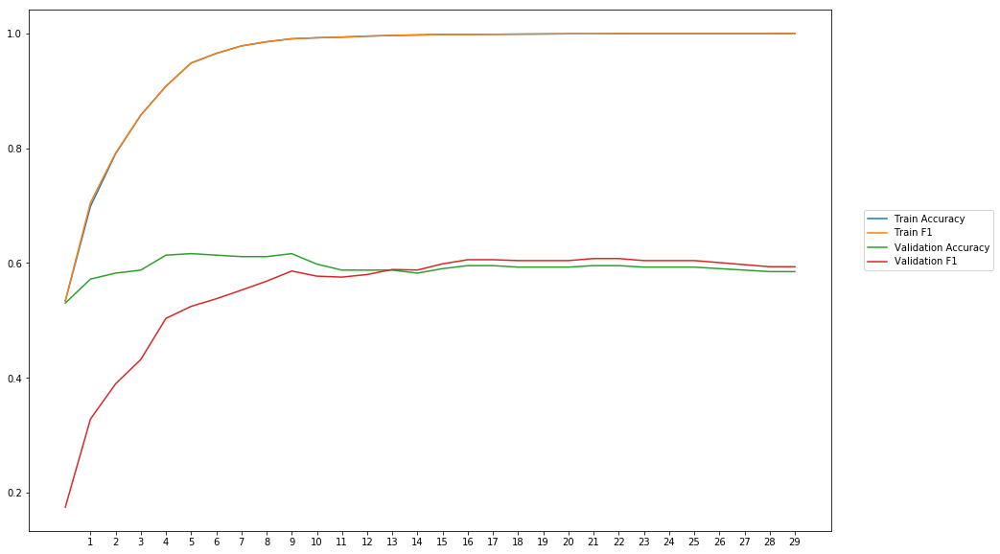

Average Accuracy: 59.23%
Average Precision: 61.91%
Average Recall: 52.88%
Average F1: 55.12%

-----Fold 6--------


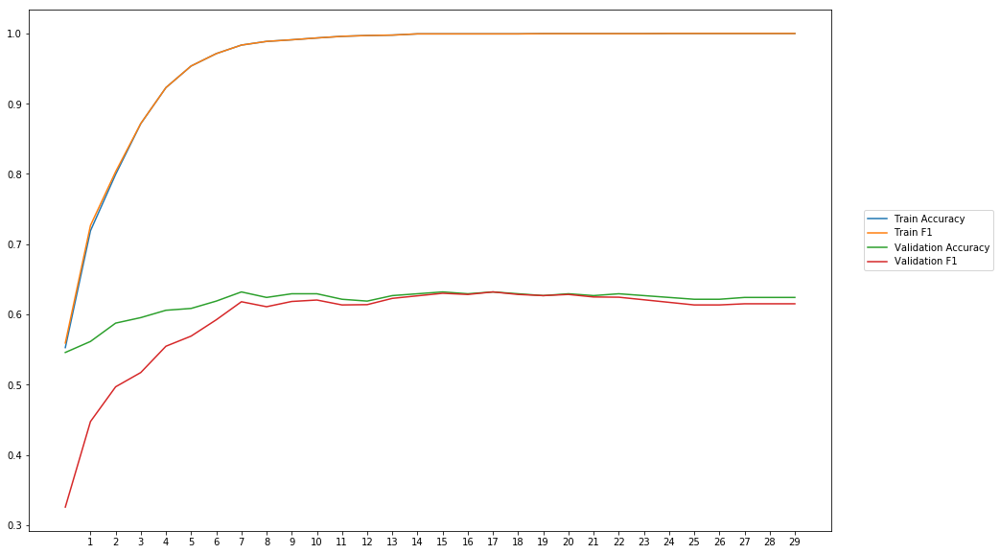

Average Accuracy: 61.78%
Average Precision: 62.89%
Average Recall: 56.93%
Average F1: 59.26%

-----Fold 7--------


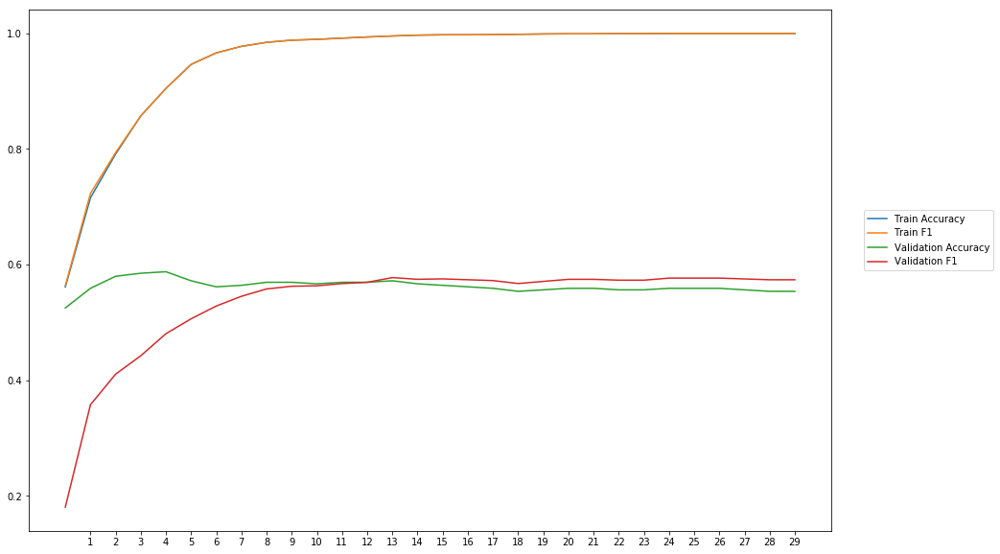

Average Accuracy: 56.26%
Average Precision: 57.63%
Average Recall: 52.44%
Average F1: 53.42%

-----Fold 8--------


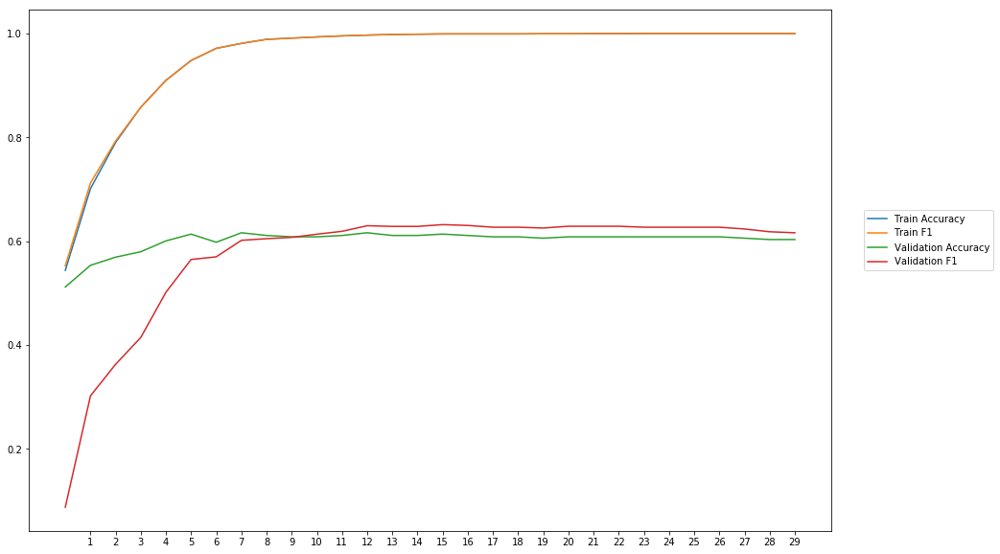

Average Accuracy: 60.12%
Average Precision: 61.43%
Average Recall: 57.07%
Average F1: 57.10%

-----Fold 9--------


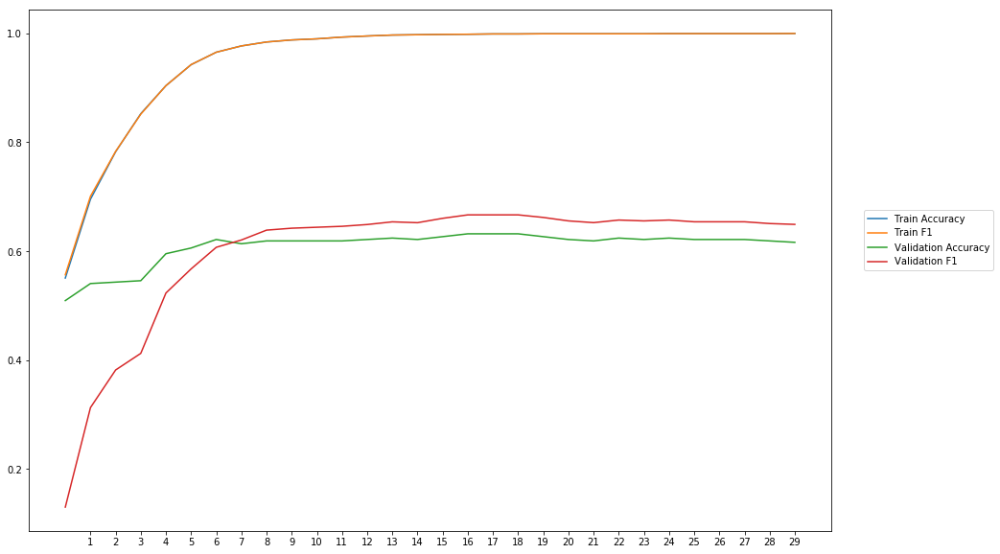

Average Accuracy: 60.91%
Average Precision: 60.33%
Average Recall: 62.67%
Average F1: 59.80%

-----Fold 10--------


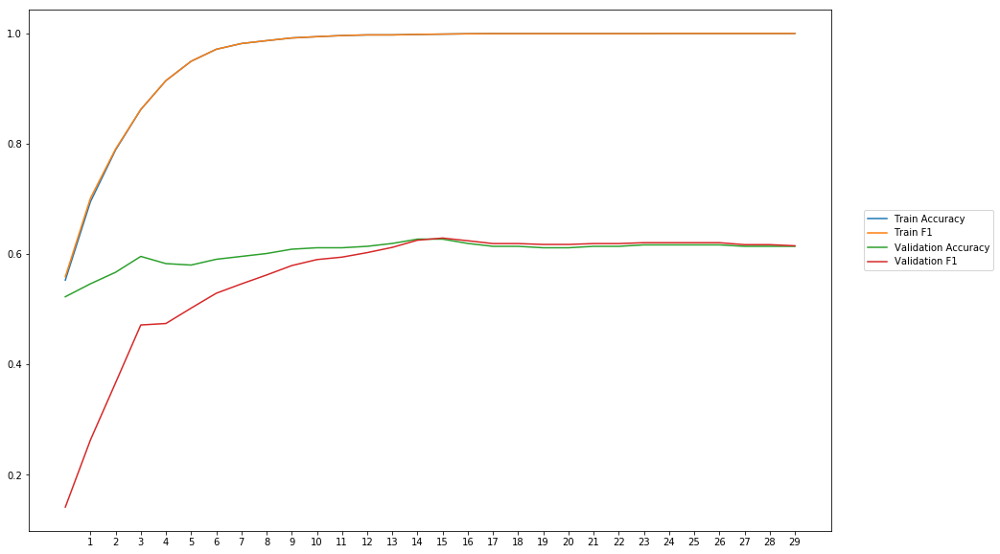

Average Accuracy: 60.31%
Average Precision: 62.45%
Average Recall: 53.37%
Average F1: 55.80%

-------Overallresults-------


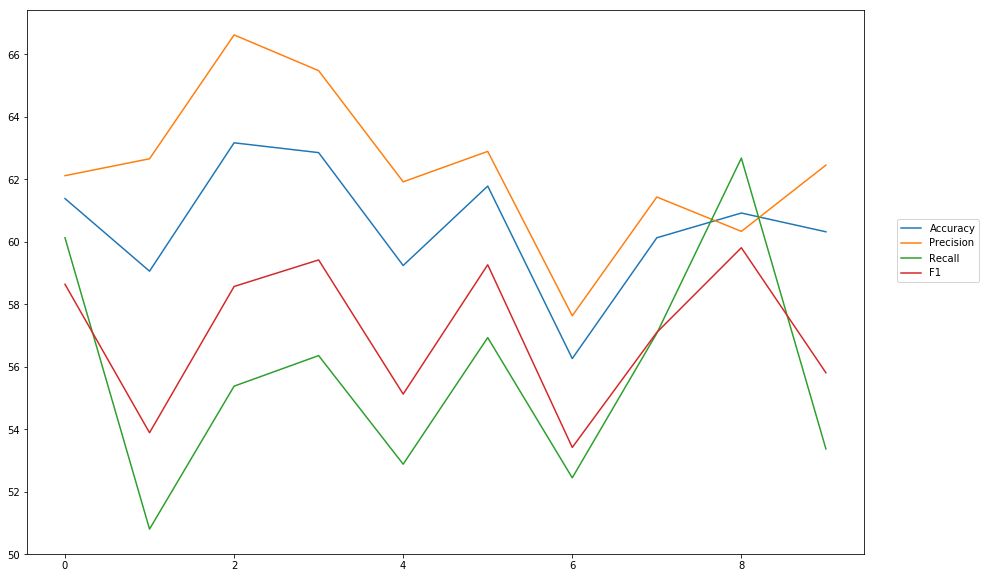

Accuracy: Mean = 60.51% (+/- 1.92%), Max = 63.16%, Min =  56.26%
Precision: Mean = 62.35% (+/- 2.36%), Max = 66.61%, Min =  57.63%
Recall: Mean = 55.80% (+/- 3.46%), Max = 62.67%, Min =  50.80%
F1: Mean = 57.10% (+/- 2.27%), Max = 59.80%, Min =  53.42%


In [32]:
cross_val_two_inputs(model_11, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_labels, softmax, outputpath, 'combined_input_senti_blob')

## Seperate Models combine results

In [33]:
#First part
wv_layer_12 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_12 = wv_layer_12(comment_input_12)
x_first_12 = Dense(600, activation='relu')(embedded_sequences_12)
x_first_12 = Flatten()(x_first_12)

#Second part
senti_input_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_12 = Dense(600, activation='relu')(senti_input_12)

#Concatination
concat_12 = concatenate([x_first_12, x_second_12])

#x_12 = Flatten()(concat)

preds_12 = Dense(2, activation='softmax')(concat_12)

model_12 = Model(inputs=[comment_input_12, senti_input_12], outputs=preds_12)
model_12.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_12 (Embedding)        (None, 40, 300)      3492600     input_23[0][0]                   
__________________________________________________________________________________________________
dense_38 (Dense)                (None, 40, 600)      180600      embedding_12[0][0]               
__________________________________________________________________________________________________
input_24 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_12


-----Fold 1--------


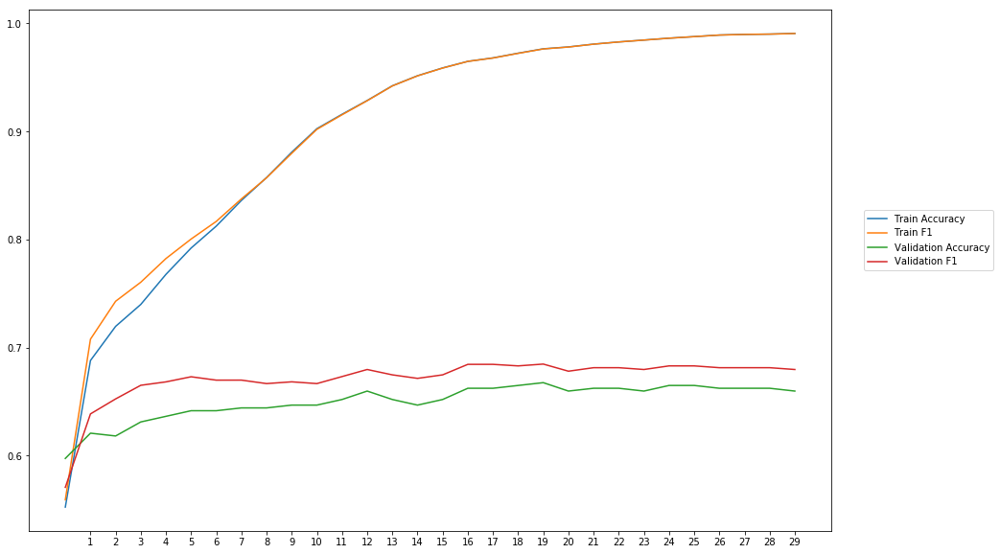

Average Accuracy: 65.03%
Average Precision: 63.18%
Average Recall: 71.63%
Average F1: 67.10%

-----Fold 2--------


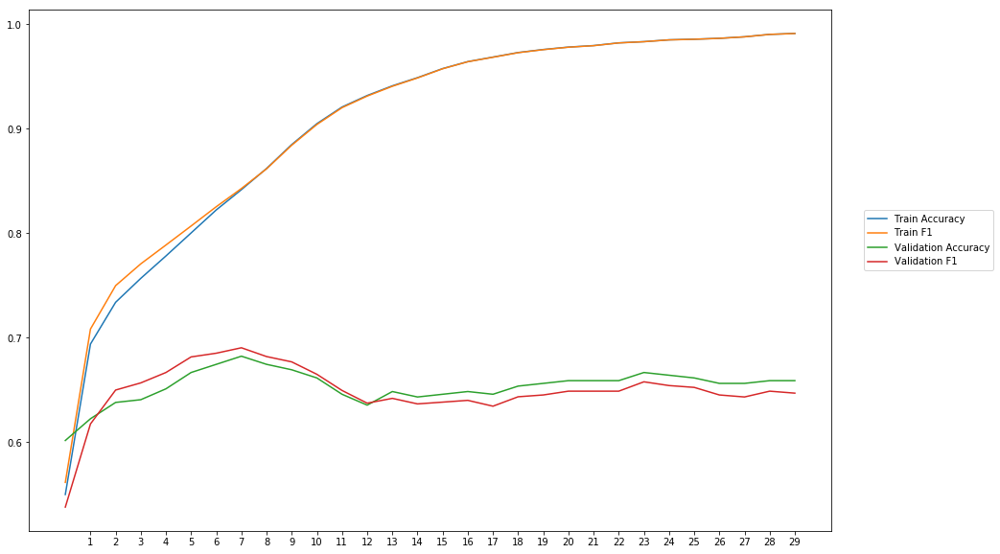

Average Accuracy: 65.35%
Average Precision: 65.35%
Average Recall: 64.64%
Average F1: 64.90%

-----Fold 3--------


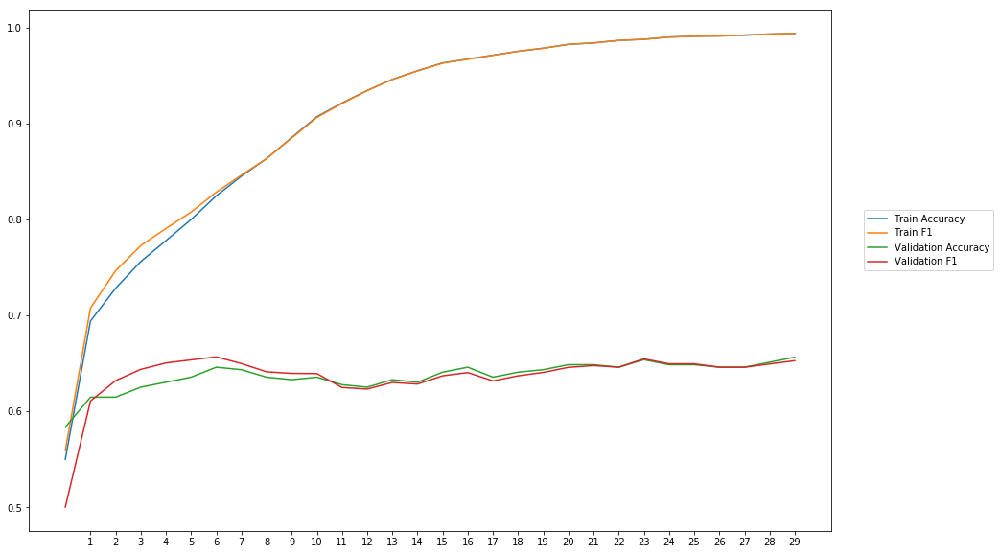

Average Accuracy: 63.70%
Average Precision: 63.36%
Average Recall: 64.12%
Average F1: 63.64%

-----Fold 4--------


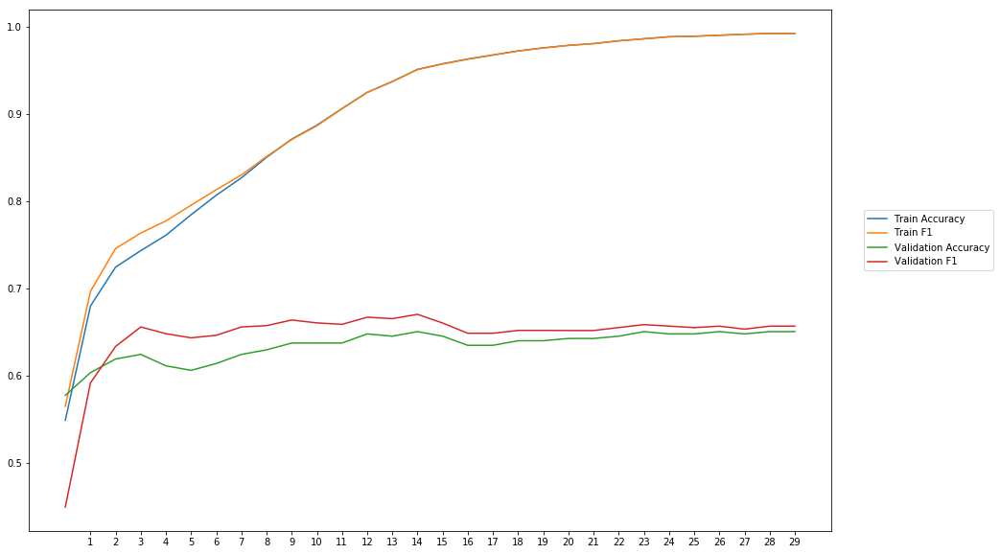

Average Accuracy: 63.42%
Average Precision: 62.41%
Average Recall: 67.40%
Average F1: 64.57%

-----Fold 5--------


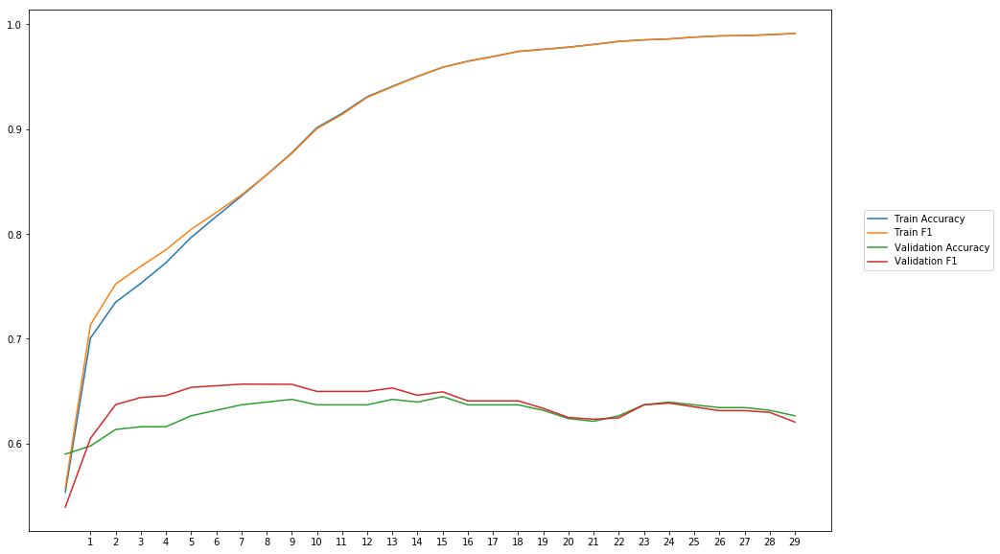

Average Accuracy: 63.02%
Average Precision: 62.40%
Average Recall: 65.18%
Average F1: 63.68%

-----Fold 6--------


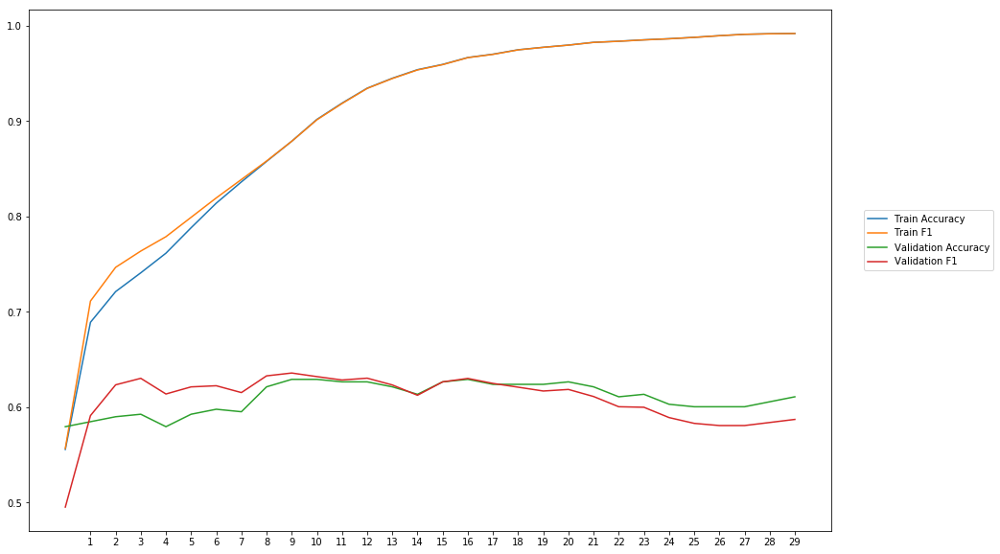

Average Accuracy: 61.01%
Average Precision: 60.99%
Average Recall: 61.13%
Average F1: 60.88%

-----Fold 7--------


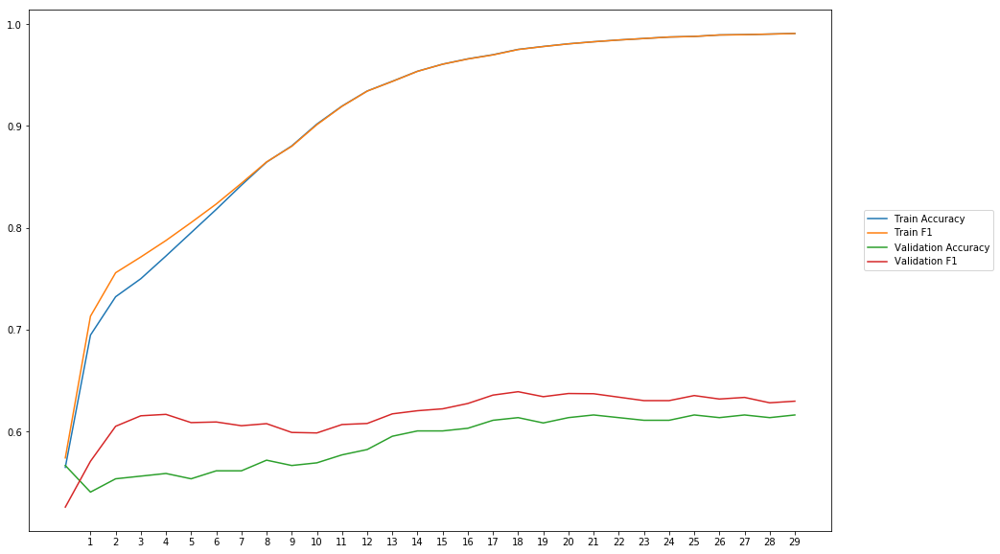

Average Accuracy: 58.97%
Average Precision: 57.84%
Average Recall: 66.25%
Average F1: 61.67%

-----Fold 8--------


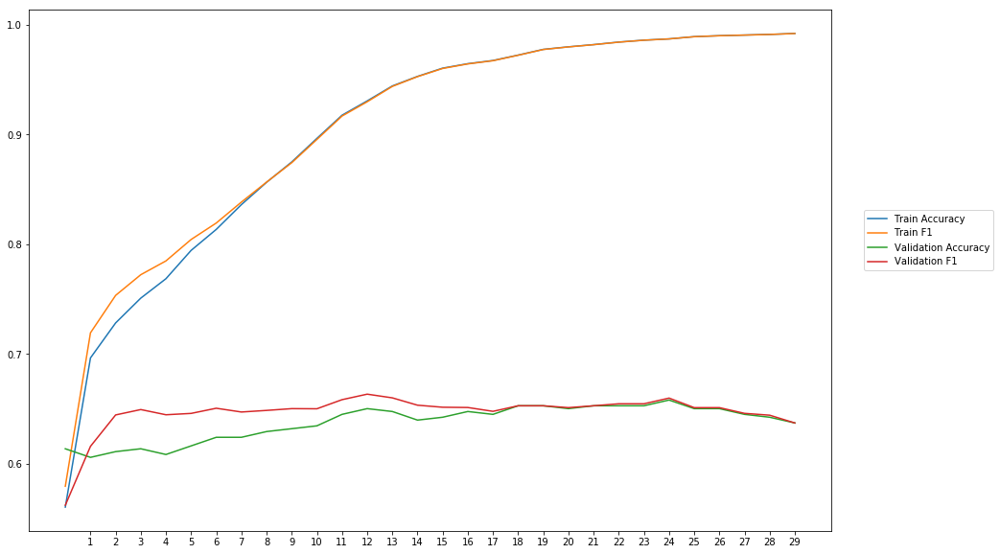

Average Accuracy: 63.75%
Average Precision: 63.02%
Average Recall: 66.63%
Average F1: 64.67%

-----Fold 9--------


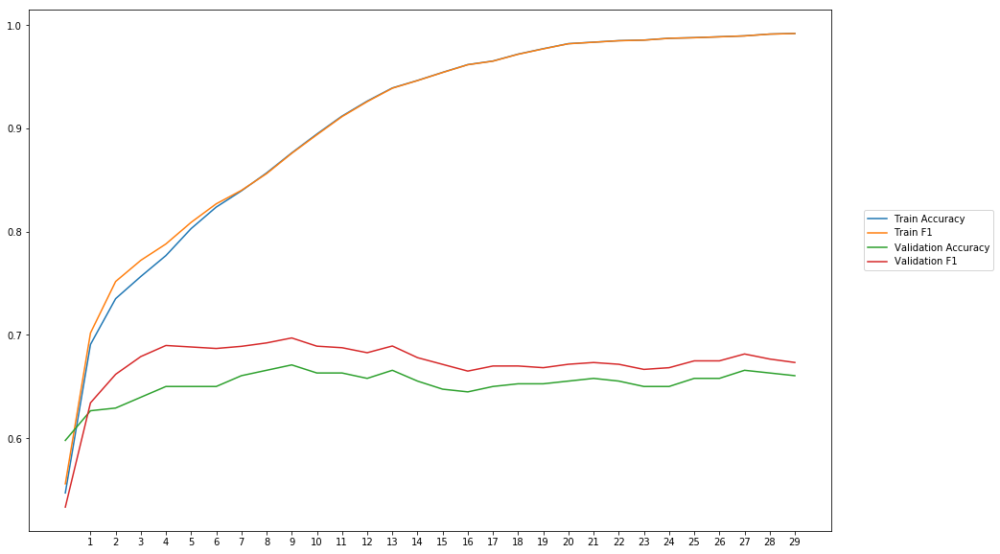

Average Accuracy: 65.23%
Average Precision: 63.40%
Average Recall: 71.75%
Average F1: 67.19%

-----Fold 10--------


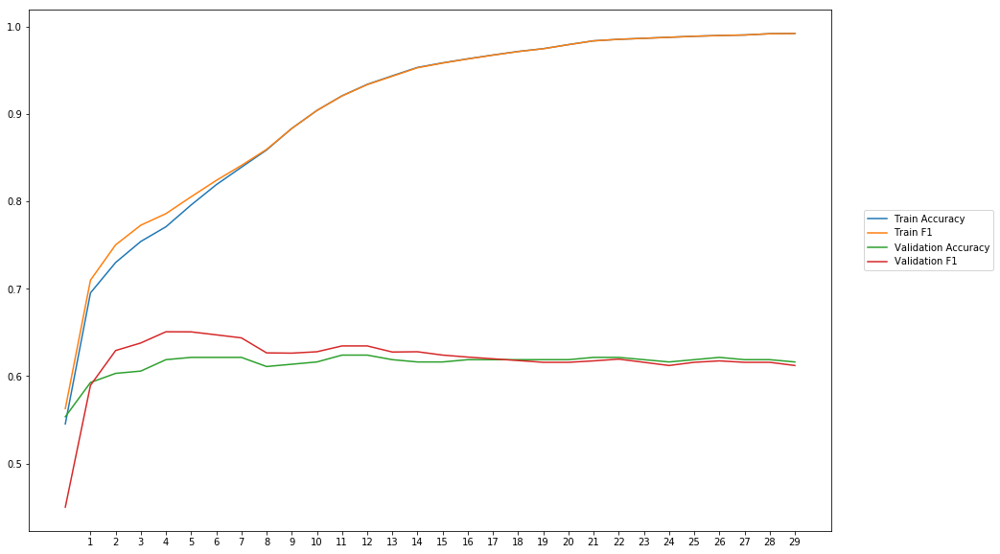

Average Accuracy: 61.48%
Average Precision: 61.02%
Average Recall: 63.07%
Average F1: 61.87%

-------Overallresults-------


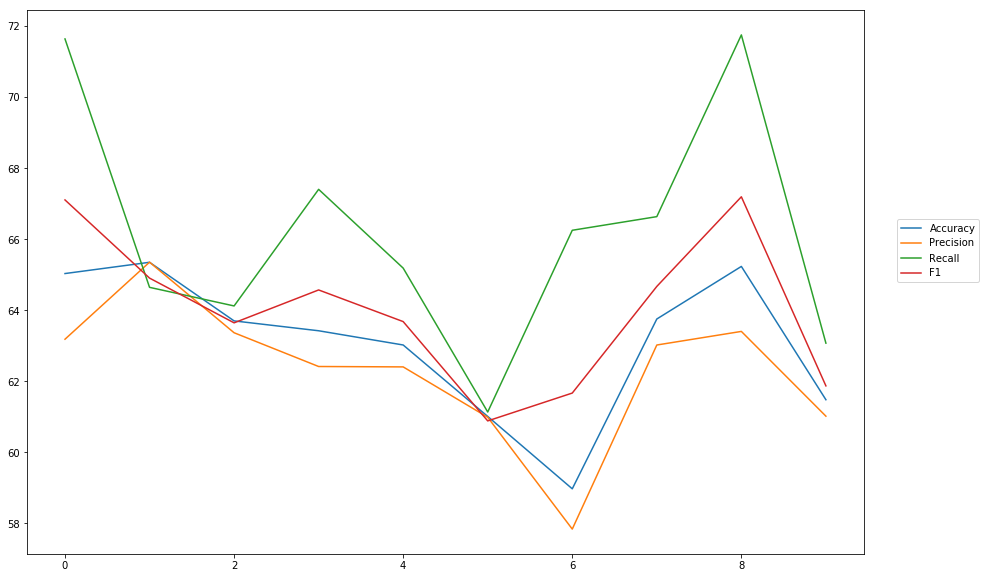

Accuracy: Mean = 63.10% (+/- 1.96%), Max = 65.35%, Min =  58.97%
Precision: Mean = 62.30% (+/- 1.90%), Max = 65.35%, Min =  57.84%
Recall: Mean = 66.18% (+/- 3.24%), Max = 71.75%, Min =  61.13%
F1: Mean = 64.02% (+/- 2.03%), Max = 67.19%, Min =  60.88%


In [34]:
cross_val_two_inputs(model_12, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_labels, softmax, outputpath, 'separat_models_senti_blob')

## Separate models combine output

### average

In [35]:
#First model
wv_layer_13 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_13 = wv_layer_13(comment_input_13)
x_first_13 = Dense(600, activation='relu')(embedded_sequences_13)
x_first_13 = Flatten()(x_first_13)
first_preds_13 = Dense(2, activation='softmax')(x_first_13)

#Second model
senti_input_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_13 = Dense(600, activation='relu')(senti_input_13)
second_preds_13 = Dense(2, activation='softmax')(x_second_13)

#Concat outputs
preds_13 = average([first_preds_13, second_preds_13])

model_13 = Model(inputs=[comment_input_13, senti_input_13], outputs=preds_13)
model_13.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_13 (Embedding)        (None, 40, 300)      3492600     input_25[0][0]                   
__________________________________________________________________________________________________
dense_41 (Dense)                (None, 40, 600)      180600      embedding_13[0][0]               
__________________________________________________________________________________________________
input_26 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_13


-----Fold 1--------


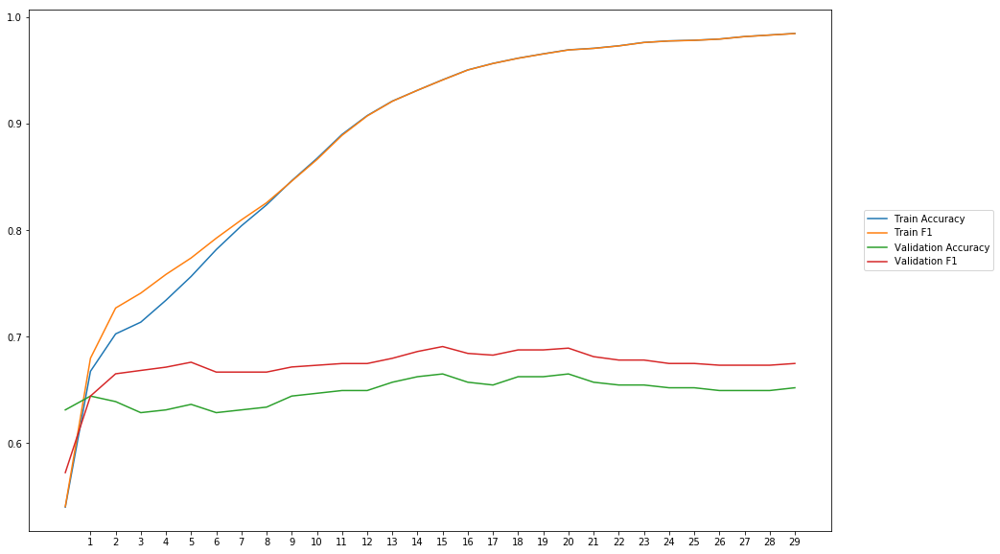

Average Accuracy: 64.83%
Average Precision: 62.87%
Average Recall: 72.47%
Average F1: 67.20%

-----Fold 2--------


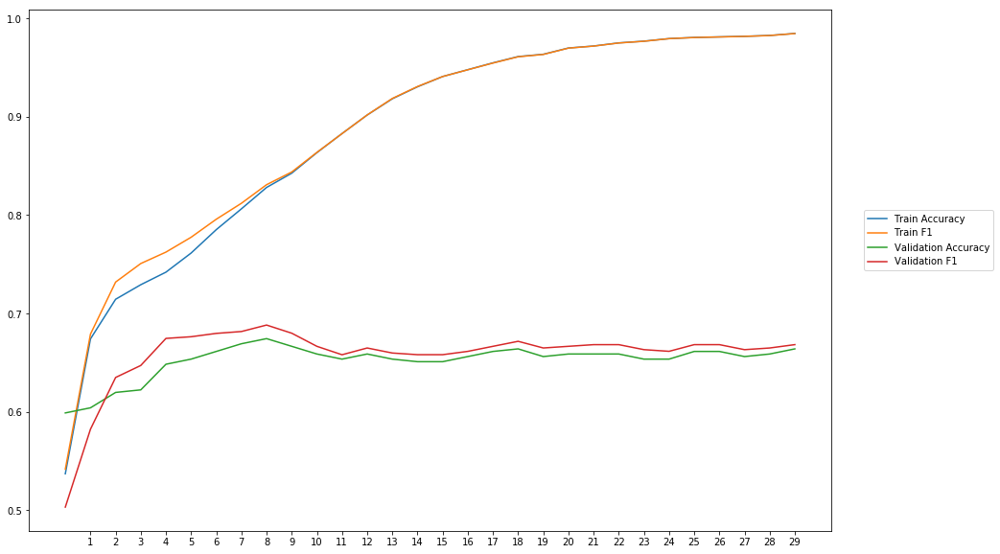

Average Accuracy: 65.23%
Average Precision: 64.33%
Average Recall: 67.66%
Average F1: 65.80%

-----Fold 3--------


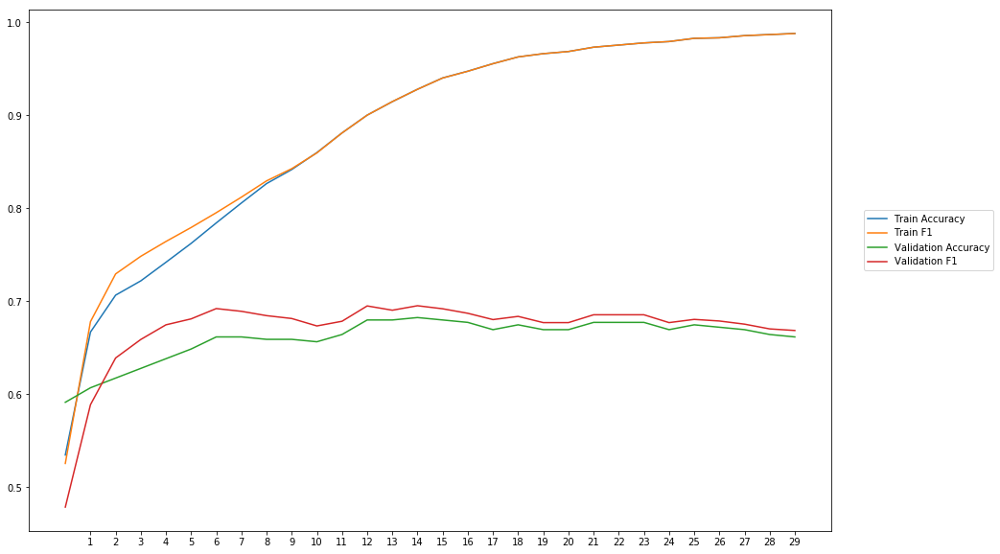

Average Accuracy: 66.04%
Average Precision: 64.76%
Average Recall: 69.88%
Average F1: 67.00%

-----Fold 4--------


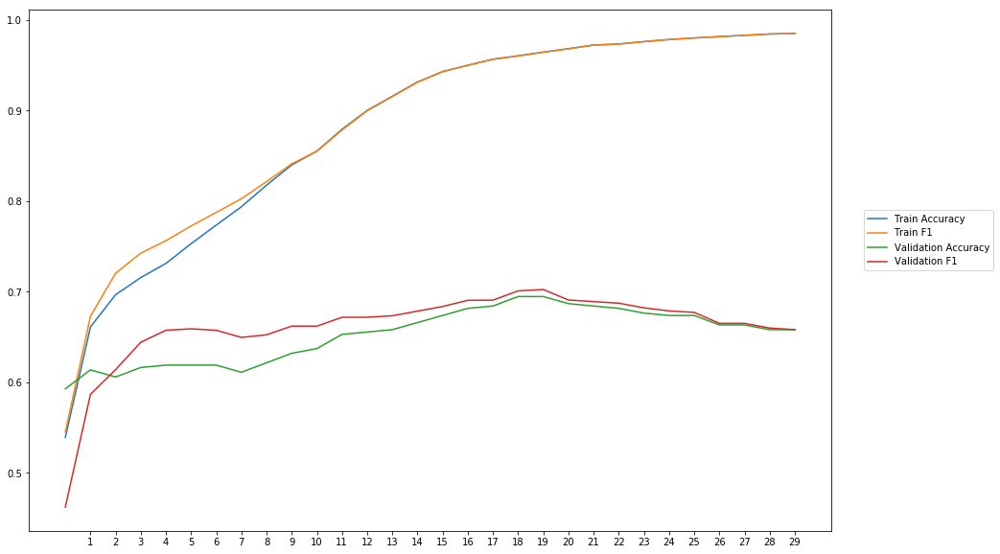

Average Accuracy: 65.21%
Average Precision: 64.40%
Average Recall: 68.46%
Average F1: 66.07%

-----Fold 5--------


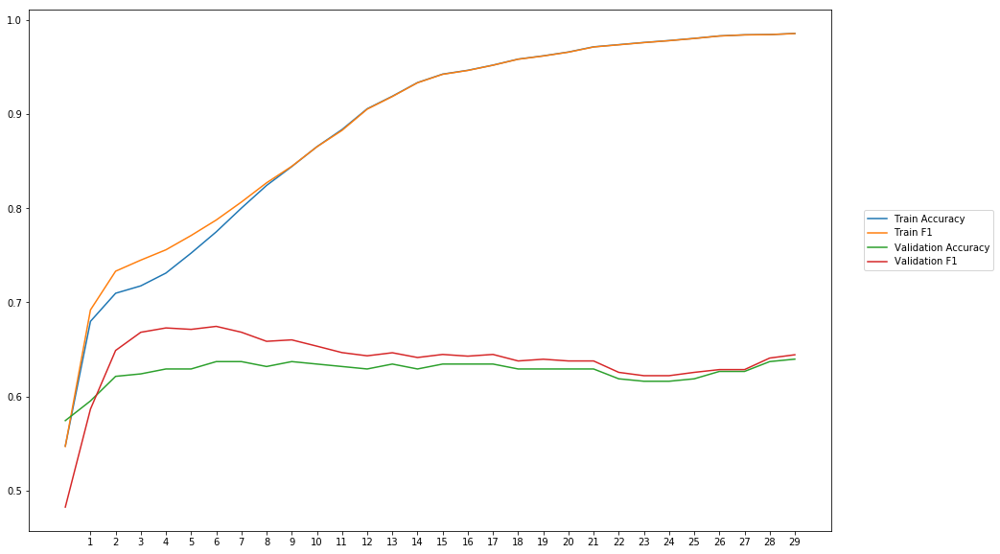

Average Accuracy: 62.65%
Average Precision: 61.66%
Average Recall: 66.54%
Average F1: 63.82%

-----Fold 6--------


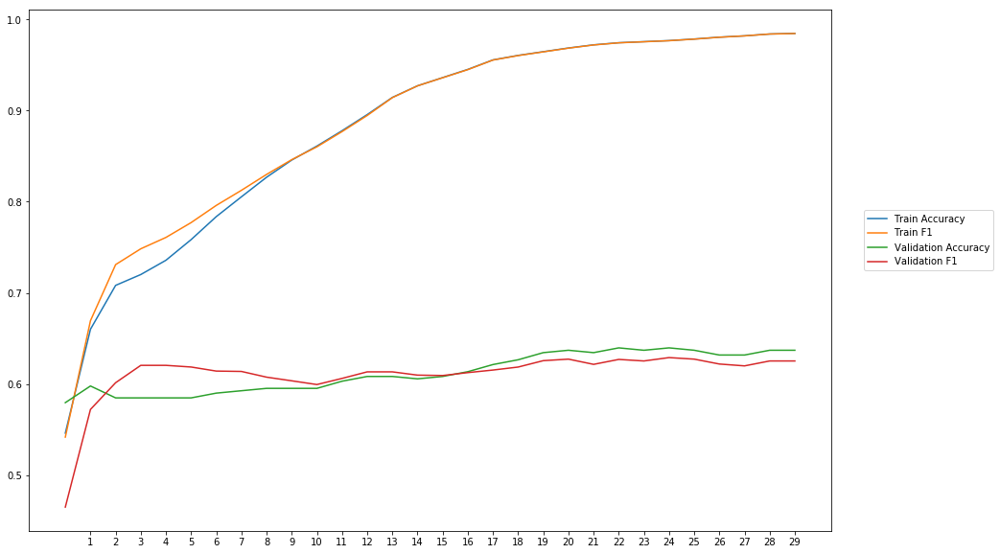

Average Accuracy: 61.26%
Average Precision: 61.40%
Average Recall: 61.12%
Average F1: 61.04%

-----Fold 7--------


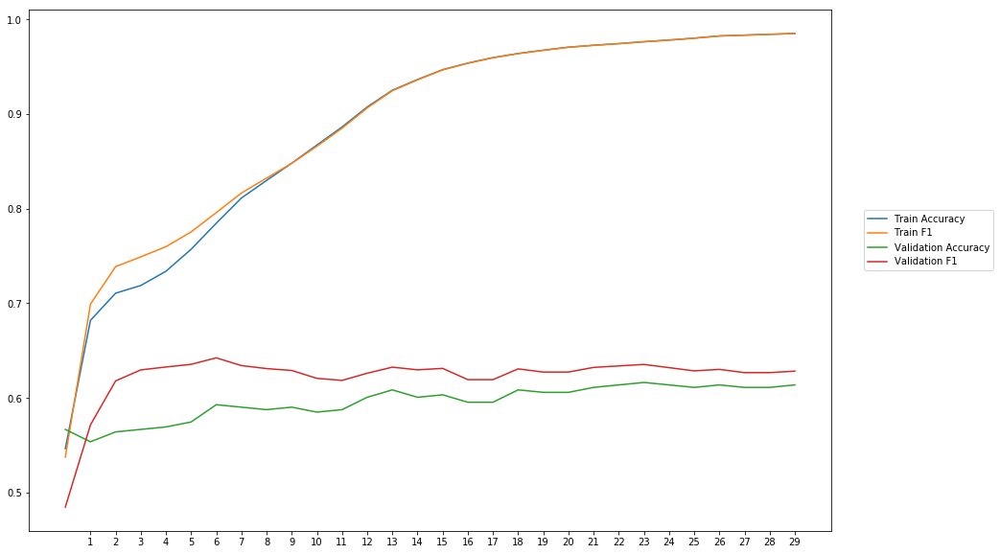

Average Accuracy: 59.55%
Average Precision: 58.31%
Average Recall: 67.07%
Average F1: 62.20%

-----Fold 8--------


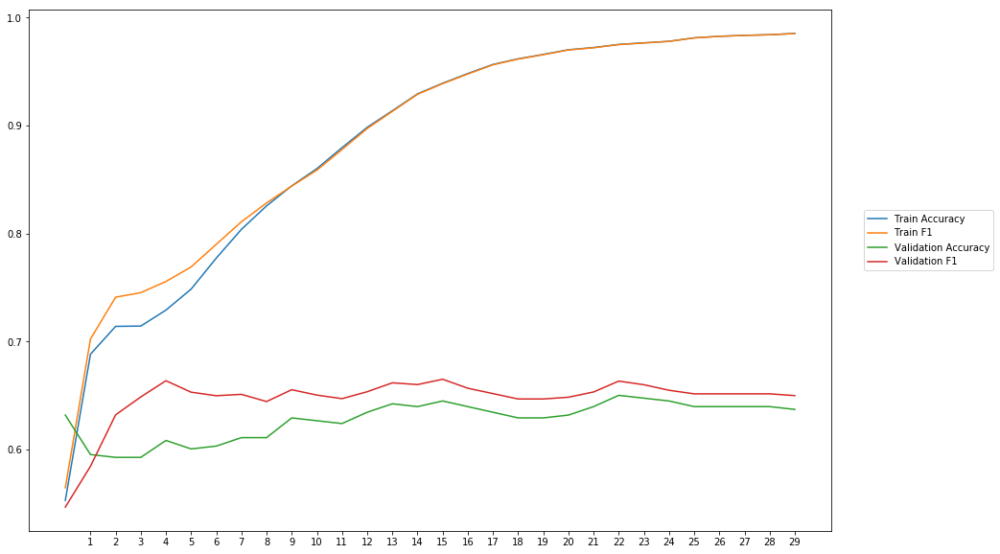

Average Accuracy: 62.77%
Average Precision: 61.58%
Average Recall: 68.66%
Average F1: 64.68%

-----Fold 9--------


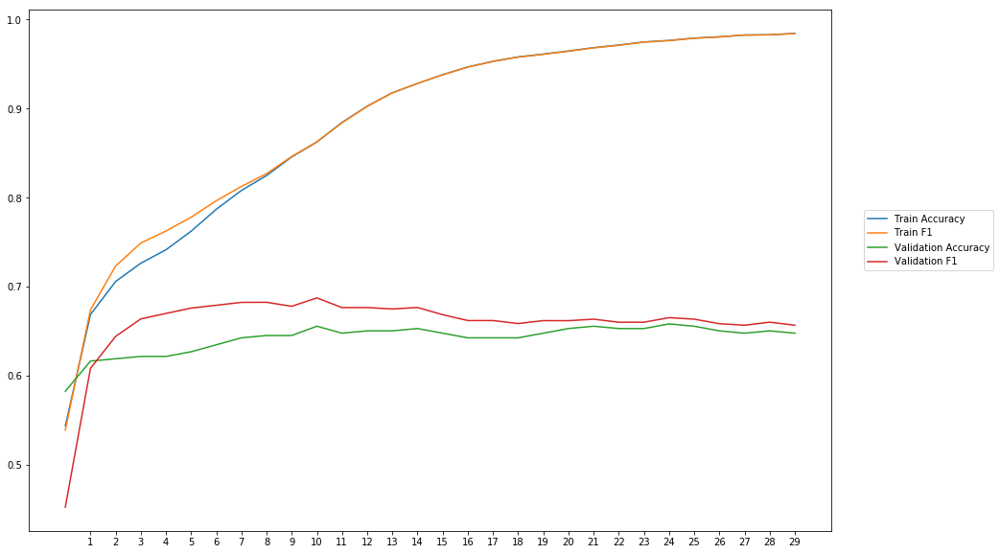

Average Accuracy: 64.18%
Average Precision: 62.78%
Average Recall: 69.84%
Average F1: 65.80%

-----Fold 10--------


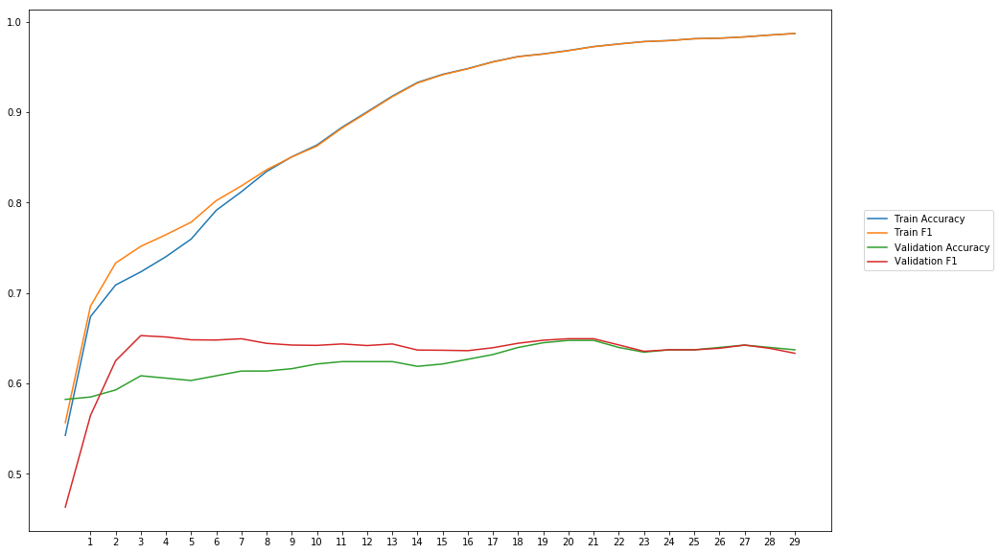

Average Accuracy: 62.36%
Average Precision: 61.66%
Average Recall: 65.72%
Average F1: 63.35%

-------Overallresults-------


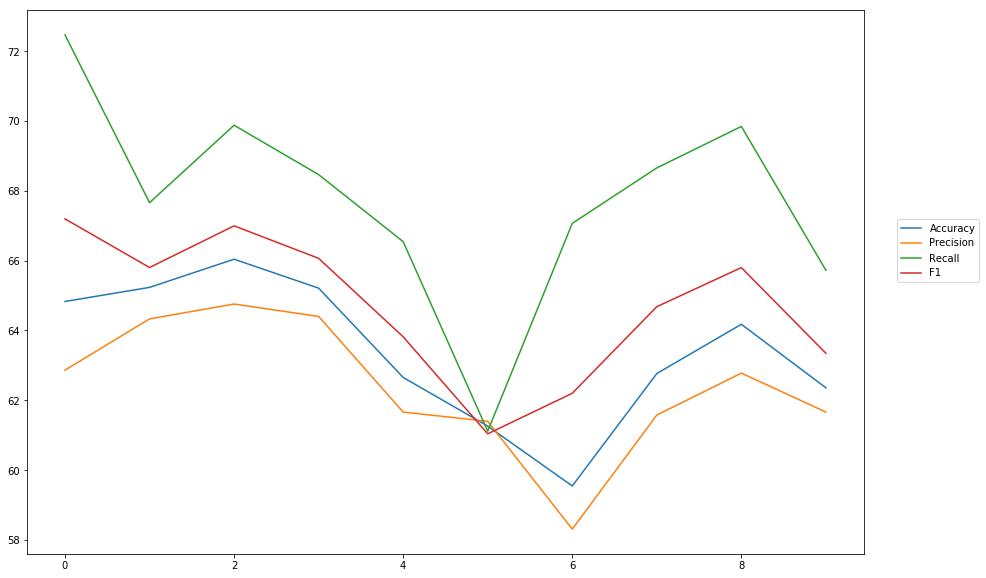

Accuracy: Mean = 63.41% (+/- 1.94%), Max = 66.04%, Min =  59.55%
Precision: Mean = 62.38% (+/- 1.82%), Max = 64.76%, Min =  58.31%
Recall: Mean = 67.74% (+/- 2.87%), Max = 72.47%, Min =  61.12%
F1: Mean = 64.70% (+/- 1.95%), Max = 67.20%, Min =  61.04%


In [36]:
cross_val_two_inputs(model_13, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_labels, softmax, outputpath, 'combined_outputs_senti_vadar')

# Combined Blob and Vadar

## Combine Inputs

In [37]:
#Input Words
wv_layer_14 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_14 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_14 = wv_layer_14(comment_input_14)
embedded_sequences_14 = Flatten()(embedded_sequences_14)

#Input Senti
senti_input_14_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
senti_input_14_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')

#Concat Inputs
concat_14 = concatenate([embedded_sequences_14, senti_input_14_blob, senti_input_14_vadar], axis=1)

x_14 = Dense(600, activation='relu')(concat_14)
preds_14 = Dense(2, activation='softmax')(x_14)

# build the model
model_14 = Model(inputs=[comment_input_14, senti_input_14_blob, senti_input_14_vadar], outputs=preds_14)
model_14.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_27 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_14 (Embedding)        (None, 40, 300)      3492600     input_27[0][0]                   
__________________________________________________________________________________________________
flatten_14 (Flatten)            (None, 12000)        0           embedding_14[0][0]               
__________________________________________________________________________________________________
input_28 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
input_29 (


-----Fold 1--------


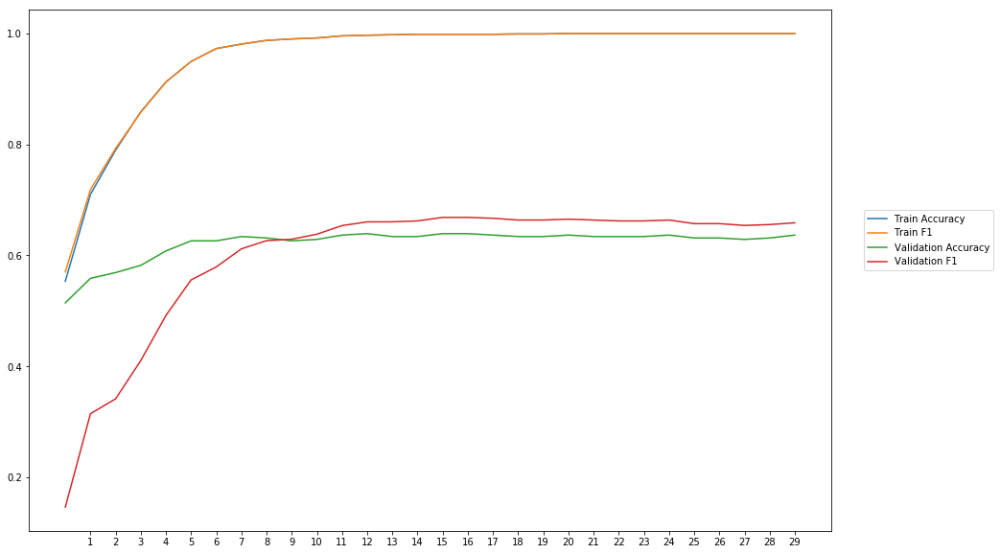

Average Accuracy: 62.20%
Average Precision: 63.14%
Average Recall: 60.82%
Average F1: 59.69%

-----Fold 2--------


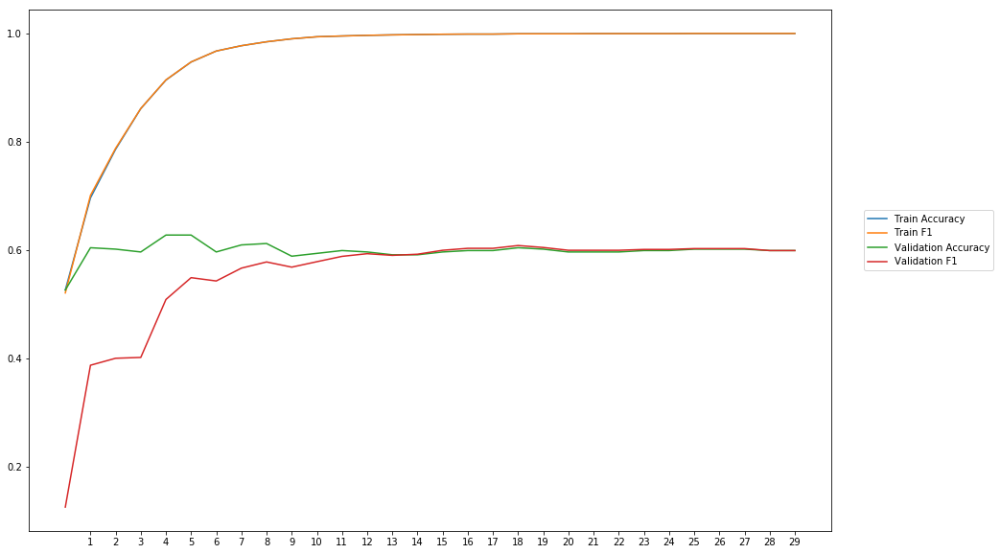

Average Accuracy: 59.84%
Average Precision: 63.24%
Average Recall: 52.72%
Average F1: 55.31%

-----Fold 3--------


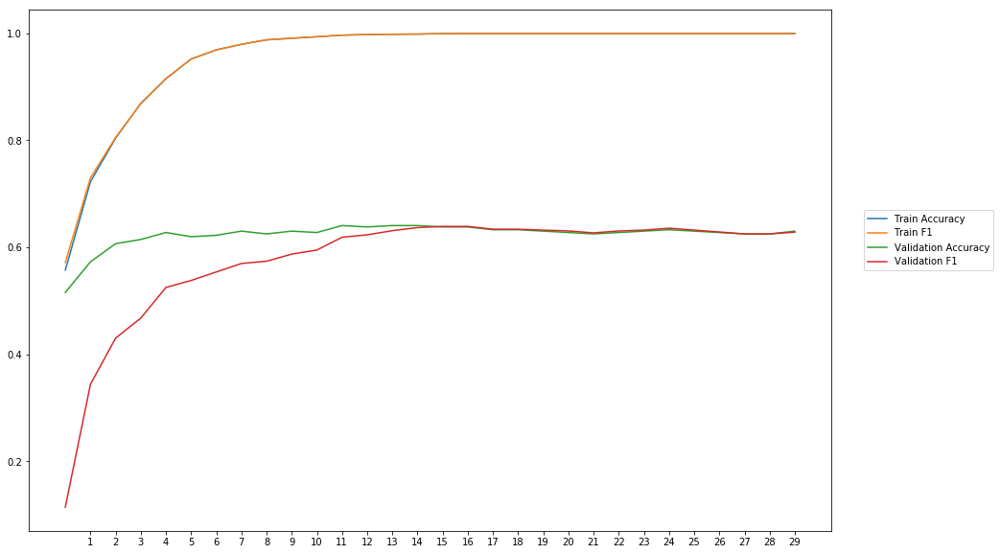

Average Accuracy: 62.35%
Average Precision: 65.23%
Average Recall: 54.43%
Average F1: 57.60%

-----Fold 4--------


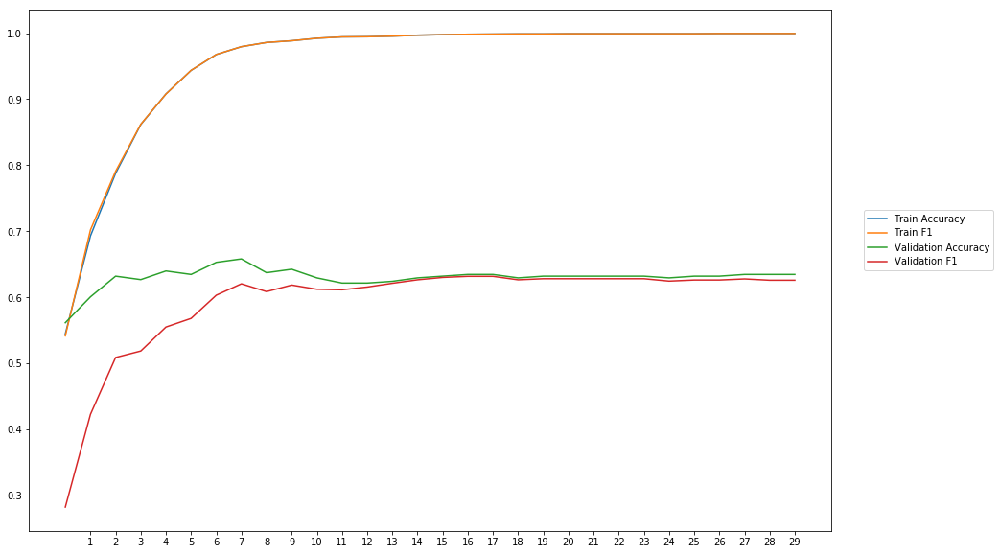

Average Accuracy: 62.99%
Average Precision: 65.99%
Average Recall: 55.90%
Average F1: 59.35%

-----Fold 5--------


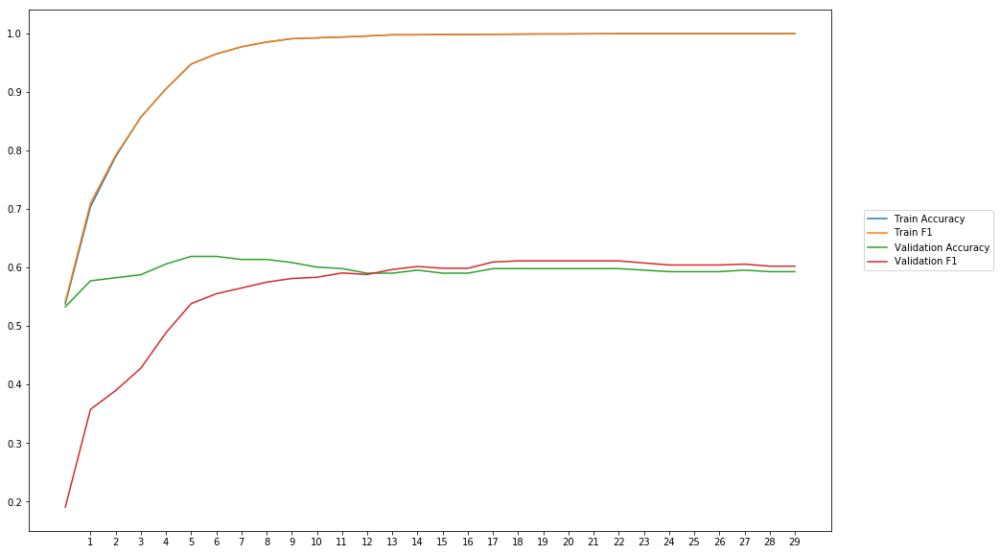

Average Accuracy: 59.51%
Average Precision: 61.96%
Average Recall: 53.72%
Average F1: 55.72%

-----Fold 6--------


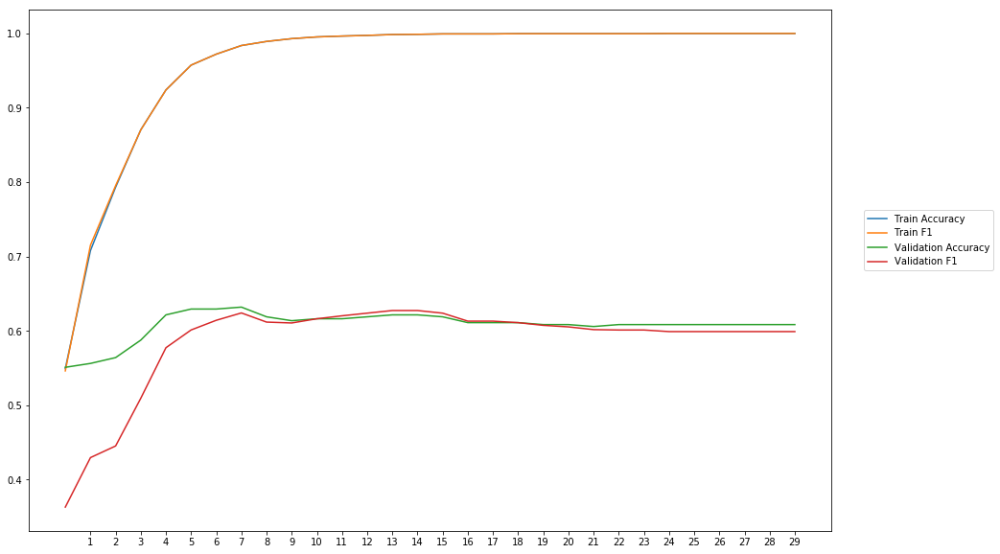

Average Accuracy: 60.79%
Average Precision: 61.64%
Average Recall: 56.70%
Average F1: 58.57%

-----Fold 7--------


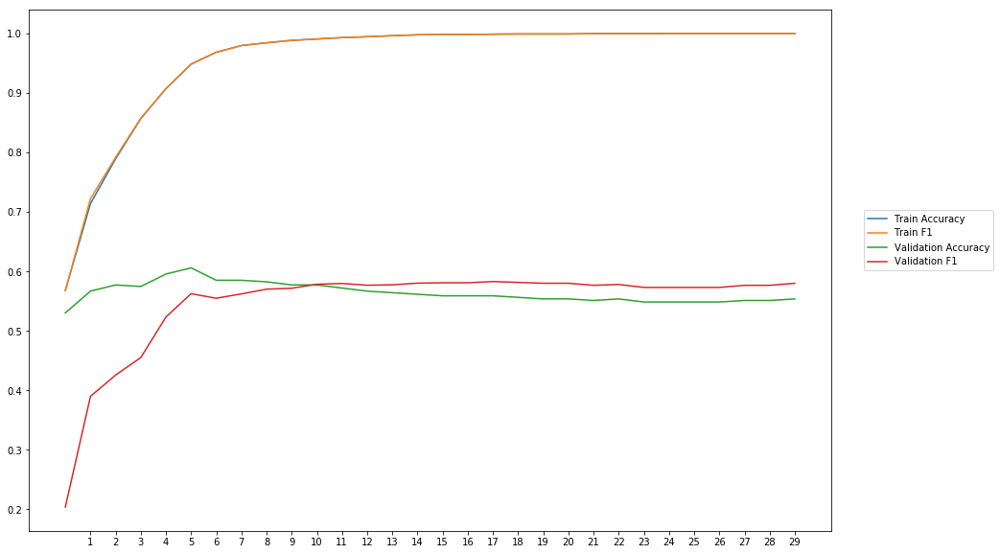

Average Accuracy: 56.37%
Average Precision: 57.42%
Average Recall: 54.52%
Average F1: 54.57%

-----Fold 8--------


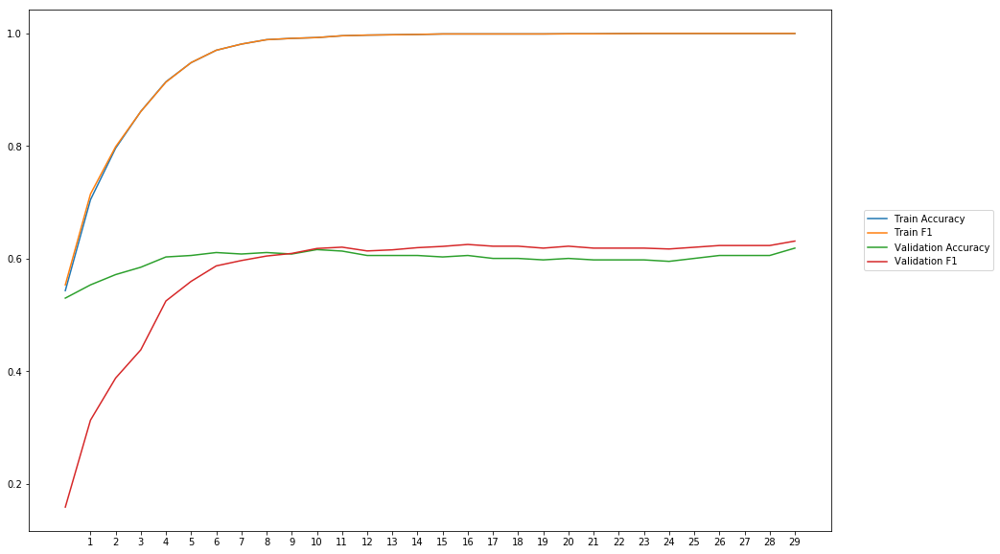

Average Accuracy: 59.90%
Average Precision: 61.29%
Average Recall: 57.26%
Average F1: 57.33%

-----Fold 9--------


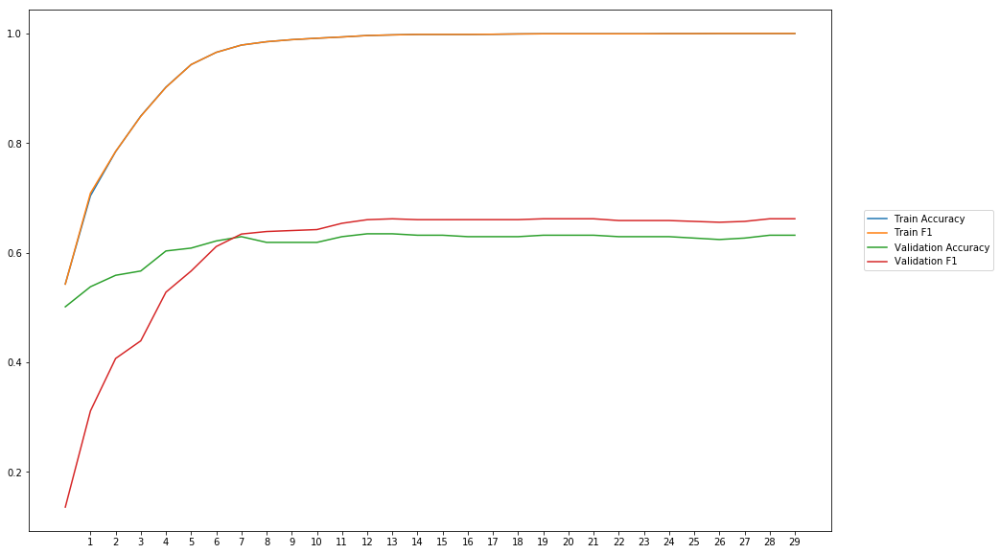

Average Accuracy: 61.52%
Average Precision: 60.91%
Average Recall: 62.74%
Average F1: 60.29%

-----Fold 10--------


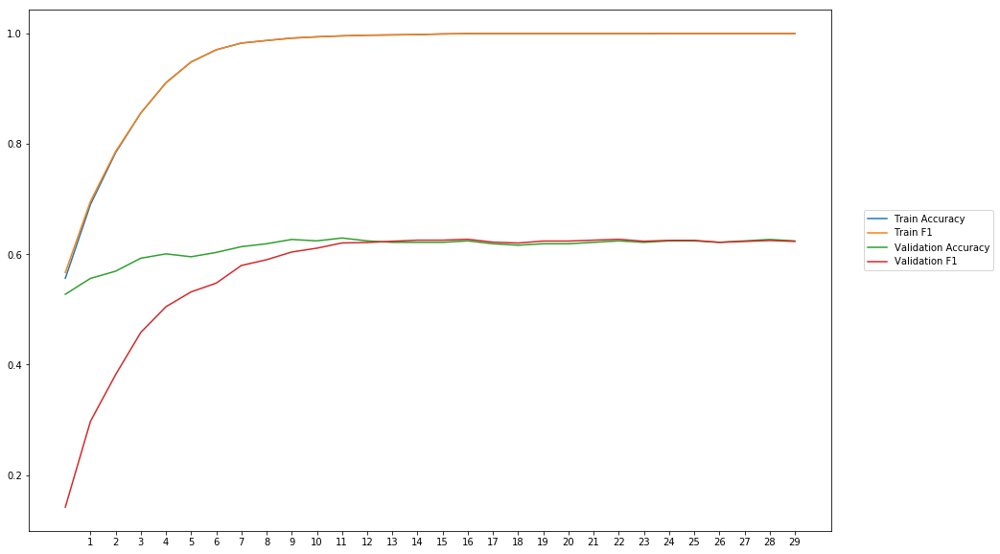

Average Accuracy: 61.17%
Average Precision: 63.51%
Average Recall: 54.66%
Average F1: 56.99%

-------Overallresults-------


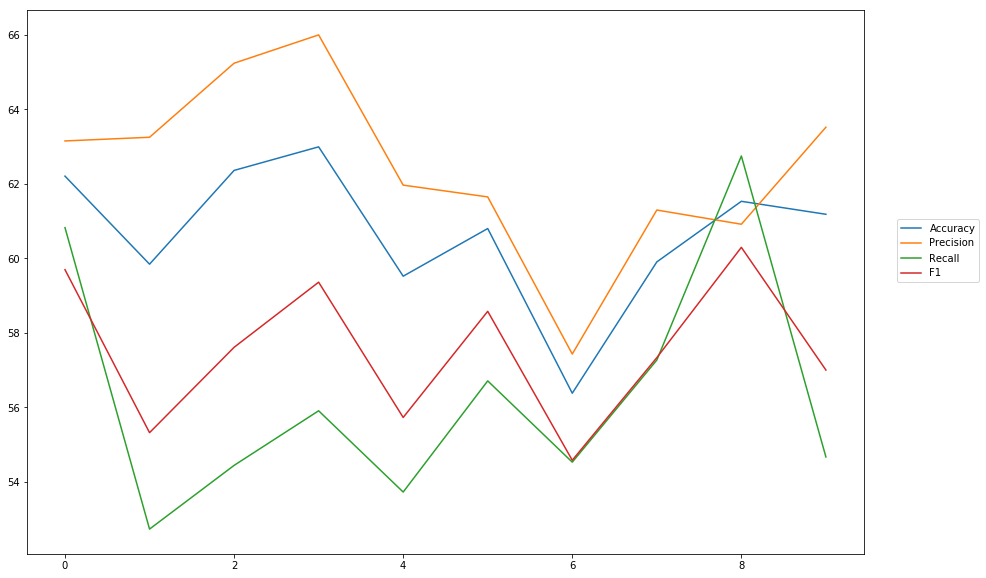

Accuracy: Mean = 60.66% (+/- 1.81%), Max = 62.99%, Min =  56.37%
Precision: Mean = 62.43% (+/- 2.29%), Max = 65.99%, Min =  57.42%
Recall: Mean = 56.35% (+/- 3.03%), Max = 62.74%, Min =  52.72%
F1: Mean = 57.54% (+/- 1.84%), Max = 60.29%, Min =  54.57%


In [38]:
cross_val_three_inputs(model_14, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_senti_vadar, train_labels, softmax, outputpath, 'combined_input_senti_blob_vadar')

## Seperate Models combine results

In [40]:
#First part
wv_layer_15 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_15 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_15 = wv_layer_15(comment_input_15)
x_first_15 = Dense(600, activation='relu')(embedded_sequences_15)
x_first_15 = Flatten()(x_first_15)

#Second part
senti_input_15_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_15 = Dense(600, activation='relu')(senti_input_15_blob)

#Thrid part
senti_input_15_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_third_15 = Dense(600, activation='relu')(senti_input_15_vadar)

#Concatination
concat_15 = concatenate([x_first_15, x_second_15, x_third_15])

preds_15 = Dense(2, activation='softmax')(concat_15)

model_15 = Model(inputs=[comment_input_15, senti_input_15_blob, senti_input_15_vadar], outputs=preds_15)
model_15.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_33 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_16 (Embedding)        (None, 40, 300)      3492600     input_33[0][0]                   
__________________________________________________________________________________________________
dense_50 (Dense)                (None, 40, 600)      180600      embedding_16[0][0]               
__________________________________________________________________________________________________
input_34 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
input_35 (


-----Fold 1--------


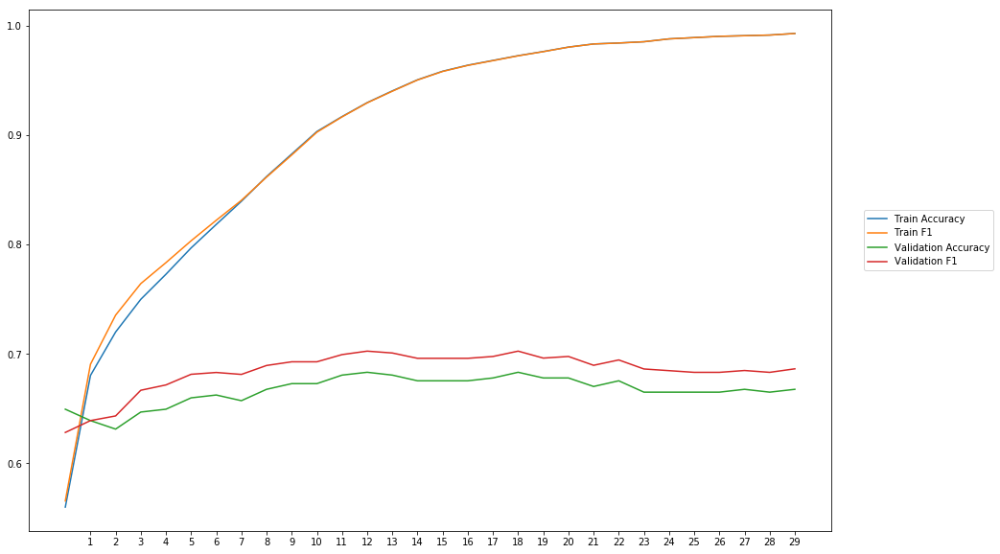

Average Accuracy: 66.67%
Average Precision: 64.82%
Average Recall: 72.53%
Average F1: 68.42%

-----Fold 2--------


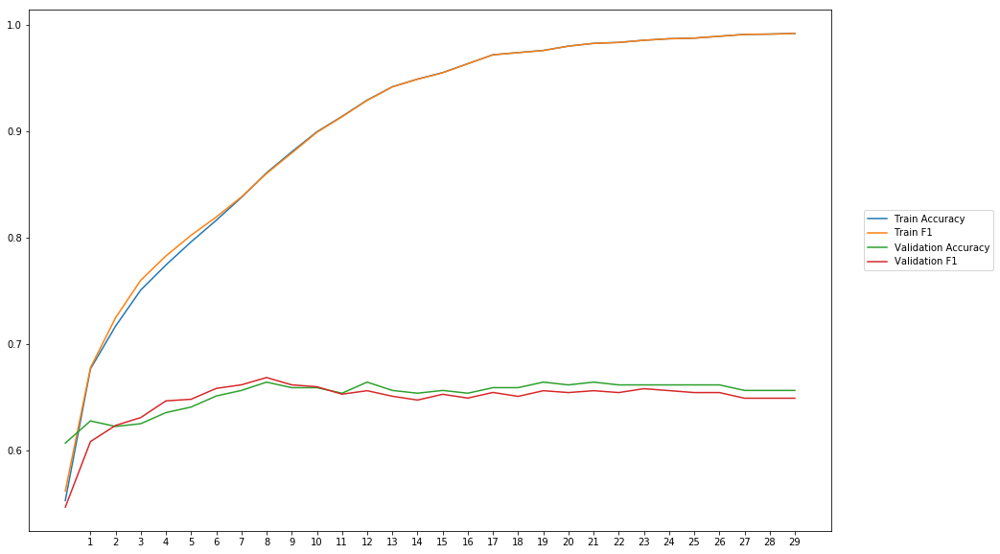

Average Accuracy: 65.23%
Average Precision: 65.30%
Average Recall: 64.26%
Average F1: 64.72%

-----Fold 3--------


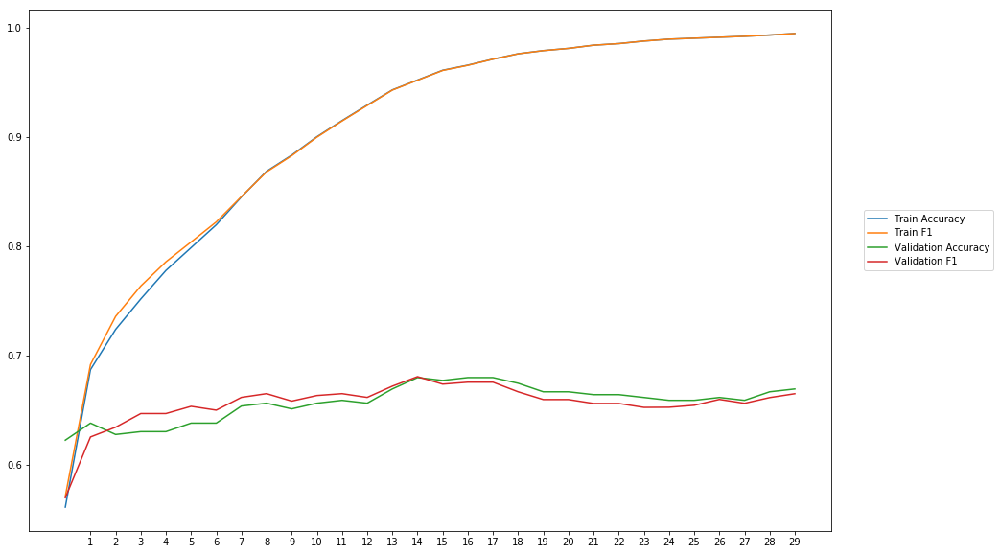

Average Accuracy: 65.71%
Average Precision: 65.53%
Average Recall: 65.79%
Average F1: 65.59%

-----Fold 4--------


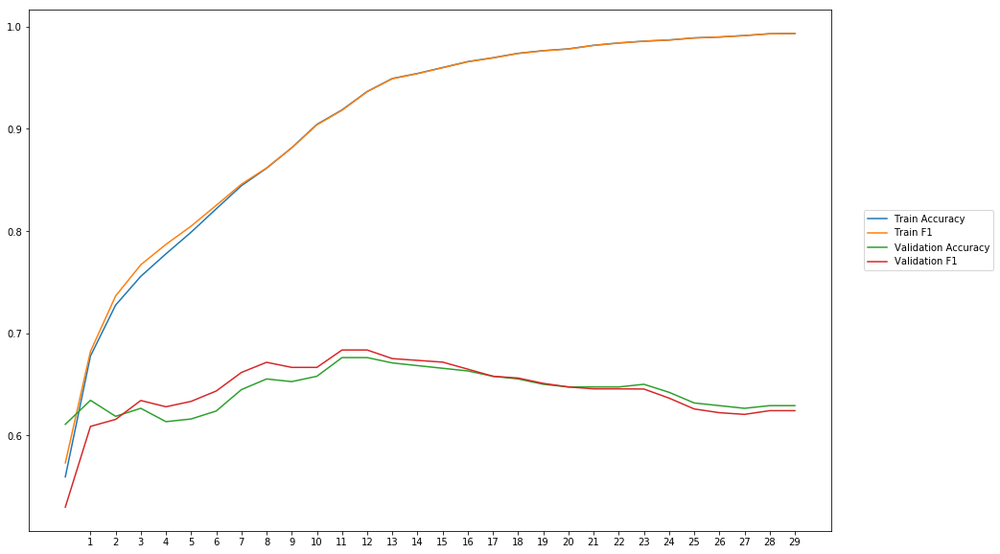

Average Accuracy: 64.40%
Average Precision: 64.22%
Average Recall: 64.82%
Average F1: 64.39%

-----Fold 5--------


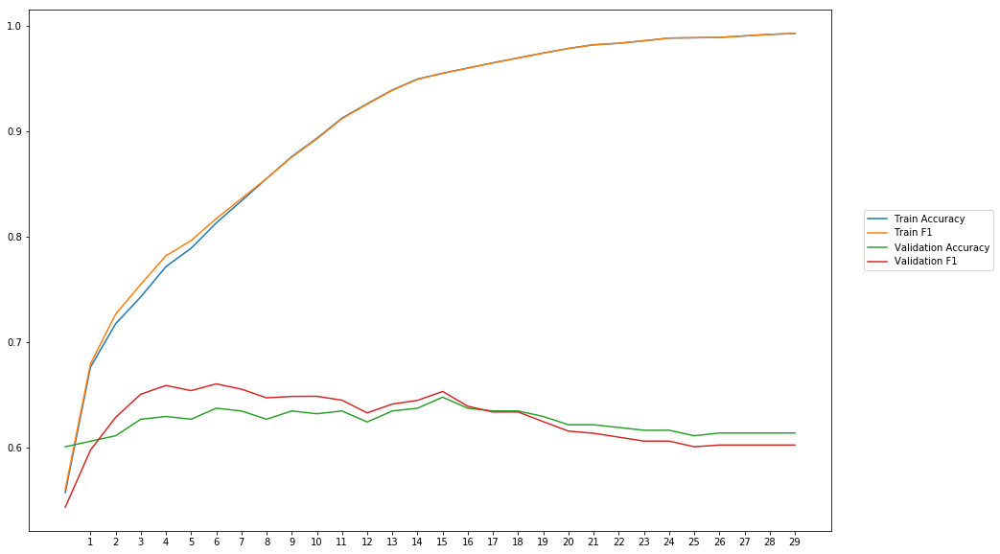

Average Accuracy: 62.45%
Average Precision: 62.13%
Average Recall: 63.44%
Average F1: 62.65%

-----Fold 6--------


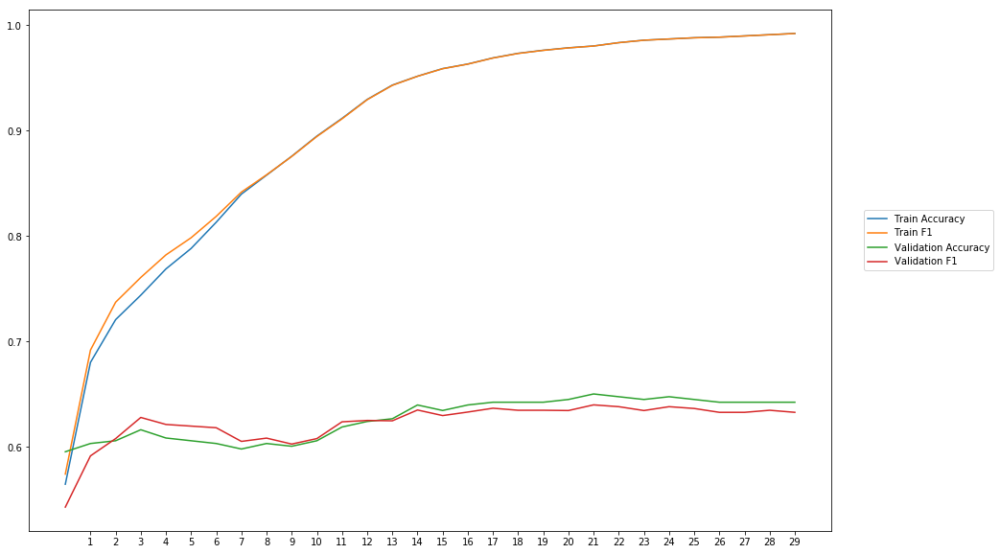

Average Accuracy: 62.68%
Average Precision: 62.86%
Average Recall: 61.82%
Average F1: 62.28%

-----Fold 7--------


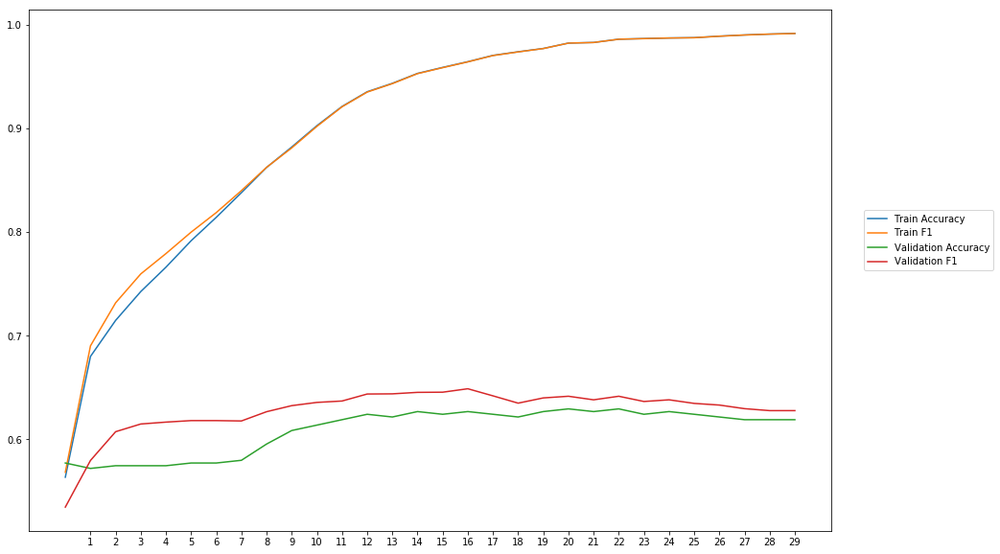

Average Accuracy: 60.91%
Average Precision: 59.85%
Average Recall: 66.13%
Average F1: 62.76%

-----Fold 8--------


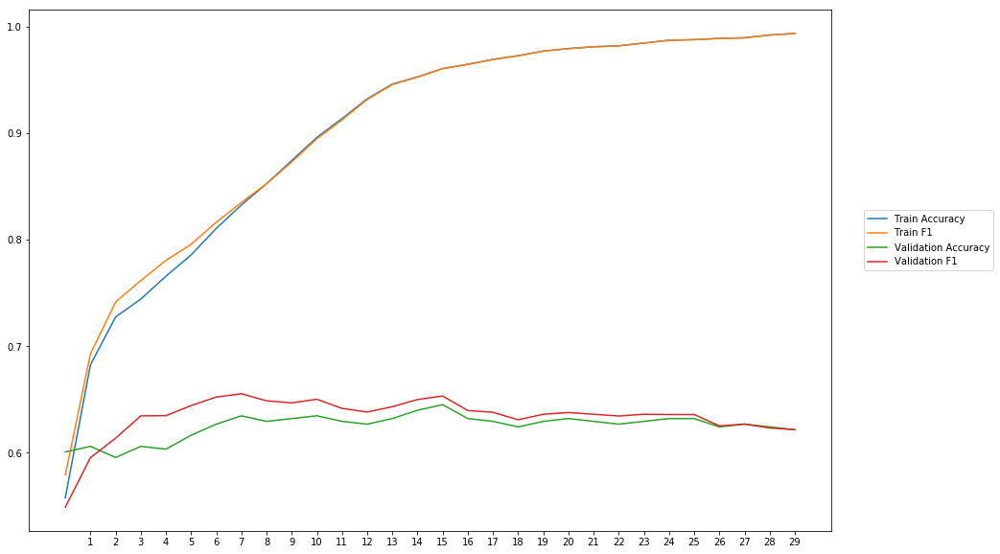

Average Accuracy: 62.49%
Average Precision: 61.79%
Average Recall: 65.15%
Average F1: 63.34%

-----Fold 9--------


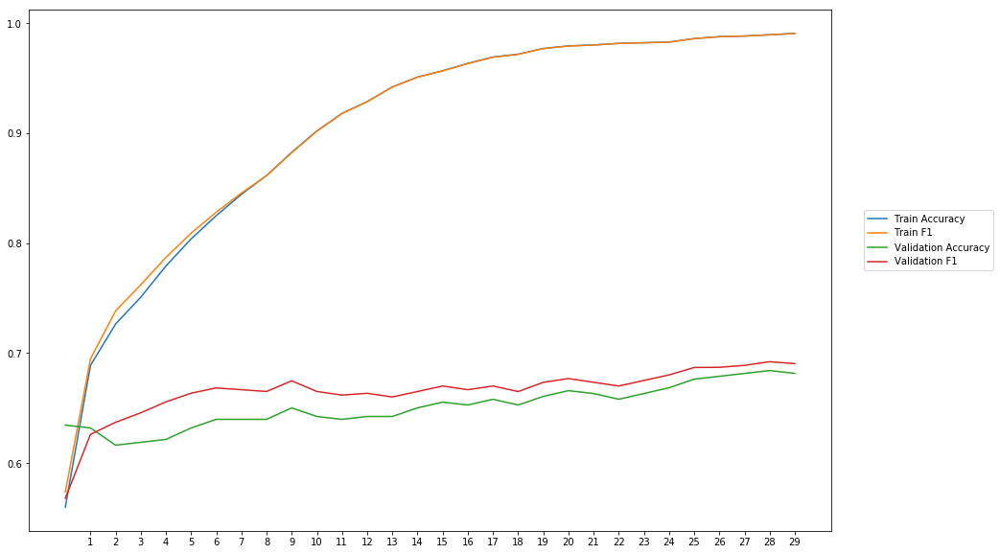

Average Accuracy: 65.13%
Average Precision: 63.93%
Average Recall: 69.58%
Average F1: 66.50%

-----Fold 10--------


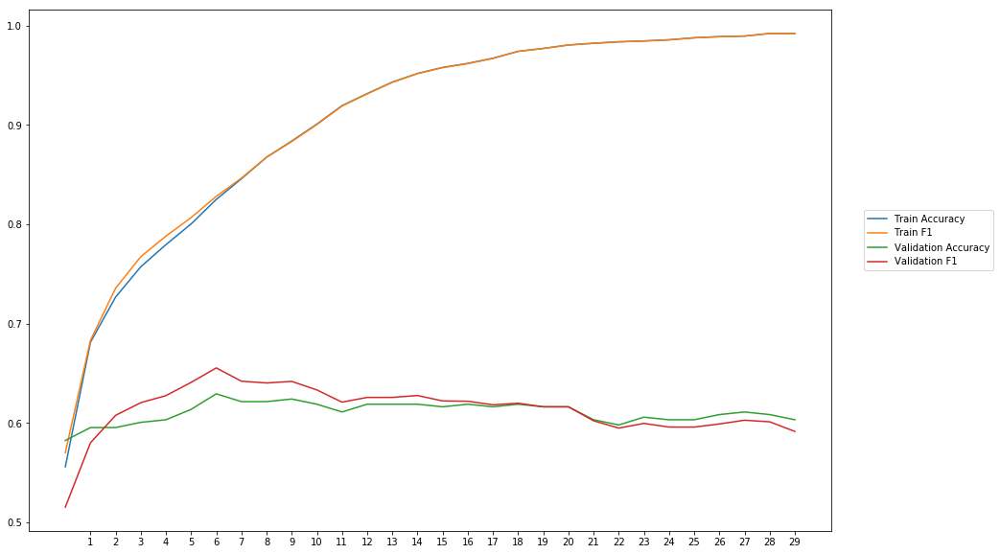

Average Accuracy: 61.06%
Average Precision: 60.72%
Average Recall: 62.18%
Average F1: 61.33%

-------Overallresults-------


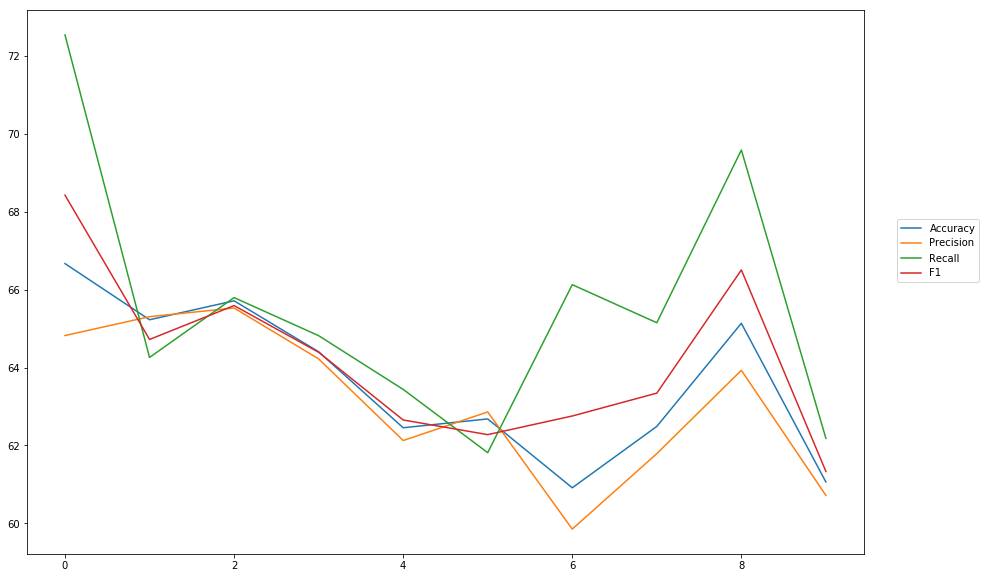

Accuracy: Mean = 63.67% (+/- 1.91%), Max = 66.67%, Min =  60.91%
Precision: Mean = 63.11% (+/- 1.86%), Max = 65.53%, Min =  59.85%
Recall: Mean = 65.57% (+/- 3.12%), Max = 72.53%, Min =  61.82%
F1: Mean = 64.20% (+/- 2.06%), Max = 68.42%, Min =  61.33%


In [41]:
cross_val_three_inputs(model_15, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_senti_vadar, train_labels, softmax, outputpath, 'separat_models_senti_blob_vadar')

## Separate models combine output

### average

In [43]:
#First model
wv_layer_16 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_16 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_16 = wv_layer_16(comment_input_16)
x_first_16 = Dense(600, activation='relu')(embedded_sequences_16)
x_first_16 = Flatten()(x_first_16)
first_preds_16 = Dense(2, activation='softmax')(x_first_16)

#Second model
senti_input_16_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_16 = Dense(600, activation='relu')(senti_input_16_blob)
second_preds_16 = Dense(2, activation='softmax')(x_second_16)

#Thrid model
senti_input_16_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_third_16 = Dense(600, activation='relu')(senti_input_16_vadar)
third_preds_16 = Dense(2, activation='softmax')(x_third_16)

#Concat outputs
preds_16 = average([first_preds_16, second_preds_16, third_preds_16])

model_16 = Model(inputs=[comment_input_16, senti_input_16_blob, senti_input_16_vadar], outputs=preds_16)
model_16.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_39 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_18 (Embedding)        (None, 40, 300)      3492600     input_39[0][0]                   
__________________________________________________________________________________________________
dense_60 (Dense)                (None, 40, 600)      180600      embedding_18[0][0]               
__________________________________________________________________________________________________
input_40 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
input_41 (


-----Fold 1--------


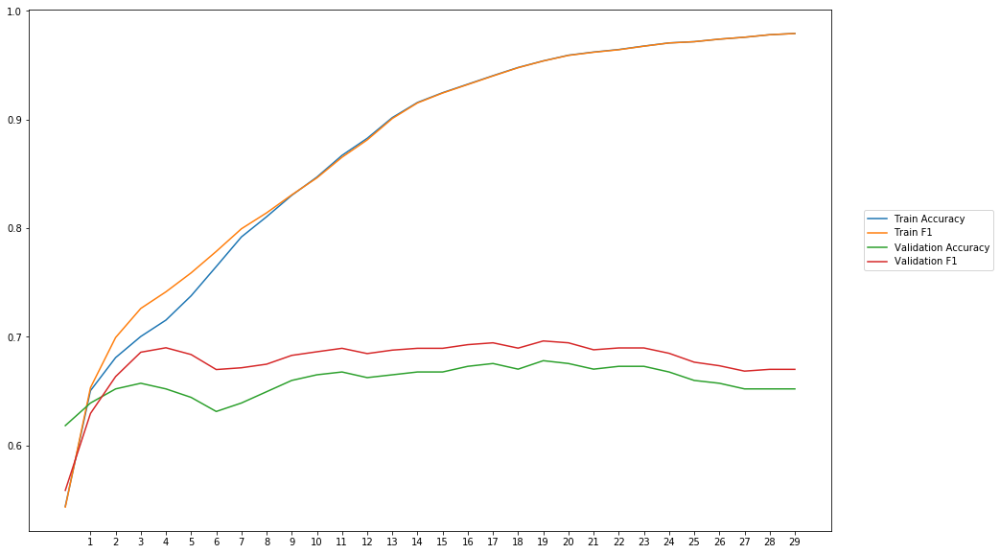

Average Accuracy: 65.88%
Average Precision: 64.10%
Average Recall: 72.03%
Average F1: 67.71%

-----Fold 2--------


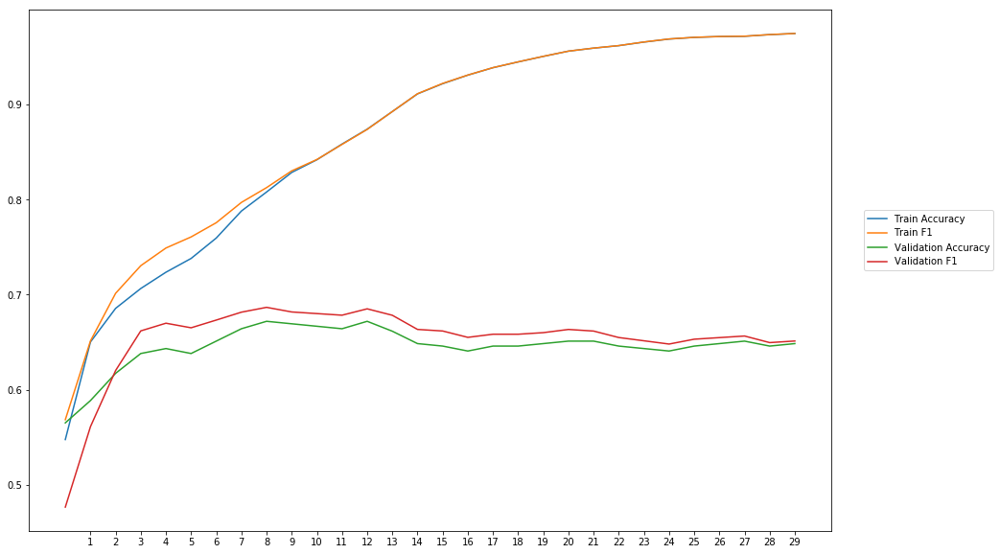

Average Accuracy: 64.52%
Average Precision: 63.37%
Average Recall: 67.70%
Average F1: 65.33%

-----Fold 3--------


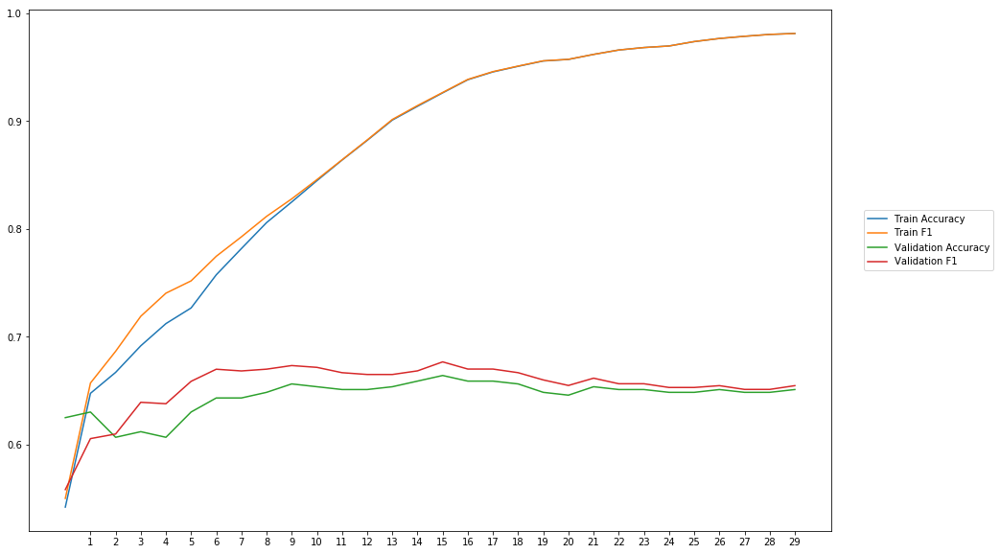

Average Accuracy: 64.51%
Average Precision: 63.53%
Average Recall: 67.64%
Average F1: 65.39%

-----Fold 4--------


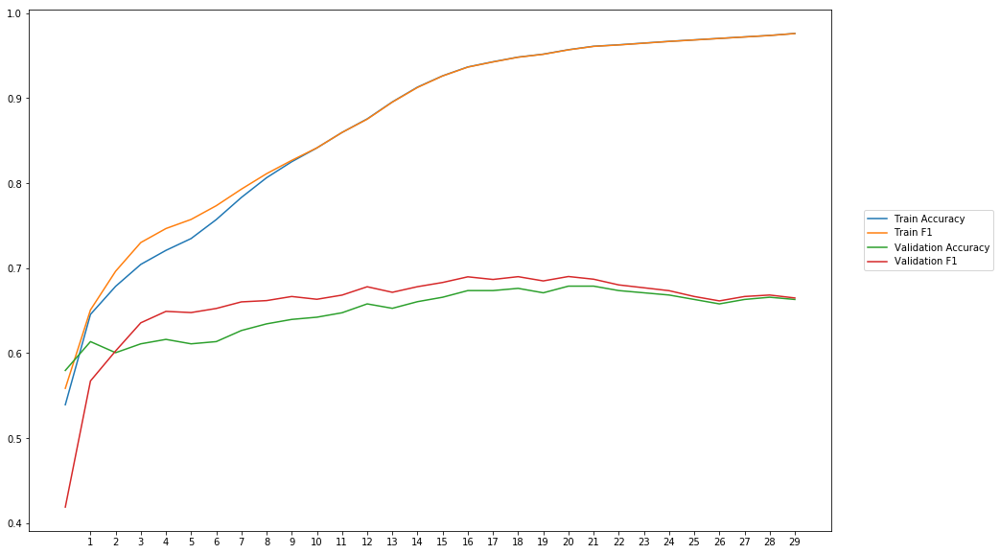

Average Accuracy: 64.84%
Average Precision: 63.97%
Average Recall: 68.22%
Average F1: 65.64%

-----Fold 5--------


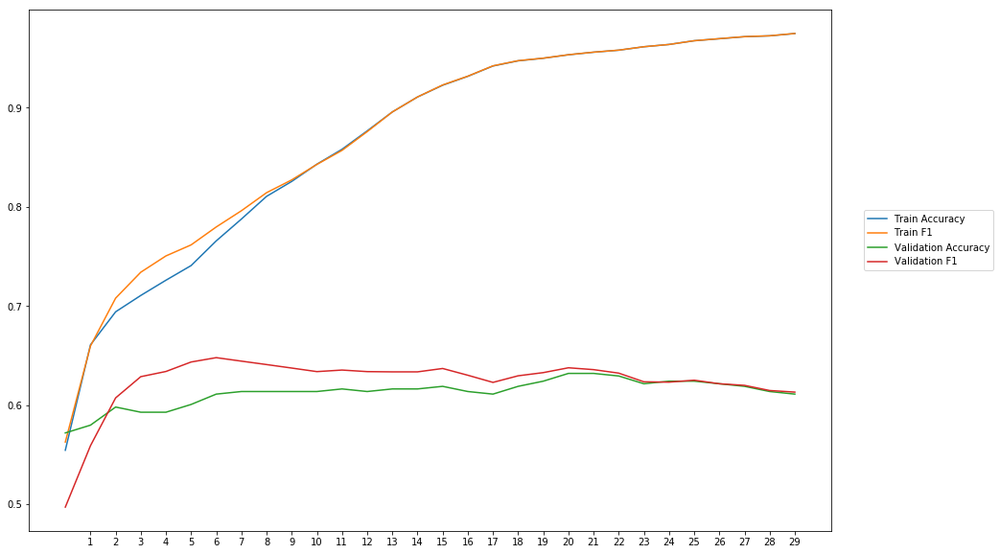

Average Accuracy: 61.25%
Average Precision: 60.49%
Average Recall: 64.66%
Average F1: 62.35%

-----Fold 6--------


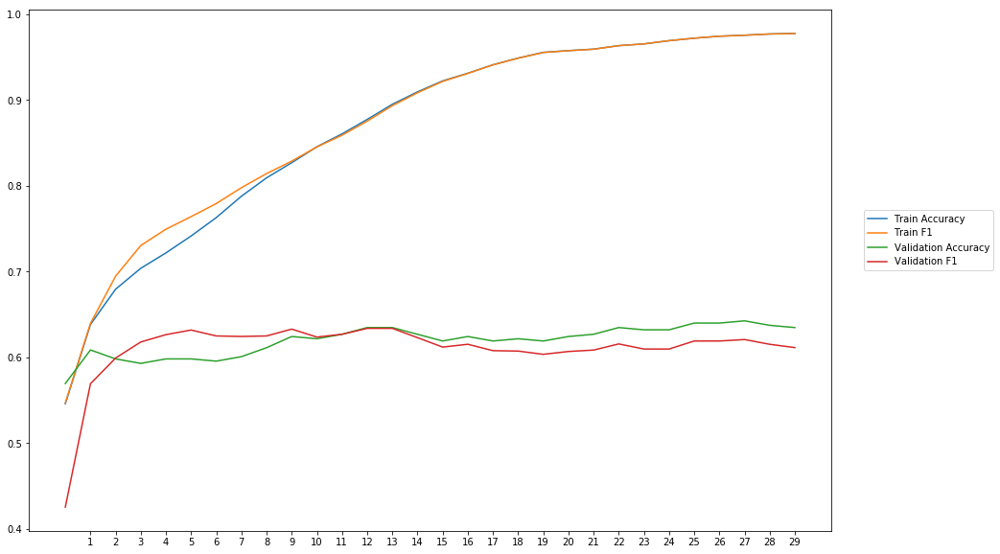

Average Accuracy: 61.94%
Average Precision: 62.50%
Average Recall: 60.09%
Average F1: 60.97%

-----Fold 7--------


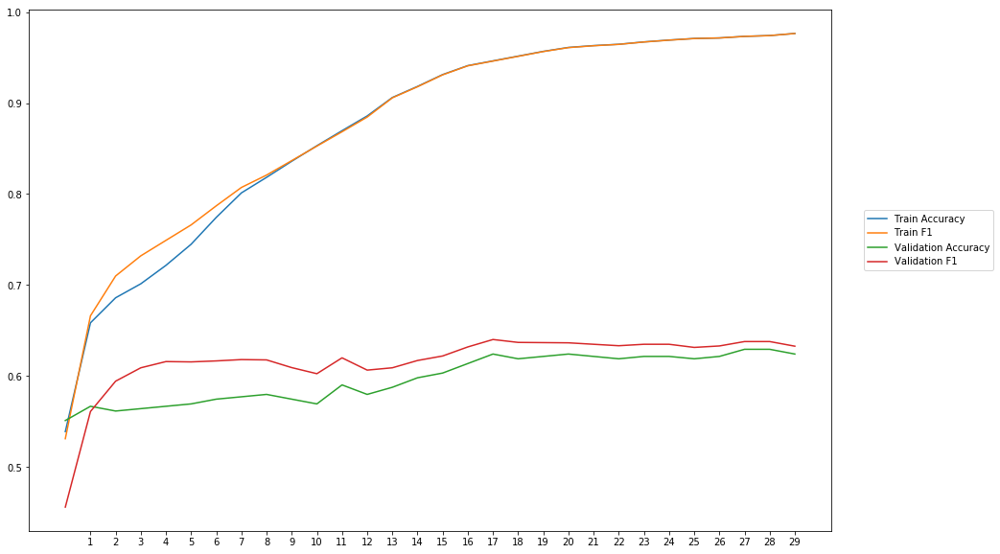

Average Accuracy: 59.73%
Average Precision: 58.78%
Average Recall: 65.06%
Average F1: 61.60%

-----Fold 8--------


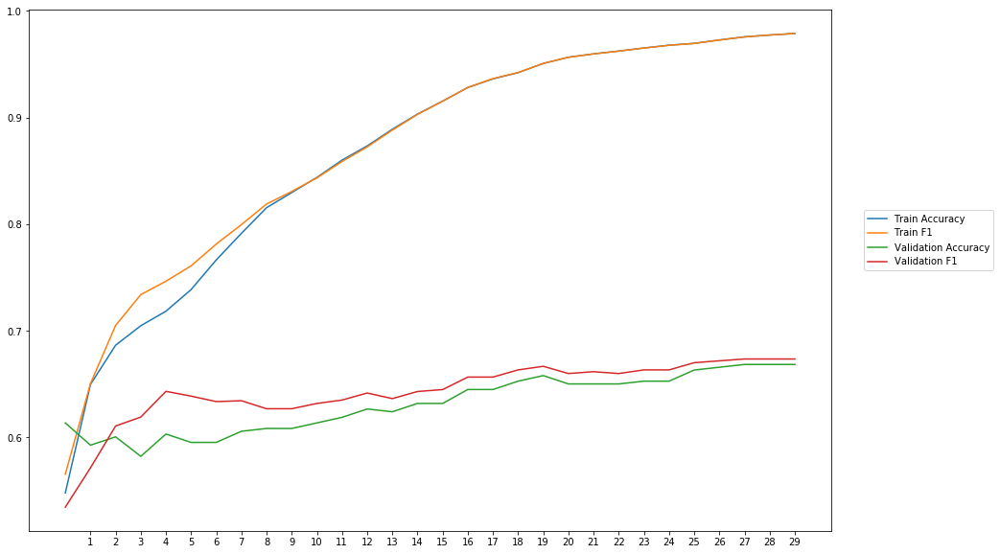

Average Accuracy: 63.14%
Average Precision: 62.32%
Average Recall: 66.72%
Average F1: 64.29%

-----Fold 9--------


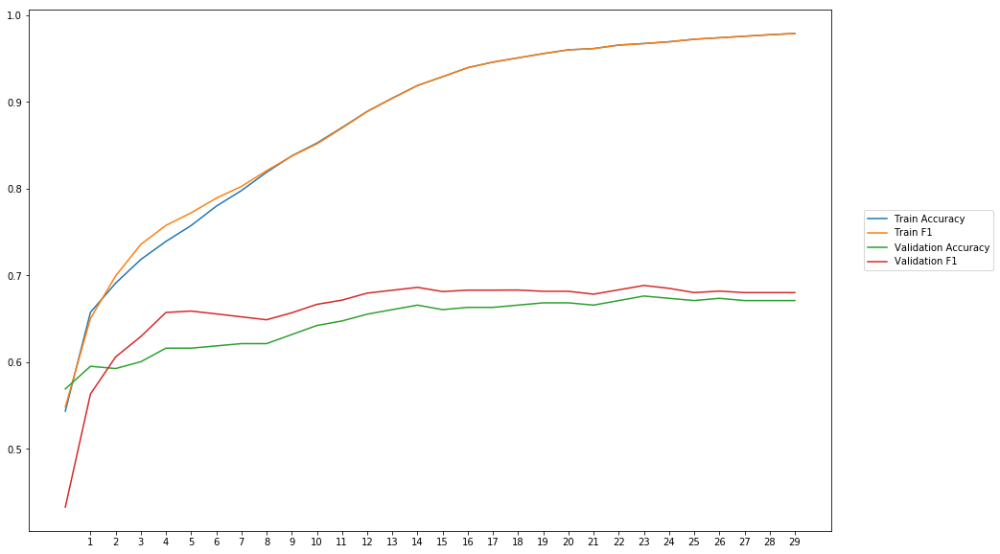

Average Accuracy: 64.63%
Average Precision: 63.32%
Average Recall: 69.39%
Average F1: 65.94%

-----Fold 10--------


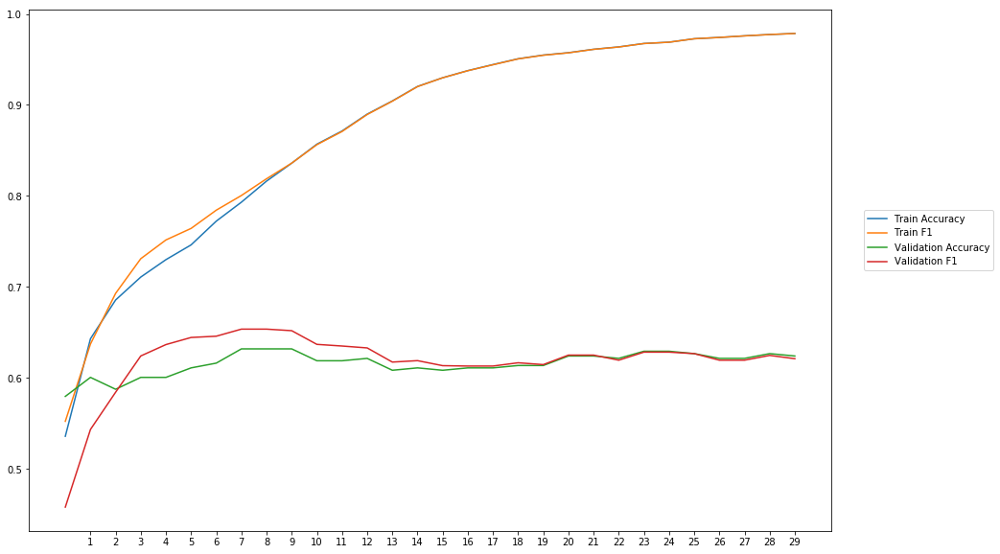

Average Accuracy: 61.58%
Average Precision: 61.28%
Average Recall: 62.88%
Average F1: 61.81%

-------Overallresults-------


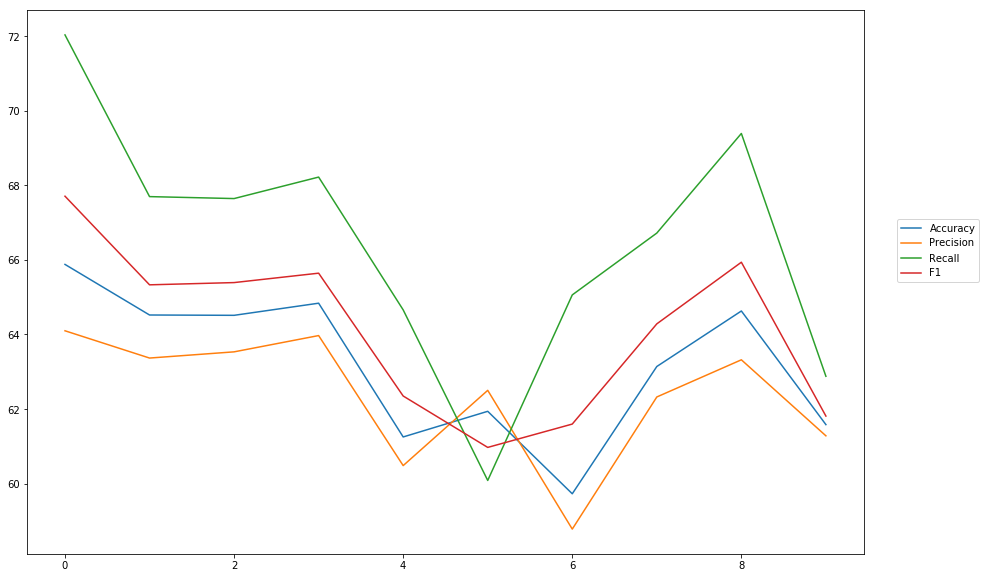

Accuracy: Mean = 63.20% (+/- 1.88%), Max = 65.88%, Min =  59.73%
Precision: Mean = 62.37% (+/- 1.63%), Max = 64.10%, Min =  58.78%
Recall: Mean = 66.44% (+/- 3.23%), Max = 72.03%, Min =  60.09%
F1: Mean = 64.10% (+/- 2.15%), Max = 67.71%, Min =  60.97%


In [45]:
cross_val_three_inputs(model_16, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_senti_vadar, train_labels, softmax, outputpath, 'combined_outputs_senti_blob_vadar')

## Test the best model with heldout testdata

In [ ]:
train_evaluate_two_inputs(model_2, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, test_data, test_pos, test_labels, softmax, outputpath, 'final_additionalFeature_pos')

In [ ]:
train_evaluate_two_inputs(model_10, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, test_data, test_pos, test_labels, softmax, outputpath, 'final_additionalFeature_blob')

In [ ]:
train_evaluate_two_inputs(model_12, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, test_data, test_pos, test_labels, softmax, outputpath, 'final_additionalFeature_vadar')